In [ ]:
# goal of this analysis is to get an idea of whether SST cells are being driven by the VIP-halo stim.
# In particular, what is the differential degree of drive?

In [1]:
import pyute as ut
import matplotlib.pyplot as plt
import h5py
import skimage.segmentation as sks
import skimage.morphology as skm
import numpy as np
import pdb
import os
import size_contrast_analysis as sca
import sklearn
import sklearn.linear_model as sklm
from importlib import reload
import size_contrast_opto_analysis as scoa
import scipy.interpolate as sip
import scipy.stats as sst
import naka_rushton_analysis as nra
import scipy.spatial.distance as ssd
import sim_utils
reload(ut)
%matplotlib notebook

/Users/dan/Documents/code/downloads/OASIS/oasis/functions.py:14: UserWarning: Could not find cvxpy. Don't worry, you can still use OASIS, just not the slower interior point methods we compared to in the papers.
  "just not the slower interior point methods we compared to in the papers.")


In [2]:
dsfile = '../shared_data/pyr_l4_data_struct.hdf5'

In [3]:
nbefore = 8
nafter = 8

In [4]:
import pandas as pd
def select_trials(trial_info,selector,training_frac,include_all=False):
    # dict saying what to do with each trial type. If a function, apply that function to the trial info column to
    # obtain a boolean indexing variable
    # if 0, then the tuning output should be indexed by that variable
    # if 1, then that variable will be marginalized over in the tuning output
    def gen_train_test_exptwise(ti):
        ntrials = ti[params[0]].size
        gd = np.ones((ntrials,),dtype='bool')
        for param in params:
            if callable(selector[param]): # all the values of selector that are functions, ignore trials where that function evaluates to False
                exclude = ~selector[param](ti[param])
                gd[exclude] = False
        condition_list = gen_condition_list(ti,selector) # automatically, separated out such that each half of the data gets an equivalent fraction of trials with each condition type
        condition_list = [c[gd] for c in condition_list]
        in_training_set = np.zeros((ntrials,),dtype='bool')
        in_test_set = np.zeros((ntrials,),dtype='bool')
        to_keep = output_training_test(condition_list,training_frac)
        in_training_set[gd] = to_keep
        in_test_set[gd] = ~to_keep
        if include_all:
            train_test = [in_training_set,in_test_set,np.logical_or(in_training_set,in_test_set)]
        else:
            train_test = [in_training_set,in_test_set]
        return train_test,ntrials

    params = list(selector.keys())
    keylist = list(trial_info.keys())
    if isinstance(trial_info[keylist[0]],dict):
        ntrials = {}
        train_test = {}
        for key in trial_info.keys():
            ti = trial_info[key]
            train_test[key],ntrials[key] = gen_train_test_exptwise(ti)
    else:
        ti = trial_info
        train_test,ntrials = gen_train_test_exptwise(ti)

    return train_test

def gen_condition_list(ti,selector,filter_selector=lambda x:True):
# ti: trial_info generated by ut.compute_tavg_dataframe
# selector: dict where each key is a param in ti.keys(), and each value is either a callable returning a boolean,
# to be applied to ti[param], or an input to the function filter_selector
# filter selector: if filter_selector(selector[param]), the tuning curve will be separated into the unique elements of ti[param].
    params = list(selector.keys())
    condition_list = []
    for param in params:
        if not callable(selector[param]) and filter_selector(selector[param]):
            condition_list.append(ti[param])
    return condition_list

def output_training_test(condition_list,training_frac):
    # output training and test sets balanced for conditions
    # condition list, generated by gen_condition_list, has a row for each condition that should be equally assorted
    if not isinstance(condition_list,list):
        condition_list = [condition_list.copy()]
    iconds,uconds = zip(*[pd.factorize(c,sort=True) for c in condition_list])
    #uconds = [np.sort(u) for u in uconds]
    nconds = np.array([u.size for u in uconds])
    in_training_set = np.zeros(condition_list[0].shape,dtype='bool')
    for iflat in range(np.prod(nconds)):
        coords = np.unravel_index(iflat,tuple(nconds))
        lkat = np.where(ut.k_and(*[iconds[ic] == coords[ic] for ic in range(len(condition_list))]))[0]
        n_train = int(np.round(training_frac*len(lkat)))
        to_train = np.random.choice(lkat,n_train,replace=False)
        in_training_set[to_train] = True
    #assert(True==False)
    return in_training_set

In [5]:
df,roi_info,trial_info = ut.compute_tavg_dataframe(dsfile,expttype='size_contrast_0')


<HDF5 group "/session_181127_M10073" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'retinotopy_0', 'size_contrast_0']
<HDF5 group "/session_190202_M10075" (9 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'figure_ground_0', 'mouse_id', 'retinotopy_0', 'size_contrast_0']
<HDF5 group "/session_190304_M10077" (9 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'figure_ground_0', 'mouse_id', 'retinotopy_0', 'size_contrast_0']
<HDF5 group "/session_190607_M10443" (9 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'figure_ground_0', 'mouse_id', 'retinotopy_0', 'size_contrast_0']
<HDF5 group "/session_190620_M10616" (9 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'figure_ground_0', 'mouse_id', 'retinotopy_0', 'size_contrast_0']
<HDF5 group "/session_190620_M10619" (9 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 

In [7]:
tuning,uparam,displacement,pval = sim_utils.compute_tuning(dsfile,datafield='decon',running=False,expttype='size_contrast_0')

<HDF5 group "/session_181127_M10073" (8 members)>
decon
0.8257142857142857
<HDF5 group "/session_190202_M10075" (9 members)>
decon
0.6034722222222222
<HDF5 group "/session_190304_M10077" (9 members)>
decon
0.5597222222222222


/Users/dan/Documents/code/adesnal/pyute.py:1179: RuntimeWarning: Mean of empty slice
  tuning[:,itype] = np.nanmean(data[cell_criteria][:,these_trials],1)


<HDF5 group "/session_190607_M10443" (9 members)>
decon
0.14097222222222222
<HDF5 group "/session_190620_M10616" (9 members)>
decon
0.5431547619047619


/Users/dan/Documents/code/adesnal/pyute.py:1179: RuntimeWarning: Mean of empty slice
  tuning[:,itype] = np.nanmean(data[cell_criteria][:,these_trials],1)


<HDF5 group "/session_190620_M10619" (9 members)>
decon
0.6006944444444444


/Users/dan/Documents/code/adesnal/pyute.py:1179: RuntimeWarning: Mean of empty slice
  tuning[:,itype] = np.nanmean(data[cell_criteria][:,these_trials],1)


<HDF5 group "/session_190624_M10615" (8 members)>
decon
0.08234126984126984
<HDF5 group "/session_190627_M10616" (9 members)>
decon
0.7876984126984127
<HDF5 group "/session_190701_M10615" (8 members)>
decon
0.6691468253968254
<HDF5 group "/session_191212_M0762" (8 members)>
decon
0.8219246031746031


In [8]:
def gen_sc_selector():
    selector = {}
    selector['running'] = lambda x: np.logical_not(x)
    selector['stimulus_size_deg'] = 0
    selector['stimulus_contrast'] = 0
    selector['stimulus_direction_deg'] = 1
    return selector
selector = gen_sc_selector()


In [85]:
reload(ut)
nreps = 5
train_test = [None for irep in range(nreps)]
for irep in range(nreps):
    train_test[irep] = ut.select_trials(trial_info,selector,0.5,seed=irep)

In [86]:
reload(sca)
equate_ori = True
auroc,reg,proc,top_score = [[None for irep in range(nreps)] for _ in range(4)]
for irep in range(nreps):
    print(irep)
    # compute encoding axes based on training set trials
    reg[irep],proc[irep],top_score[irep] = sca.compute_encoding_axes(dsfile,expttype='size_contrast_0',training_set=train_test[irep],running_trials=False,equate_ori=equate_ori)
    reg_same = reg[irep].copy()
    for r in reg_same:
        if not r is None:
            for rr in r:
                if not rr is None:
                    rr[1] = rr[0].copy()
    # compute auroc based on test set trials: take population activity vectors for 0 and target contrast, use regression
    # trained on training set to predict contrast for both sets of population activity vectors, compute AUROC of predicted contrasts for both
    auroc[irep] = sca.compute_encoding_axis_auroc(reg_same,proc[irep])

0


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd


1


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd


2


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd


3


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd


4


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2500: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd


In [12]:
iexpt = 0
icutoff = 0
isize = 0
iangle = 0

In [87]:
contrast_axis,contrast_axis_svd = [[[None for _ in p] for p in proc] for _ in range(2)]
for irep in range(nreps):
    for iexpt in range(len(proc[irep])):
        if not reg[irep][iexpt][icutoff] is None:
            contrast_axis[irep][iexpt],contrast_axis_svd[irep][iexpt] = [[None for _ in reg[irep][iexpt][icutoff]] for _ in range(2)]
            for isize in range(len(reg[irep][iexpt][icutoff])):
                contrast_axis[irep][iexpt][isize],contrast_axis_svd[irep][iexpt][isize] = [[None for _ in reg[irep][iexpt][icutoff][isize]] for _ in range(2)]
                for iangle in range(len(reg[irep][iexpt][icutoff][isize])):
                    contrast_axis[irep][iexpt][isize][iangle] = proc[irep][iexpt]['u'][:,:proc[irep][iexpt]['cutoffs'][icutoff]] @ reg[irep][iexpt][icutoff][isize][iangle].coef_
                    contrast_axis_svd[irep][iexpt][isize][iangle] = reg[irep][iexpt][icutoff][isize][iangle].coef_
                contrast_axis[irep][iexpt][isize] = np.concatenate([c[np.newaxis] for c in contrast_axis[irep][iexpt][isize]])
                contrast_axis_svd[irep][iexpt][isize] = np.concatenate([c[np.newaxis] for c in contrast_axis_svd[irep][iexpt][isize]])
            contrast_axis[irep][iexpt] = np.concatenate([c[np.newaxis] for c in contrast_axis[irep][iexpt]])
            contrast_axis_svd[irep][iexpt] = np.concatenate([c[np.newaxis] for c in contrast_axis_svd[irep][iexpt]])

<IPython.core.display.Javascript object>


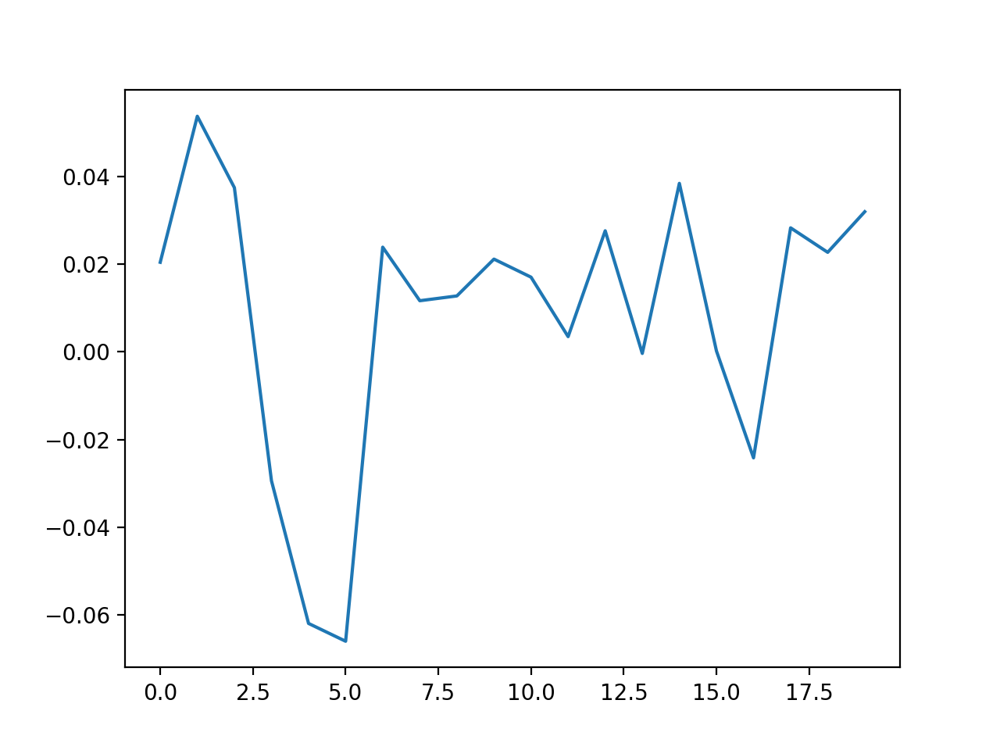

In [15]:
plt.figure()
plt.plot(reg[iexpt][icutoff][isize][iangle].coef_)

In [16]:
contrast_axis_svd[iexpt].shape

(6, 8, 20)

<IPython.core.display.Javascript object>


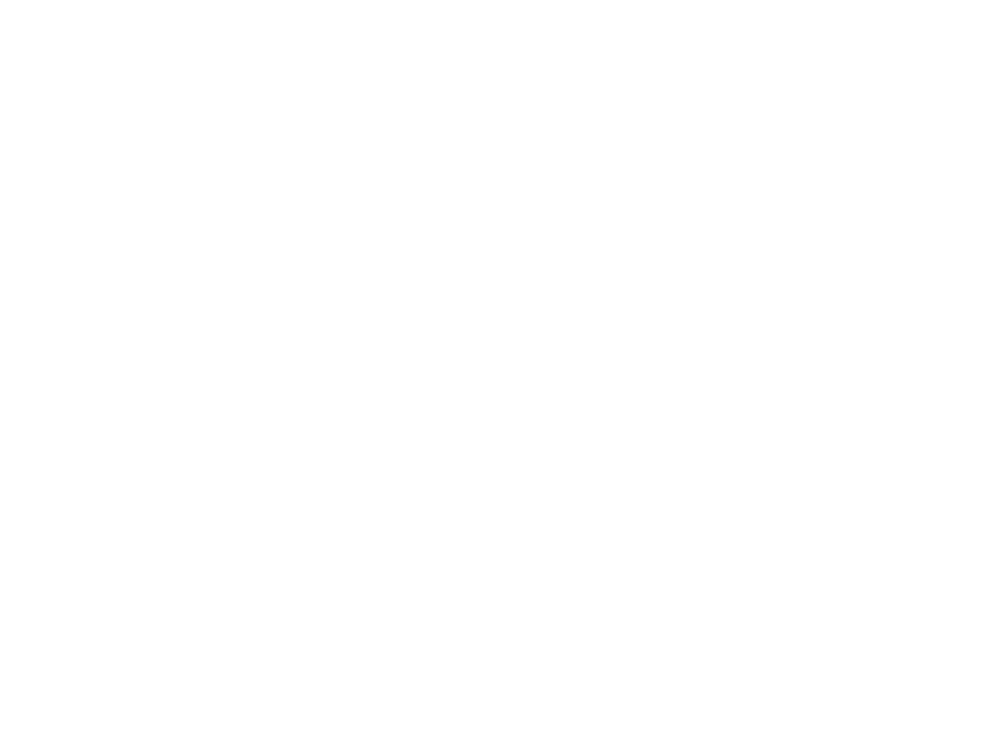

AttributeError: 'list' object has no attribute 'shape'

In [88]:
for iexpt in range(len(contrast_axis)):
    if not contrast_axis[iexpt] is None:
        plt.figure()
        for isize in range(contrast_axis_svd[iexpt].shape[0]):
            plt.subplot(2,3,isize+1)
            plt.imshow(ssd.squareform(ssd.pdist(contrast_axis_svd[iexpt][isize],metric='cosine')),vmin=0,vmax=2)

<IPython.core.display.Javascript object>


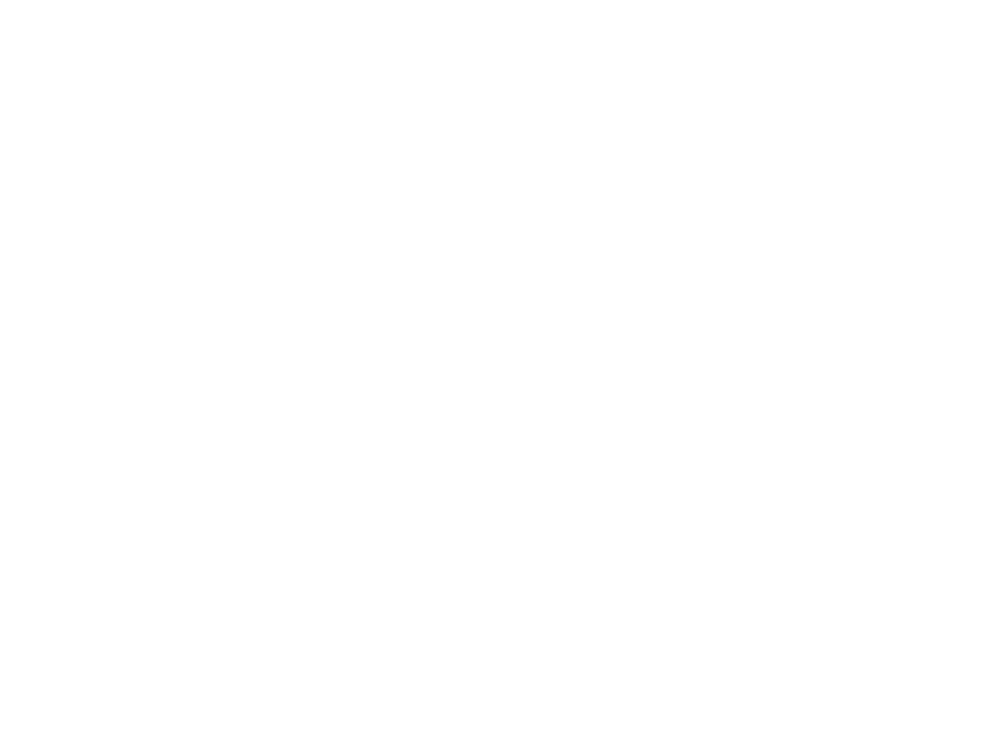

AttributeError: 'list' object has no attribute 'shape'

In [55]:
for iexpt in range(len(contrast_axis_svd)):
    if not contrast_axis_svd[iexpt] is None:
        plt.figure()
        for iangle in range(contrast_axis_svd[iexpt].shape[1]):
            plt.subplot(2,4,iangle+1)
            plt.imshow(ssd.squareform(ssd.pdist(contrast_axis_svd[iexpt][:,iangle],metric='cosine')),vmin=0,vmax=2)

<IPython.core.display.Javascript object>


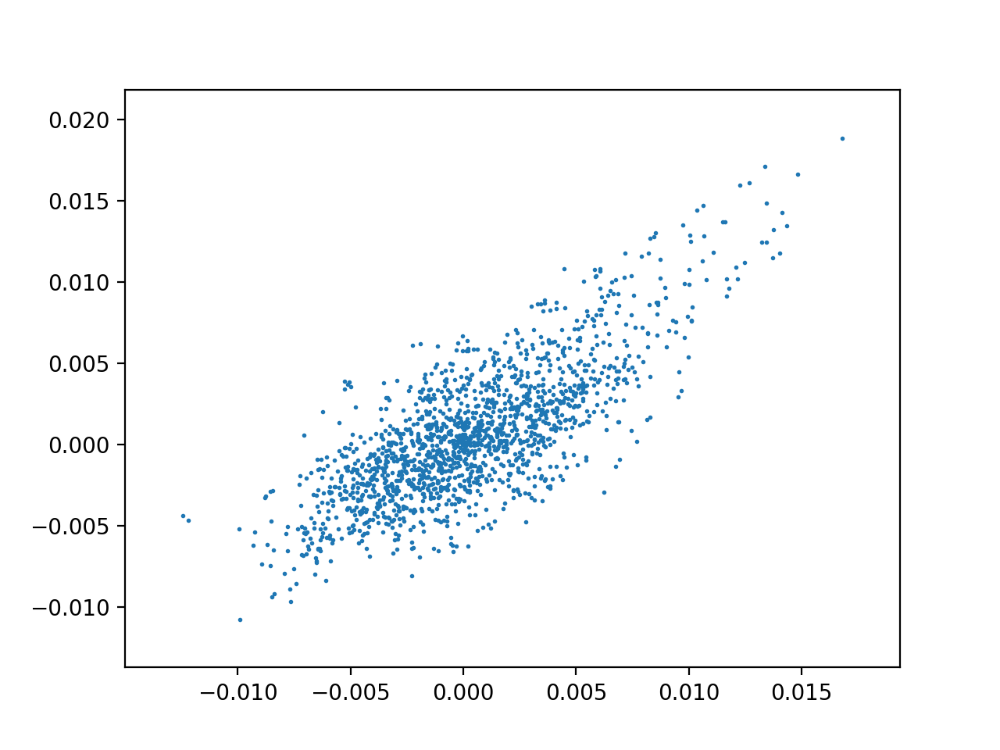

In [20]:
plt.figure()
iexpt = 0
isize = 0
iangle1,iangle2 = 0,1
plt.scatter(contrast_axis[iexpt][isize,iangle1],contrast_axis[iexpt][isize,iangle2],s=1)

In [56]:
npyfile = np.load('../behavior/size_contrast_behavior_summary.npy',allow_pickle=True)[()]
lick_rate,size,contrast,animal_id = [npyfile[key] for key in ['lick_rate','size','contrast','animal_id']]

In [89]:
fa = np.nanmean(lick_rate[contrast==0])
reload(sca)
# auroc[irep] = sca.compute_encoding_axis_auroc(reg_same,proc)
hit = [None for irep in range(nreps)]
for irep in range(nreps):
    hit[irep] = sca.compute_encoding_axis_hit_from_fa(reg[irep],proc[irep],fa=fa)

In [90]:
modal_uparam = [np.array([ 5.        ,  8.21865442, 13.50925609, 22.20558144, 36.5       , 60.        ]),
                np.array([0.  , 0.06, 0.12, 0.25, 0.5 , 1.  ])]
usize,ucontrast = modal_uparam

In [91]:
hit_mean = [np.nan*np.ones((len(hit[irep]),modal_uparam[0].size,modal_uparam[1].size)) for irep in range(nreps)]
for irep in range(nreps):
    for iexpt in range(hit_mean[irep].shape[0]):
        if not hit[irep][iexpt] is None:
            this_data = np.nanmean(hit[irep][iexpt],axis=2)
            this_uparam = [proc[irep][iexpt]['usize'],proc[irep][iexpt]['ucontrast']]
            ut.assign_from_uparam(hit_mean[irep][iexpt],modal_uparam,this_data,this_uparam,ignore_first=0)
hit_mean = np.concatenate([h[np.newaxis] for h in hit_mean],axis=0)
hit_mean = np.nanmean(hit_mean,0)

/Users/dan/Documents/code/adesnal/pyute.py:1673: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  big_ind = big_ind*iit[slc]
/Users/dan/Documents/code/adesnal/pyute.py:1664: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  a[[slice(None) for iind in range(ignore_first)]+[a_bool]] = b[[slice(None) for iind in range(ignore_first)]+[b_bool]]
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: Mean of empty slice
  if __name__ == '__main__':


<IPython.core.display.Javascript object>


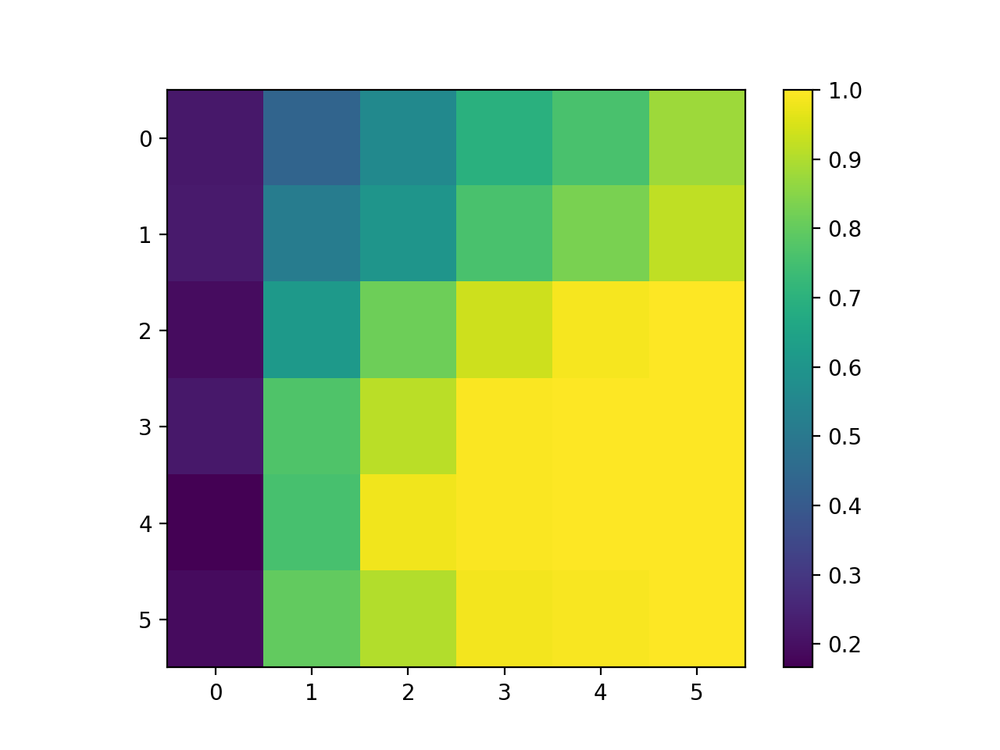

In [92]:
plt.figure()
plt.imshow(np.nanmean(hit_mean,0))
plt.colorbar()

In [93]:
contrast_bdy = 100*np.concatenate(((0,),0.5*(ucontrast[:-1]+ucontrast[1:]),(1.01,)))
size_bdy = np.concatenate(((0,),0.5*(usize[:-1]+usize[1:]),(60,)))
def nansem(arr):
    return np.nanstd(arr)/np.sqrt(arr.size)
def boot_pct(arr,pct):
    return ut.bootstrap(arr,fn=np.nanmean,axis=0,pct=(pct,))[0]
lick_rate_interp = sst.binned_statistic_2d(size,contrast,lick_rate,bins=(size_bdy,contrast_bdy),statistic=np.nanmean).statistic
lick_rate_interp_lb = sst.binned_statistic_2d(size,contrast,lick_rate,bins=(size_bdy,contrast_bdy),statistic=lambda x: boot_pct(x,16)).statistic
lick_rate_interp_ub = sst.binned_statistic_2d(size,contrast,lick_rate,bins=(size_bdy,contrast_bdy),statistic=lambda x: boot_pct(x,84)).statistic

<IPython.core.display.Javascript object>


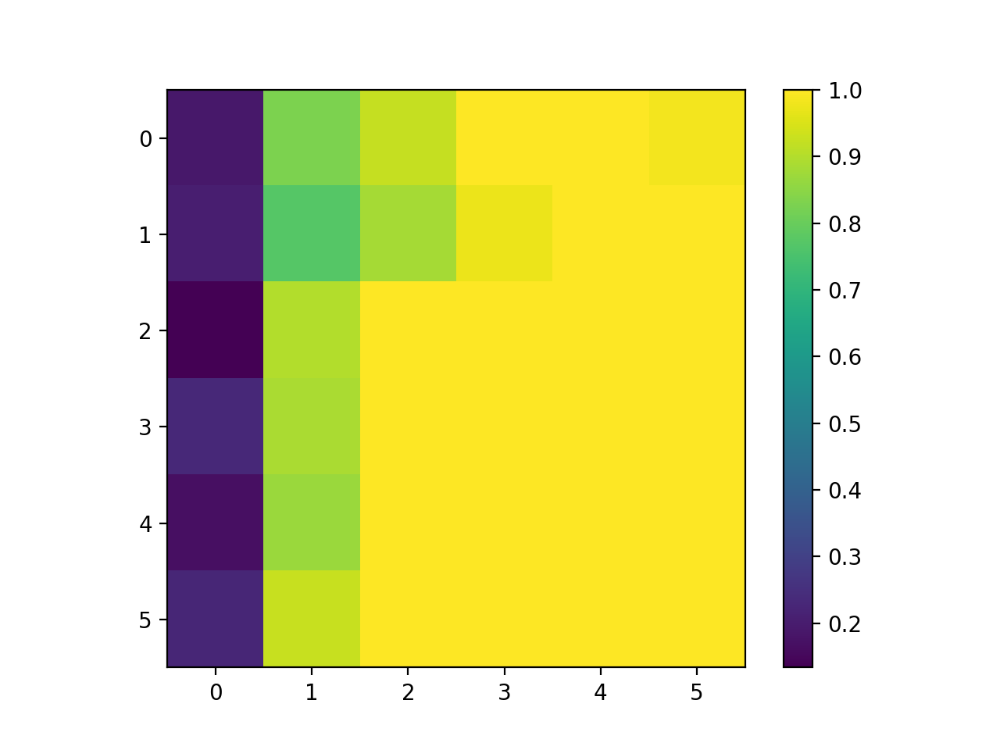

In [94]:
plt.figure()
plt.imshow(hit_mean[iexpt])
plt.colorbar()

<IPython.core.display.Javascript object>


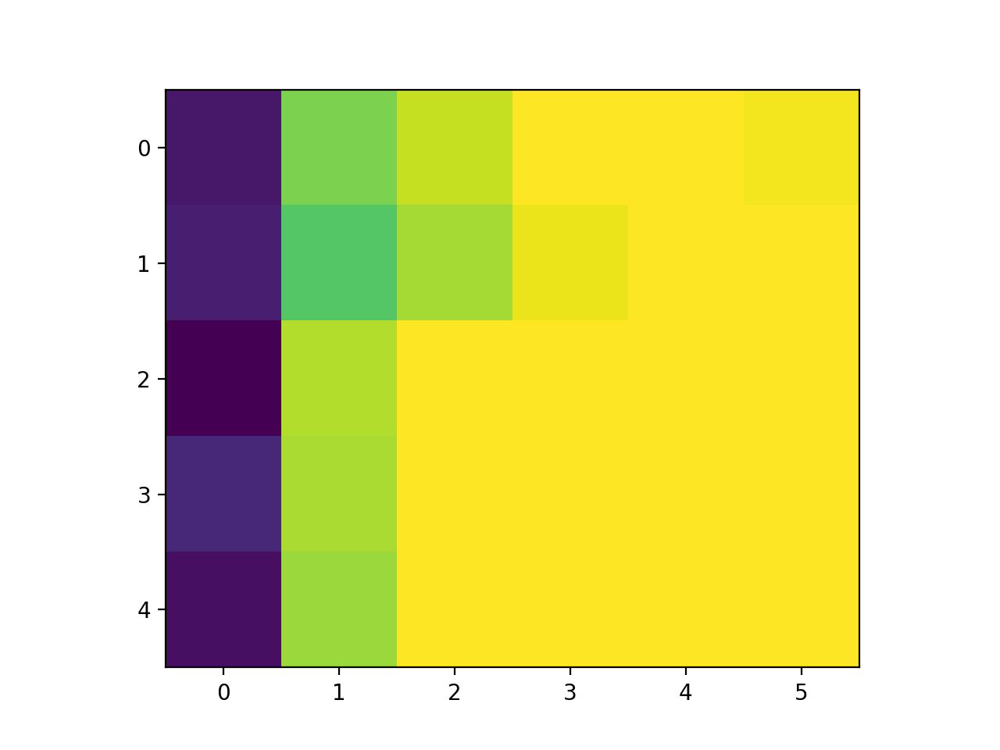

In [100]:
plt.figure()
plt.imshow(hit_mean[iexpt][slkat,:][:,clkat])

In [122]:
reload(nra)
c50s_decoder = np.nan*np.ones(hit_mean.shape[:2])
a0s_decoder = np.nan*np.ones(hit_mean.shape[:2])
a1s_decoder = np.nan*np.ones(hit_mean.shape[:2])
c50std_decoder = np.nan*np.ones(hit_mean.shape[:2])
for iexpt in range(hit_mean.shape[0]):
    slkat = np.sum(~np.isnan(hit_mean[iexpt]),1)>0
    clkat = np.sum(~np.isnan(hit_mean[iexpt]),0)>0
    if slkat.sum() and clkat.sum():
        x,cov = nra.fit_opt_params_weibull(100*ucontrast[clkat],hit_mean[iexpt][slkat,:][:,clkat])
        c50s_decoder[iexpt][slkat] = x[2*slkat.sum():3*slkat.sum()]
#         a0s_decoder[iexpt][slkat] = x[0*slkat.sum():1*slkat.sum()]
#         a1s_decoder[iexpt][slkat] = x[1*slkat.sum():2*slkat.sum()]
        c50std_decoder[iexpt][slkat] = np.sqrt(np.diag(cov[2*slkat.sum():3*slkat.sum(),2*slkat.sum():3*slkat.sum()]))
    

In [123]:
size_by_animal = [None for _ in range(int(animal_id.max()+1))]
c50s_animal = [None for _ in range(int(animal_id.max()+1))]
c50std_animal = [None for _ in range(int(animal_id.max()+1))]
for this_id in np.unique(animal_id).astype('int'):
    these_sizes = np.unique(size[animal_id==this_id])
    size_by_animal[this_id] = these_sizes
    c50s_animal[this_id] = np.nan*np.ones((len(these_sizes),))
    c50std_animal[this_id] = np.nan*np.ones((len(these_sizes),))
    for isize,this_size in enumerate(these_sizes):
        lkat = (animal_id==this_id) & (size==this_size)
        these_contrasts = contrast[lkat]
        these_licks = lick_rate[lkat]
        x,cov = nra.fit_opt_params_weibull(these_contrasts,lick_rate[np.newaxis,lkat])
        c50s_animal[this_id][isize] = x[2]
        c50std_animal[this_id][isize] = np.sqrt(cov[2,2])
c50s_animal = np.concatenate(c50s_animal)
c50std_animal = np.concatenate(c50std_animal)
size_by_animal = np.concatenate(size_by_animal)

<IPython.core.display.Javascript object>


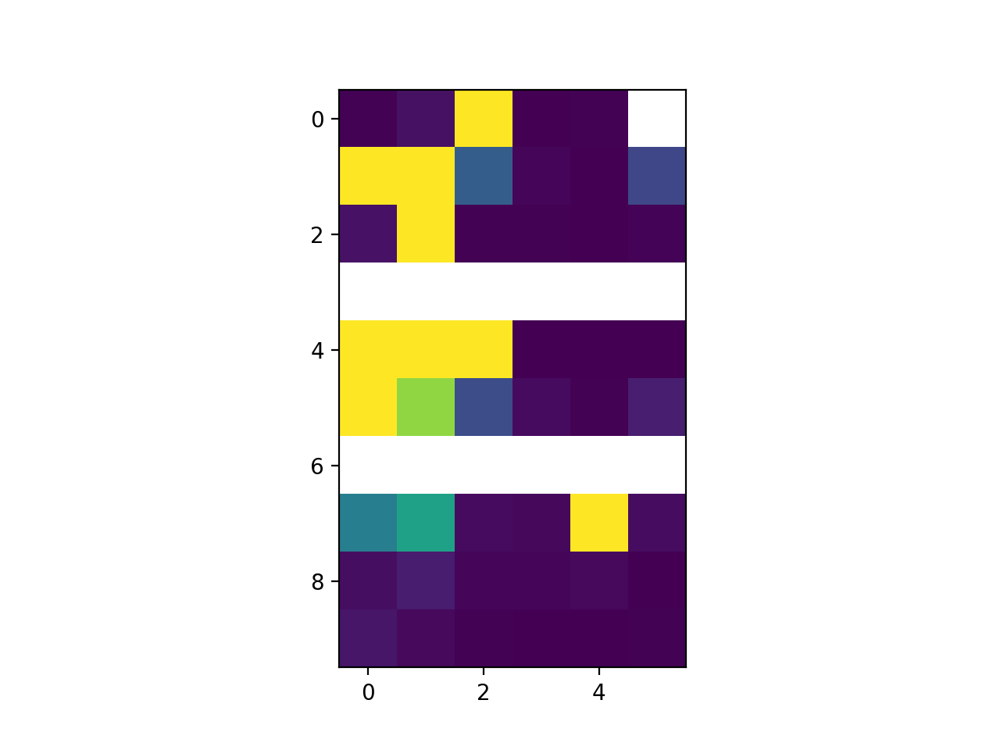

<IPython.core.display.Javascript object>


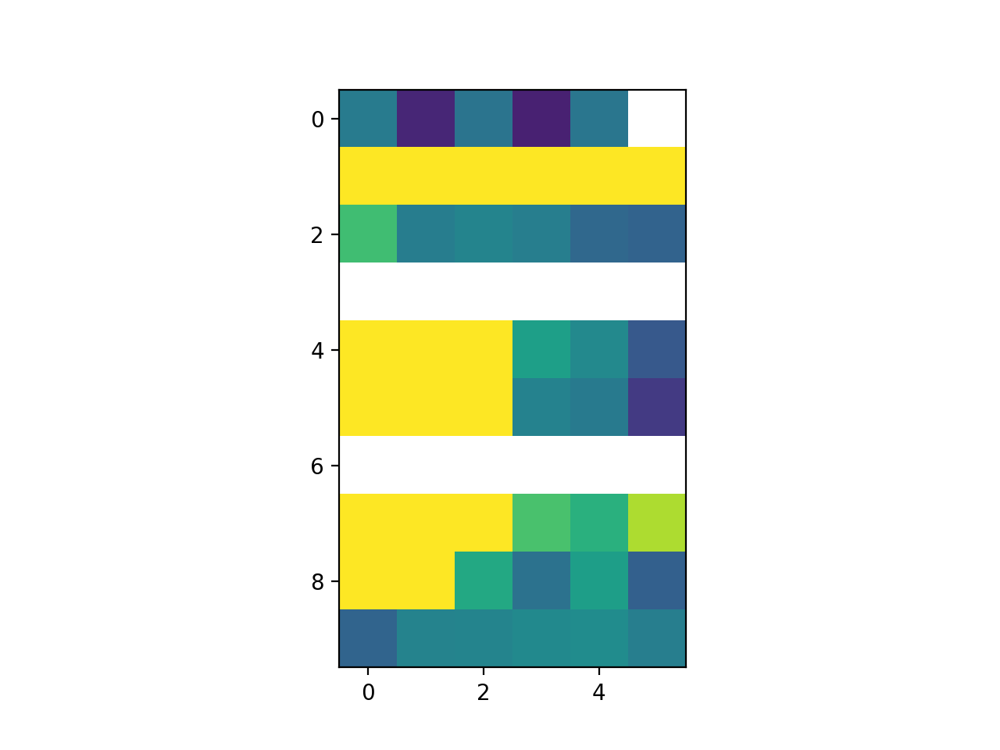

In [128]:
plt.figure()
plt.imshow(c50std_decoder,vmin=0,vmax=10)
plt.figure()
plt.imshow(c50s_decoder,vmin=0,vmax=10)

<IPython.core.display.Javascript object>


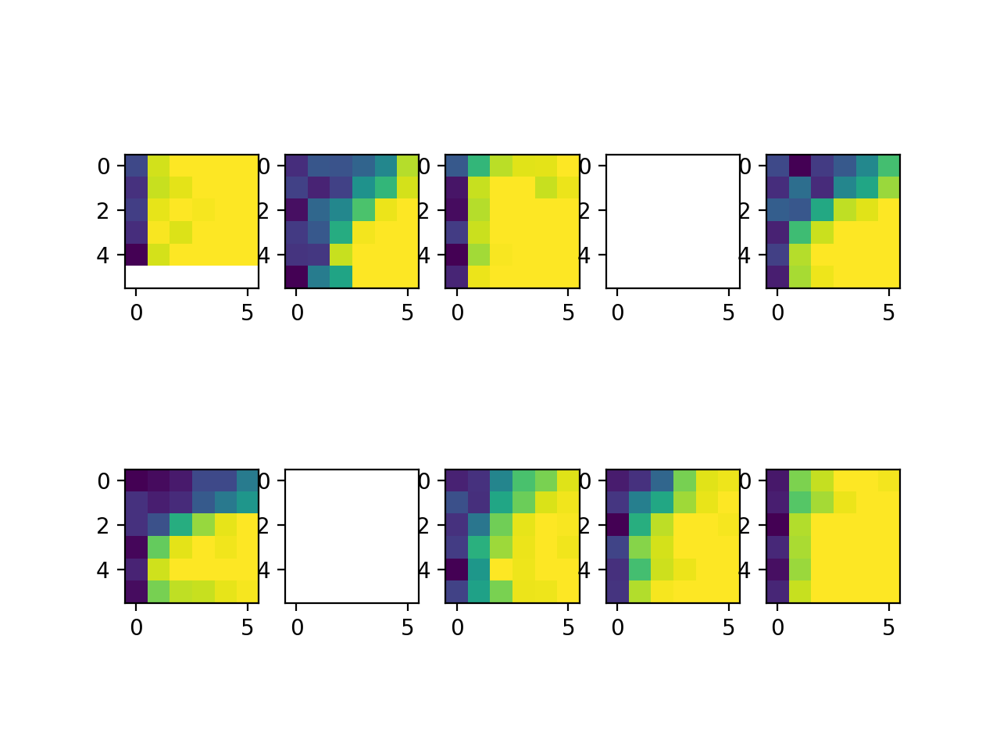

In [124]:
plt.figure()
for iexpt in range(hit_mean.shape[0]):
    plt.subplot(2,5,iexpt+1)
    plt.imshow(hit_mean[iexpt])

<IPython.core.display.Javascript object>


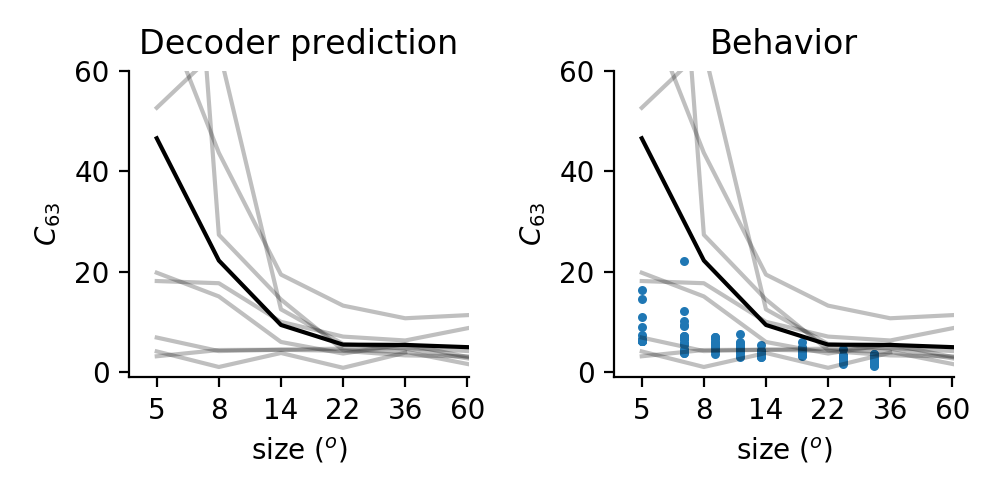

In [125]:
cmax = 60
plt.figure(figsize=(5,2.5))
plt.subplot(1,2,1)
plt.plot(np.log10(usize),c50s_decoder.T,c='k',alpha=0.25)
# for iexpt in range(c50s.shape[0]):
#     plt.errorbar(np.log10(usize),c50s[iexpt],yerr=c50std[iexpt],c='k',alpha=0.25)
plt.plot(np.log10(usize),np.nanmean(c50s_decoder,0),c='k')
# plt.yticks((-1,0,1),(0.1,1,10))
# plt.scatter(np.log10(usize).flatten(),np.log10(c50s.T).flatten(),c='k',alpha=0.25)
plt.xticks(np.log10(usize),np.round(usize).astype('int'))
plt.ylim((-1,cmax))
plt.xlim((np.log10(4),np.log10(61)))
ut.erase_top_right()
plt.xlabel('size ($^o$)')
plt.ylabel('$C_{63}$')
plt.title('Decoder prediction')
plt.subplot(1,2,2)
plt.scatter(np.log10(size_by_animal),c50s_animal,s=5)
plt.plot(np.log10(usize),c50s_decoder.T,c='k',alpha=0.25)
plt.plot(np.log10(usize),np.nanmean(c50s_decoder,0),c='k')#,linestyle='dashed')
ut.erase_top_right()
plt.ylim((-1,cmax))
plt.xticks(np.log10(usize),np.round(usize).astype('int'))
plt.xlim((np.log10(4),np.log10(61)))
plt.xlabel('size ($^o$)')
plt.ylabel('$C_{63}$')
plt.title('Behavior')
plt.tight_layout()
# plt.savefig('figures/weibull_lambda_decoder_and_behavior.jpg',dpi=300)

<IPython.core.display.Javascript object>


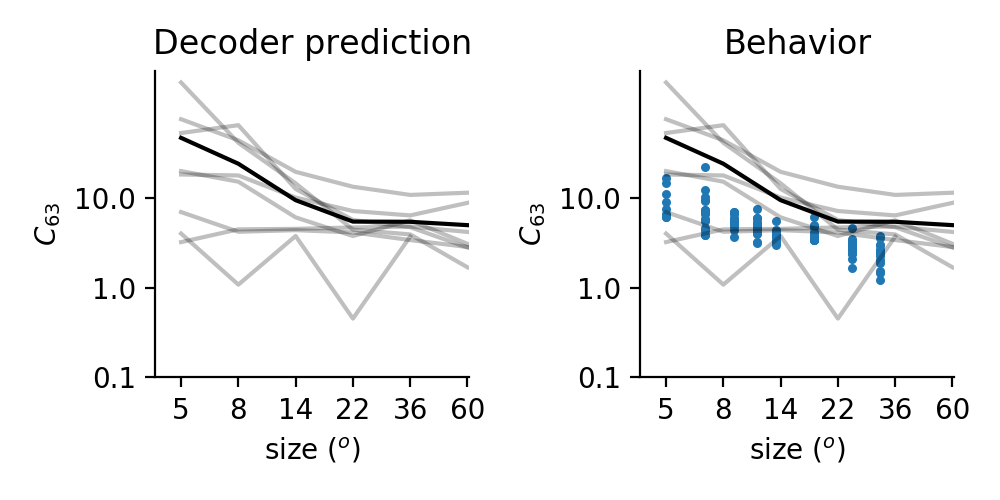

In [108]:
plt.figure(figsize=(5,2.5))
plt.subplot(1,2,1)
plt.plot(np.log10(usize),np.log10(c50s_decoder).T,c='k',alpha=0.25)
# for iexpt in range(c50s.shape[0]):
#     plt.errorbar(np.log10(usize),c50s[iexpt],yerr=c50std[iexpt],c='k',alpha=0.25)
plt.plot(np.log10(usize),np.log10(np.nanmean(c50s_decoder,0)),c='k')
# plt.yticks((-1,0,1),(0.1,1,10))
# plt.scatter(np.log10(usize).flatten(),np.log10(c50s.T).flatten(),c='k',alpha=0.25)
plt.xticks(np.log10(usize),np.round(usize).astype('int'))
yticks = np.arange(-1,2).astype('float')
ytick_lbls = [10**yt for yt in yticks]
plt.yticks(yticks,ytick_lbls)
# plt.ylim((-1,20))
plt.xlim((np.log10(4),np.log10(61)))
ut.erase_top_right()
plt.xlabel('size ($^o$)')
plt.ylabel('$C_{63}$')
plt.title('Decoder prediction')
plt.subplot(1,2,2)
plt.scatter(np.log10(size_by_animal),np.log10(c50s_animal),s=5)
plt.plot(np.log10(usize),np.log10(np.nanmean(c50s_decoder,0)),c='k')
plt.plot(np.log10(usize),np.log10(c50s_decoder).T,c='k',alpha=0.25)
# plt.plot(np.log10(usize),np.nanmean(c50s,0),c='k')#,linestyle='dashed')
ut.erase_top_right()
# plt.ylim((-1,20))
plt.xticks(np.log10(usize),np.round(usize).astype('int'))
yticks = np.arange(-1,2).astype('float')
ytick_lbls = [10**yt for yt in yticks]
plt.yticks(yticks,ytick_lbls)
plt.xlim((np.log10(4),np.log10(61)))
plt.xlabel('size ($^o$)')
plt.ylabel('$C_{63}$')
plt.title('Behavior')
plt.tight_layout()
# plt.savefig('figures/weibull_lambda_decoder_and_behavior.jpg',dpi=300)

In [429]:
res = sst.linregress(np.log10(size_by_animal**2),np.log10(c50s_animal))

In [434]:
(res.stderr/res.slope)*1/res.slope

0.20623620743473137

<IPython.core.display.Javascript object>


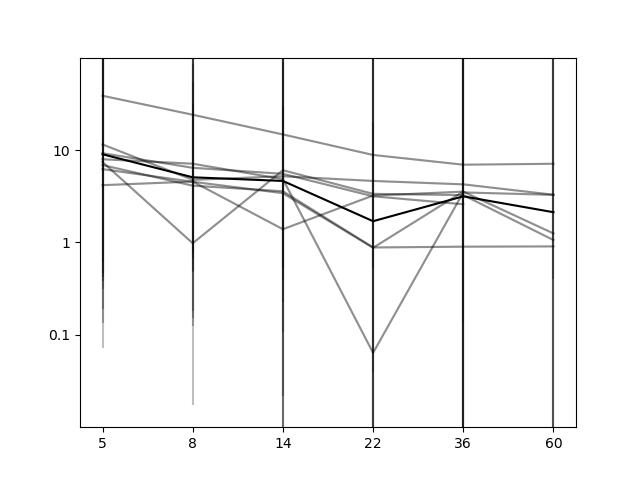

(-2, 2)

In [244]:
plt.figure()
plt.plot(np.log10(usize),np.log10(c50s.T),c='k',alpha=0.25)
for iexpt in range(c50s.shape[0]):
    plt.errorbar(np.log10(usize),np.log10(c50s[iexpt]),yerr=np.log10(c50std[iexpt]),c='k',alpha=0.25)
plt.plot(np.log10(usize),np.nanmean(np.log10(c50s),0),c='k')
plt.yticks((-1,0,1),(0.1,1,10))
# plt.scatter(np.log10(usize).flatten(),np.log10(c50s.T).flatten(),c='k',alpha=0.25)
plt.xticks(np.log10(usize),np.round(usize).astype('int'))
plt.ylim((-2,2))

In [184]:
pdb.pm()

> <__array_function__ internals>(6)concatenate()
(Pdb) u
> /Users/dan/Documents/code/adesnal/naka_rushton_analysis.py(28)fit_opt_params()
-> params_0 = np.concatenate((a_0,(b_0,),c50_0,(n_0,)))
(Pdb) a_0
array([ 1.,  1.,  1.,  1.,  1., nan])
(Pdb) b_0
0
(Pdb) c50_0
3.0
(Pdb) n_0
2
(Pdb) c50_0.shape
()
(Pdb) exit


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


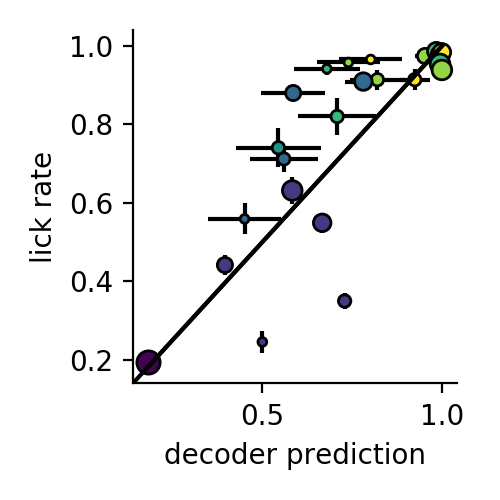

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)


In [35]:
reload(sca)
plt.figure(figsize=(2.5,2.5))
sca.scatter_size_contrast_errorbar(hit_mean,np.concatenate((lick_rate_interp_lb[np.newaxis],lick_rate_interp_ub[np.newaxis])),equate_0=True,nsize=6,ncontrast=7)
plt.plot((0,1),(0,1),c='k')
ut.erase_top_right()
plt.xlabel('decoder prediction')
plt.ylabel('lick rate')
plt.tight_layout()
# plt.savefig('figures/lick_rate_vs_decoder_size_contrast.eps')

<IPython.core.display.Javascript object>


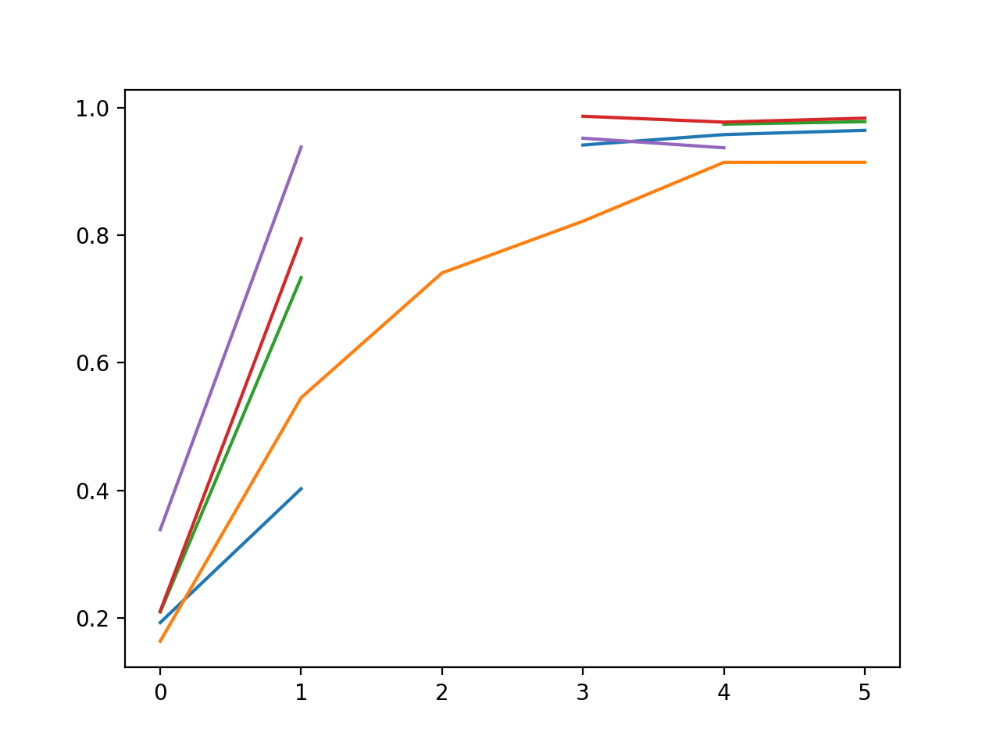

In [114]:
plt.figure()
plt.plot(lick_rate_interp.T)

<IPython.core.display.Javascript object>


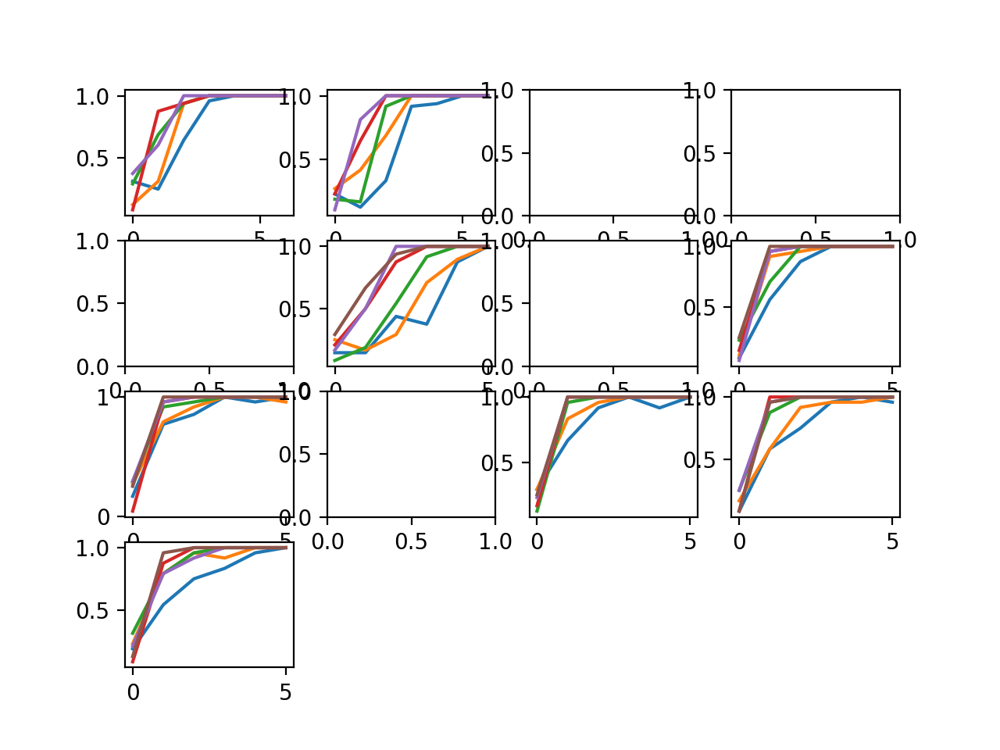

In [113]:
plt.figure()
for iexpt in range(len(hit)):
    plt.subplot(4,4,iexpt+1)
    if not hit[iexpt] is None:
        plt.plot(np.nanmean(hit[iexpt],2).T)

In [29]:
with h5py.File(dsfile,mode='r') as f:
    ucontrast = f[keylist[-1]]['size_contrast_0']['stimulus_contrast'][:]
    usize = f[keylist[-1]]['size_contrast_0']['stimulus_size_deg'][:]
ncontrast = len(ucontrast)
nsize = len(usize)

array([ 5.        ,  8.21865442, 13.50925609, 22.20558144, 36.5       ,
       60.        ])

In [31]:
usize,ucontrast = proc[-1]['usize'],proc[-1]['ucontrast']
modal_uparam = [usize,ucontrast]
nsize,ncontrast = len(usize),len(ucontrast)

In [32]:
def show_auroc(auroc,label='Population decoder detection AUROC'):
    sca.show_size_contrast(auroc[:,1:],flipud=True,usize=usize,ucontrast=100*ucontrast[1:])
    plt.colorbar().set_label(label)
    plt.clim([0.5,1])

<IPython.core.display.Javascript object>


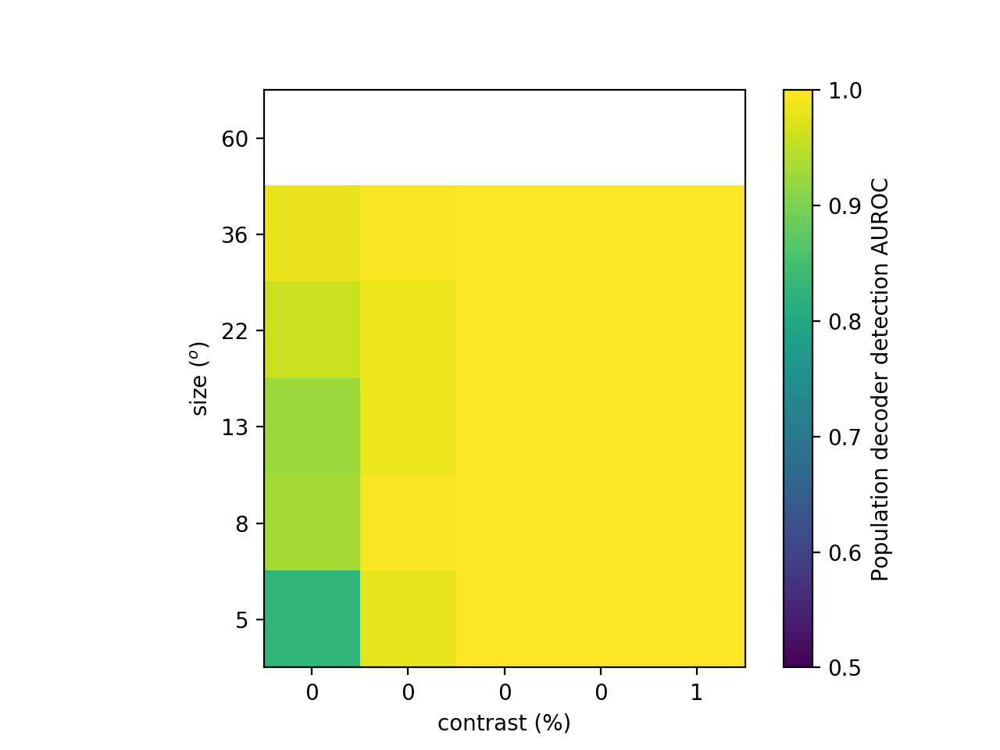

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: Mean of empty slice
  if __name__ == '__main__':


<IPython.core.display.Javascript object>


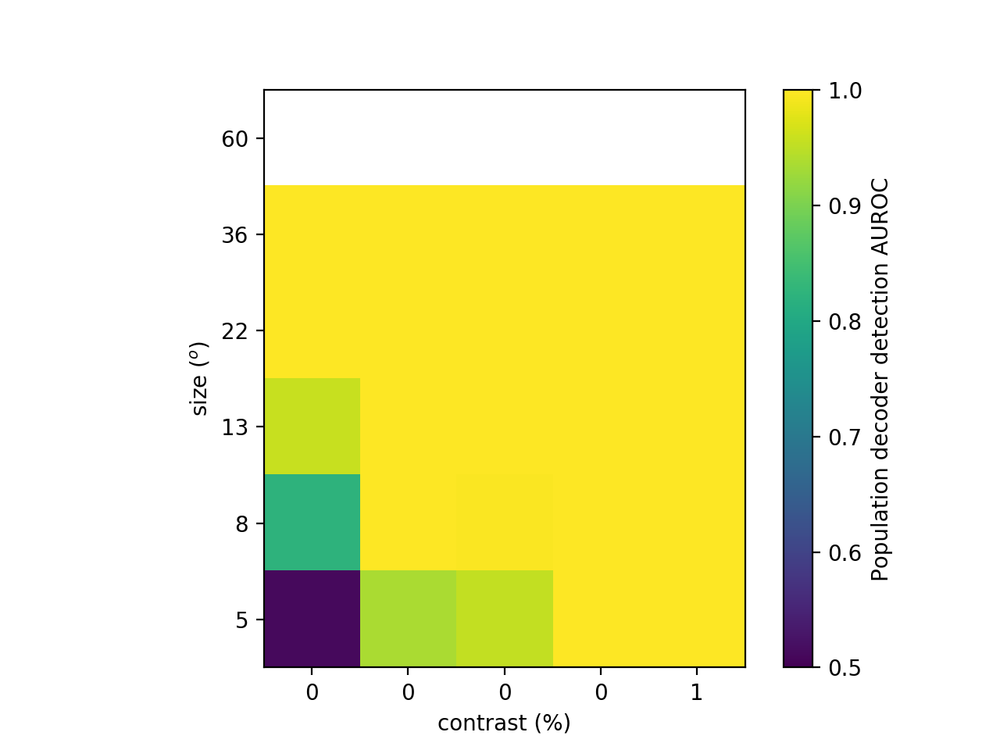

<IPython.core.display.Javascript object>


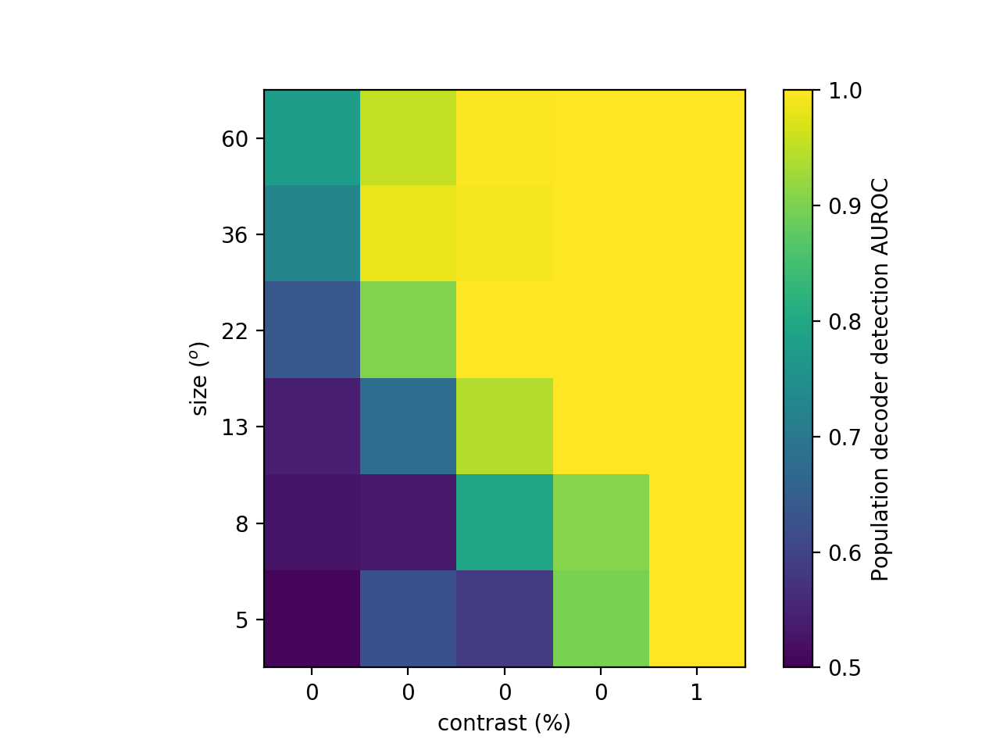

<IPython.core.display.Javascript object>


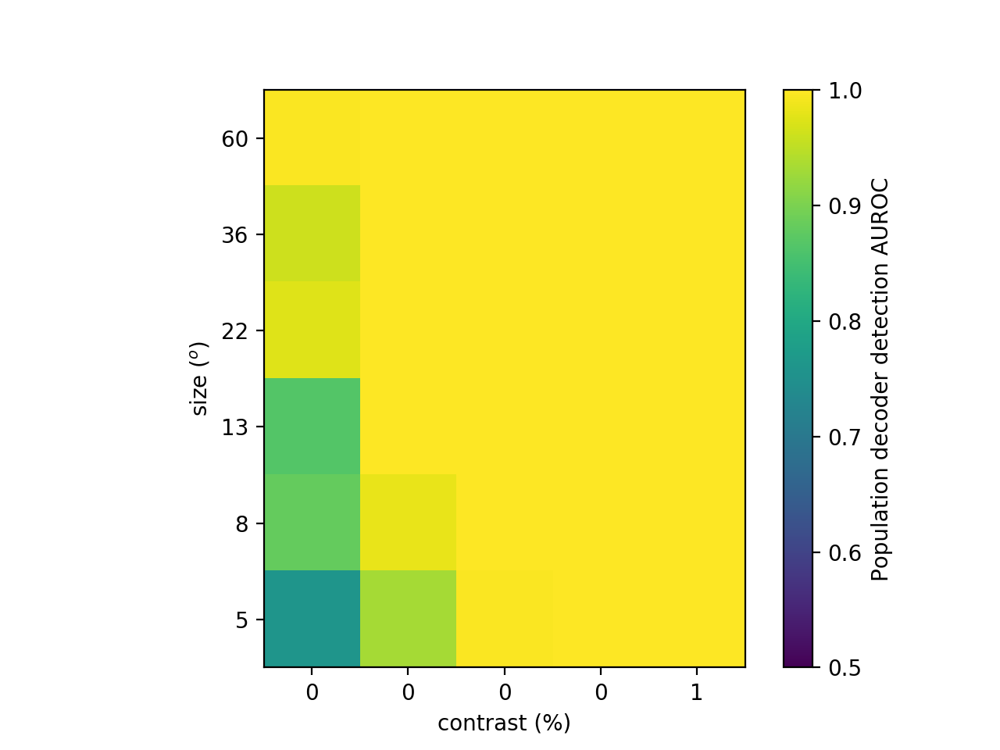

<IPython.core.display.Javascript object>


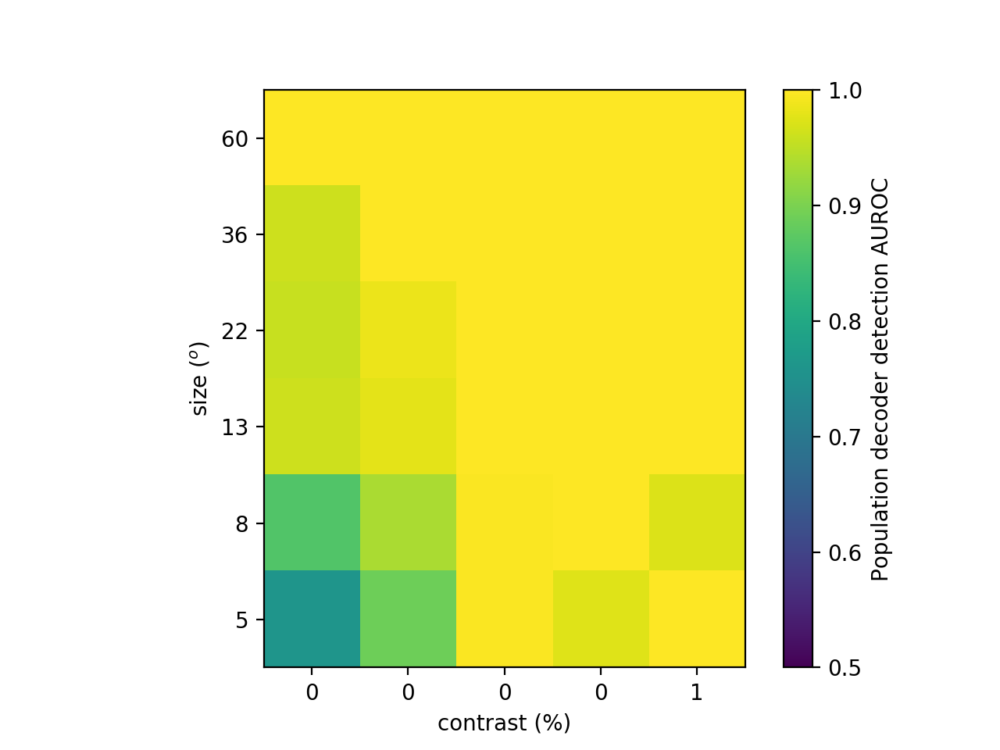

<IPython.core.display.Javascript object>


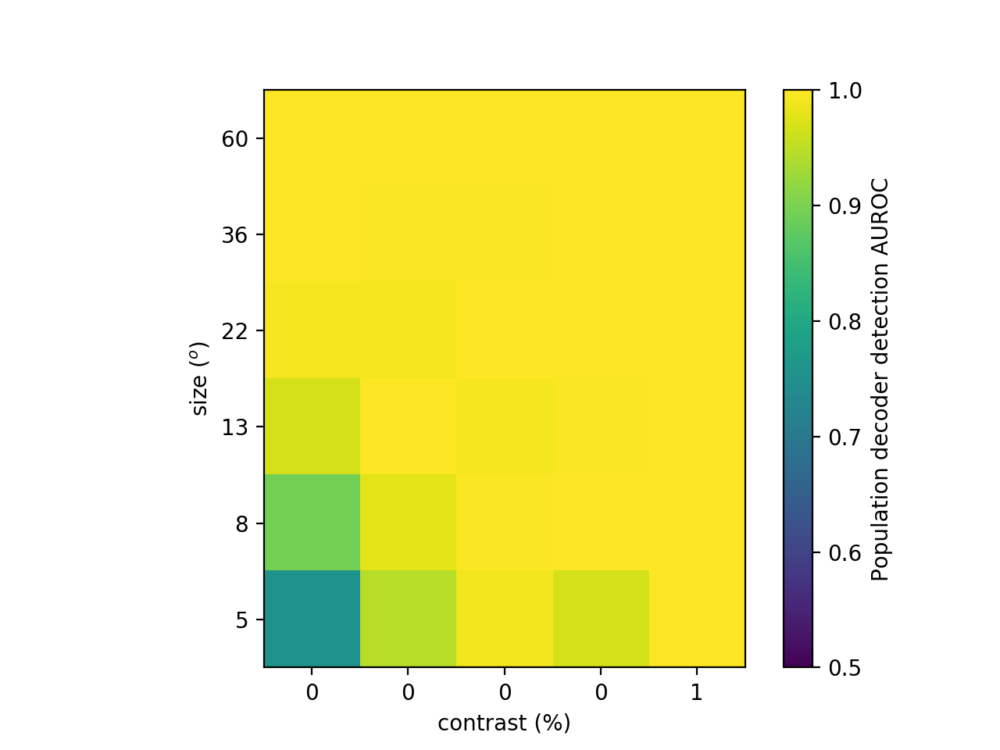

<IPython.core.display.Javascript object>


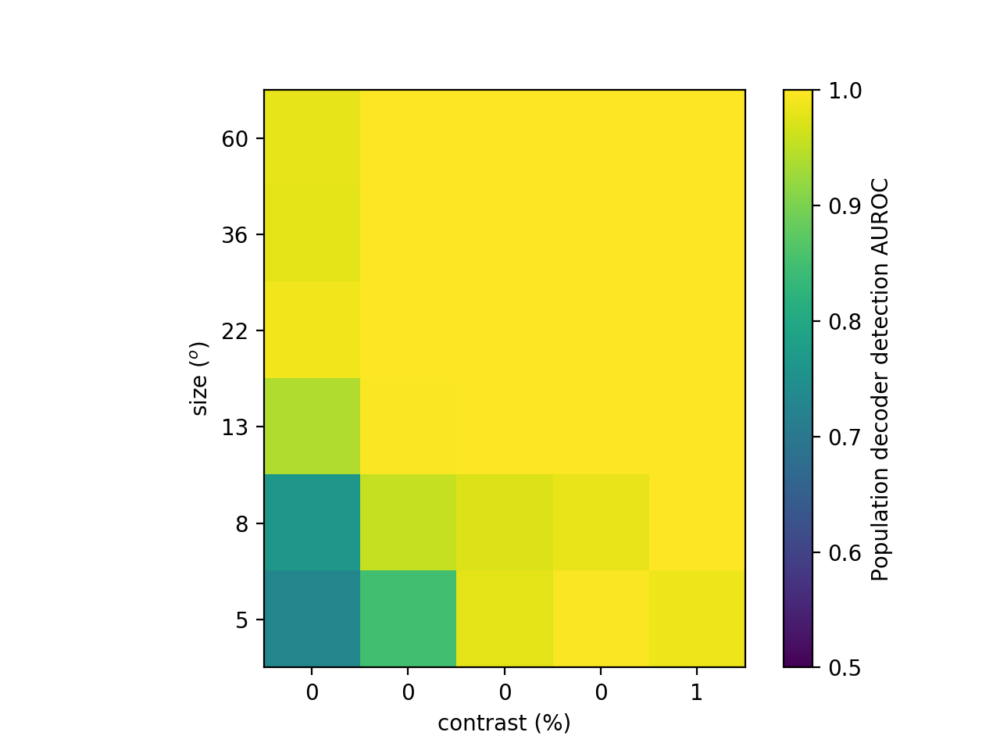

<IPython.core.display.Javascript object>


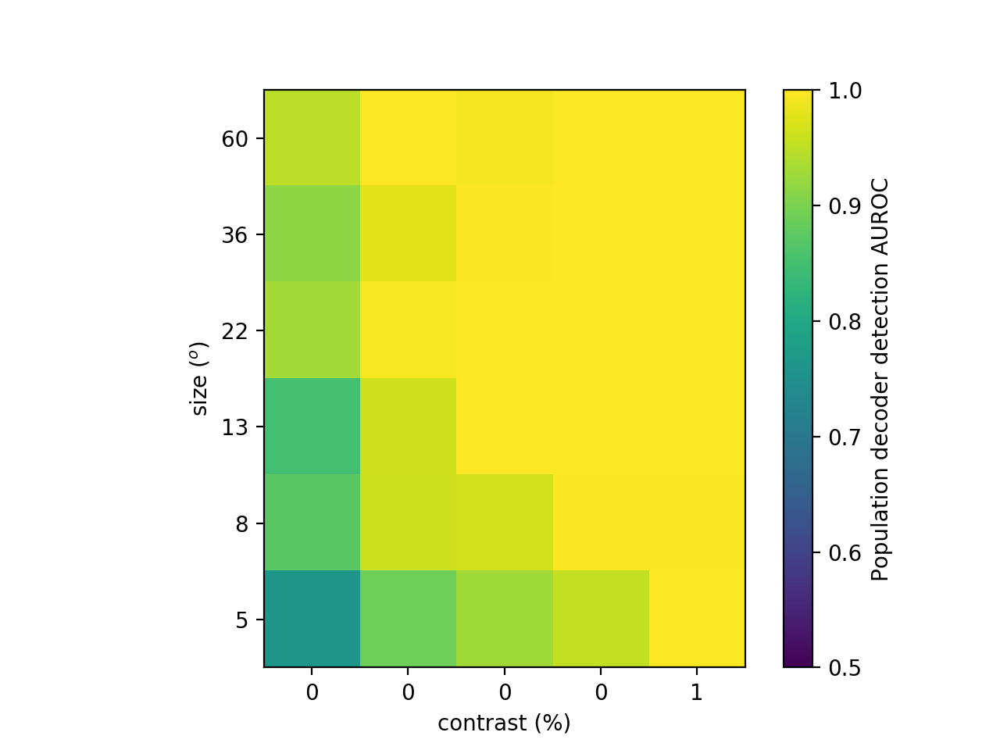

In [36]:
reload(ut)
reload(sca)
nexpt = len(proc)
# auroc_mean = [None for iexpt in range(nexpt)]
auroc_mean = np.nan*np.ones((nexpt,nsize,ncontrast))
for iexpt in range(len(proc)):
    if not auroc[0][iexpt] is None:
        plt.figure()
        this_data = np.nanmean(np.nanmean(np.concatenate([a[iexpt][np.newaxis] for a in auroc],axis=0),axis=0),-1)
        this_uparam = [proc[iexpt]['usize'],proc[iexpt]['ucontrast']]
        ut.assign_from_uparam(auroc_mean[iexpt],modal_uparam,this_data,this_uparam,ignore_first=0)
        sca.show_auroc(auroc_mean[iexpt],usize=usize,ucontrast=ucontrast)
#         sca.show_size_contrast(auroc_mean[iexpt][:,1:],flipud=True,usize=proc[iexpt]['usize'],ucontrast=100*proc[iexpt]['ucontrast'][1:])
#         plt.colorbar().set_label('Population decoder AUROC')
#         plt.clim([0.5,1])
        

<IPython.core.display.Javascript object>


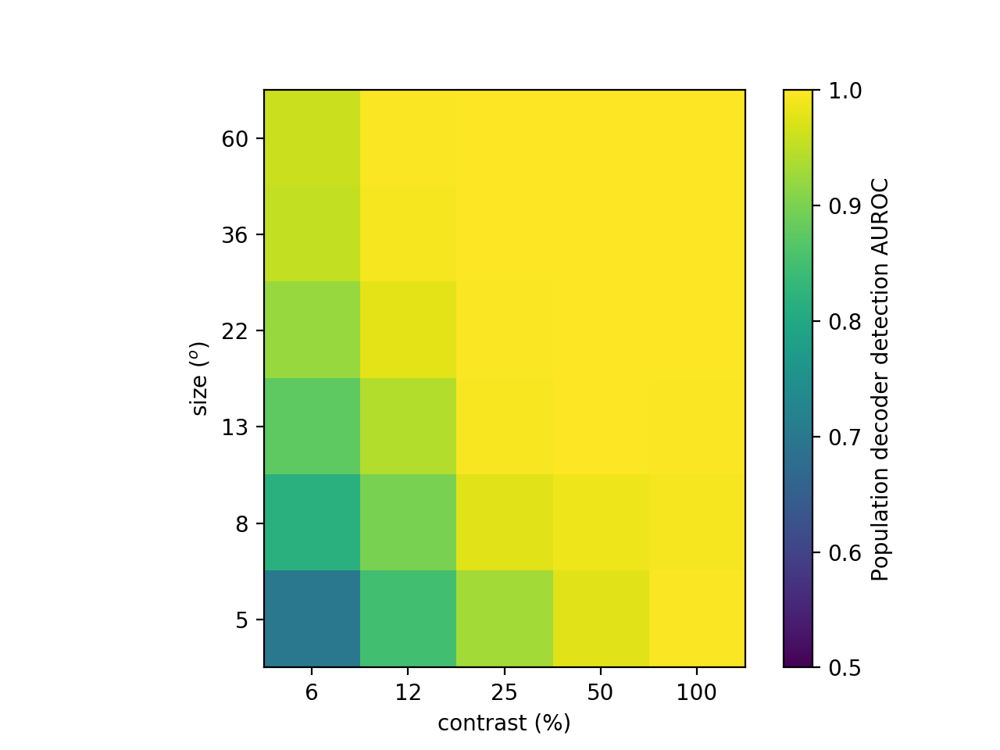

In [59]:
plt.figure()
ut.mkdir('figures')
show_auroc(np.nanmean(auroc_mean,0))
np.save('../shared_data/pyr_l23_population_detection_by_size_and_contrast_auroc.npy',auroc_mean)
plt.savefig('figures/pyr_l23_population_detection_by_size_and_contrast.jpg',dpi=300)

<IPython.core.display.Javascript object>


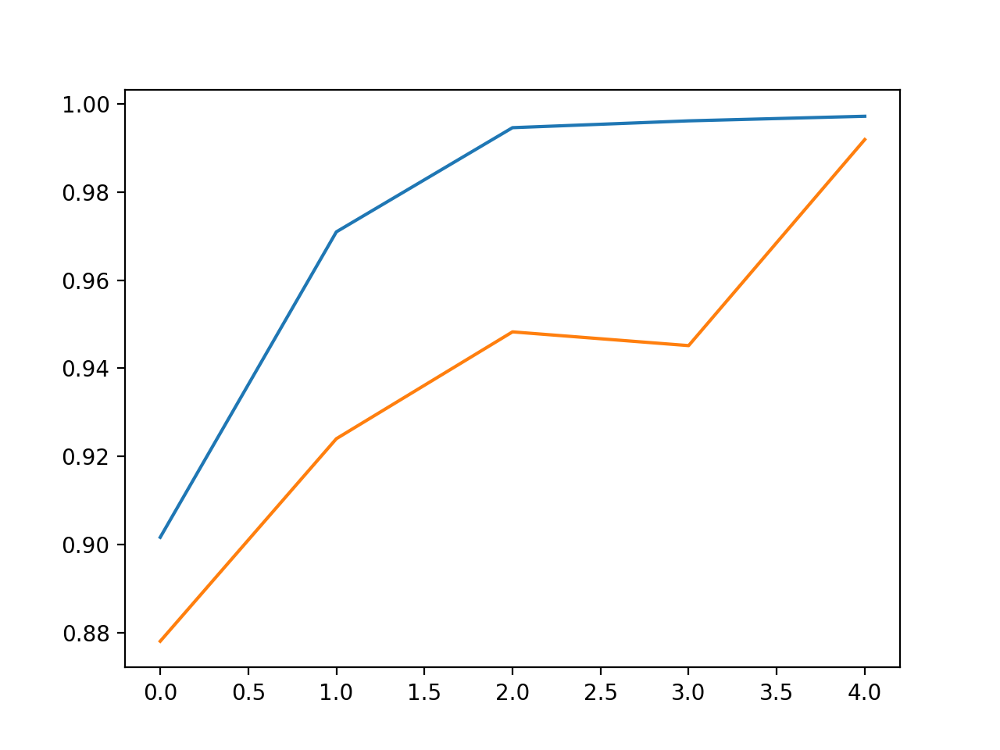

<IPython.core.display.Javascript object>


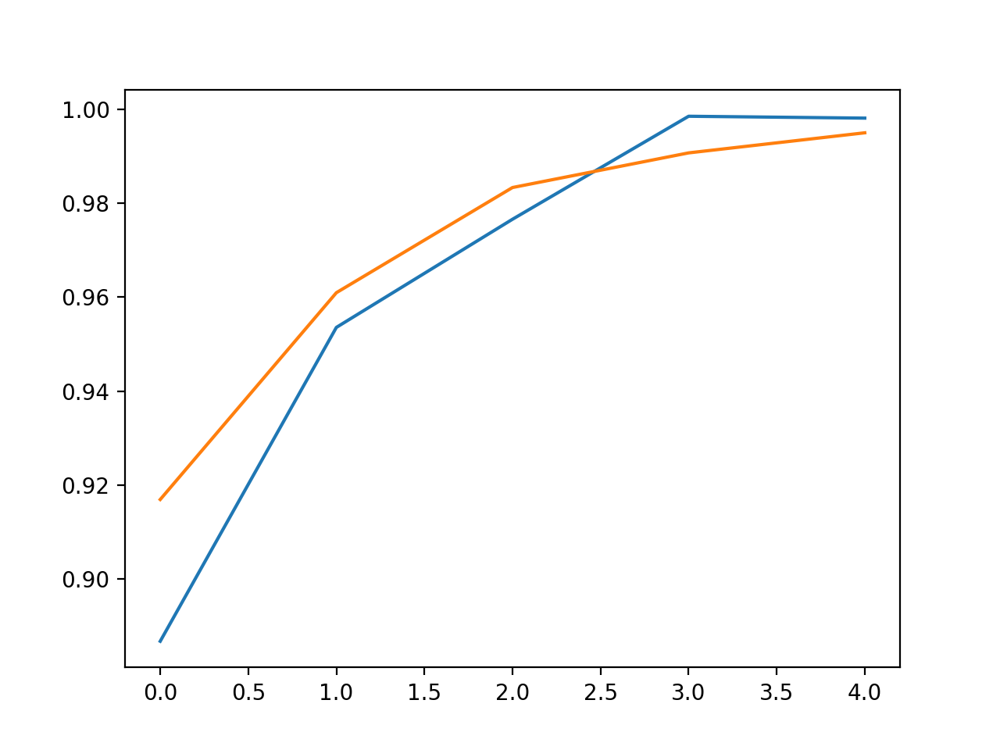

<IPython.core.display.Javascript object>


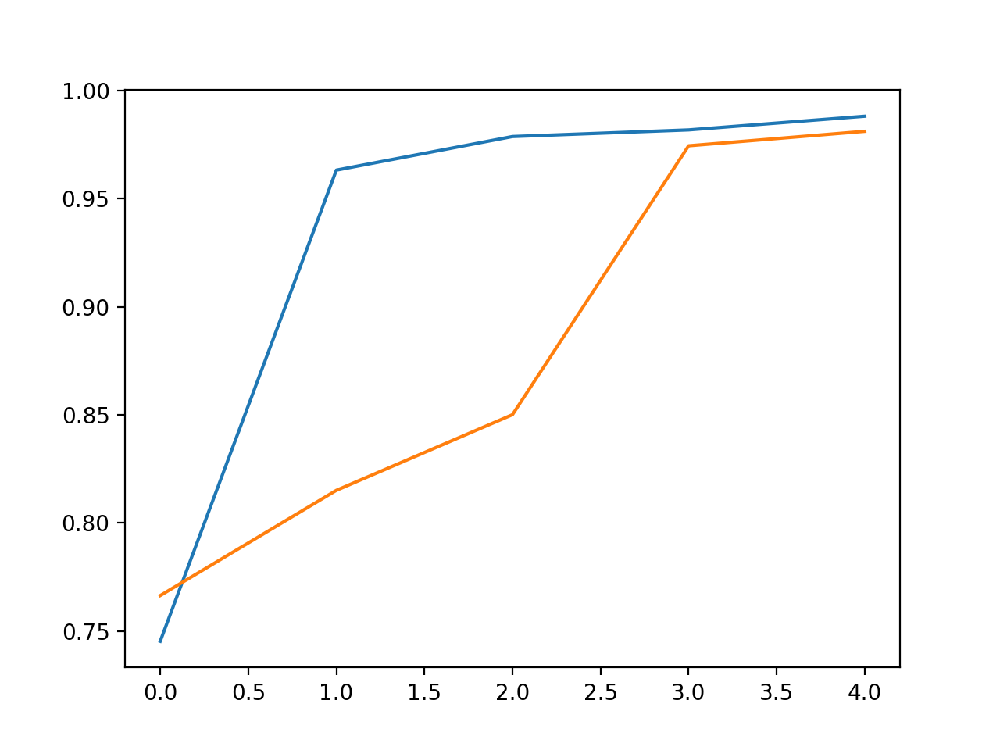

<IPython.core.display.Javascript object>


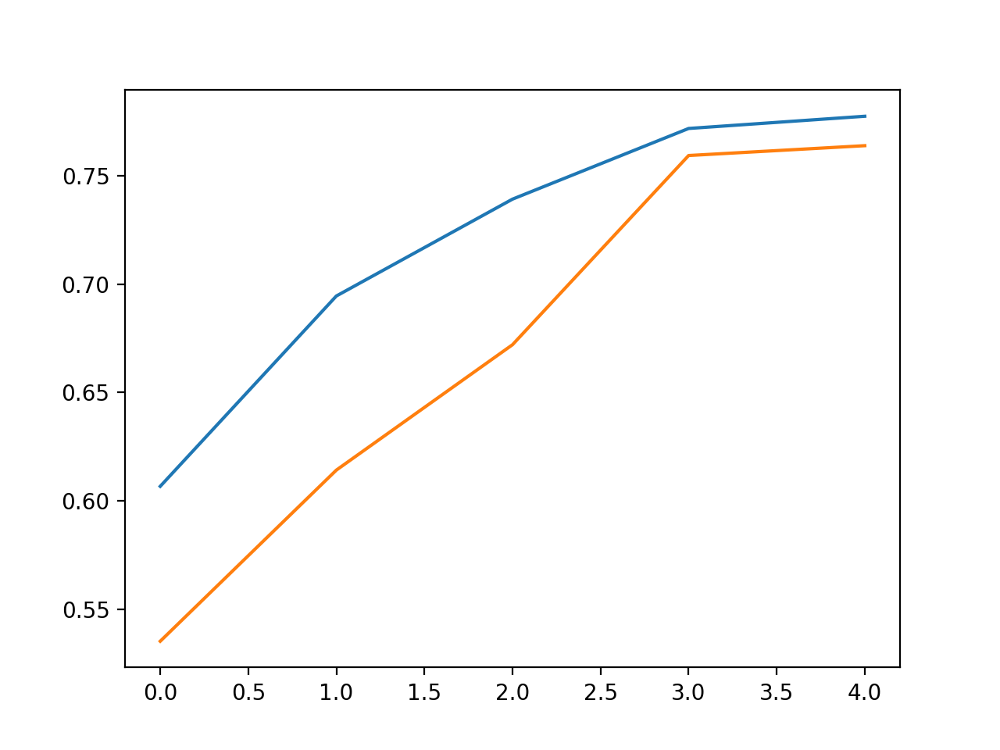

<IPython.core.display.Javascript object>


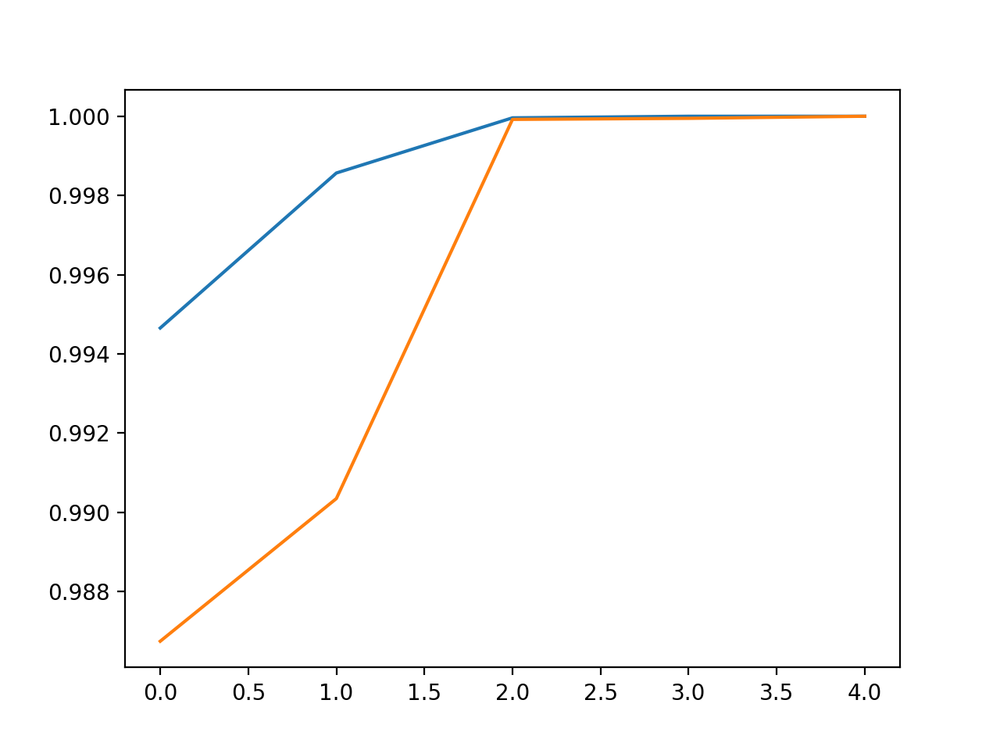

In [156]:
isize = 2
for iexpt in range(len(auroc)):
    if not auroc_mean[iexpt] is None:
        plt.figure()
#         plt.plot(np.nanmean(np.nanmean(np.nanmean(auroc[iexpt][:,:,1:],-1),-1),-1))
        plt.plot(np.nanmean(auroc_mean[iexpt][:,isize,1:],-1).T)

/home/mossing/anaconda3/envs/py3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: Mean of empty slice
  


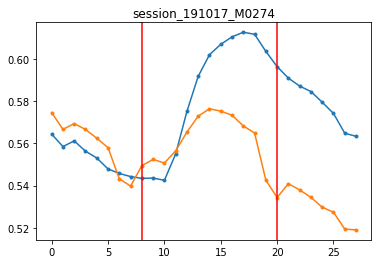

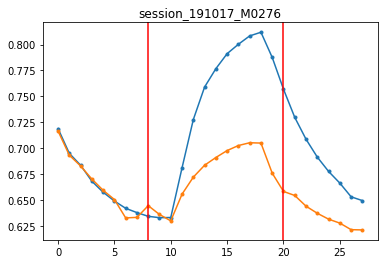

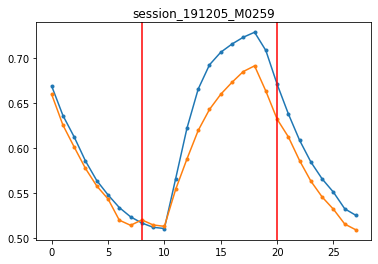

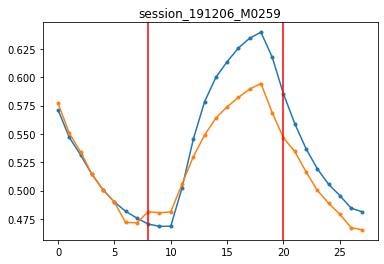

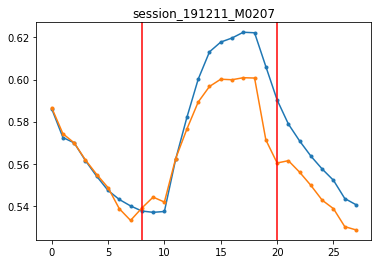

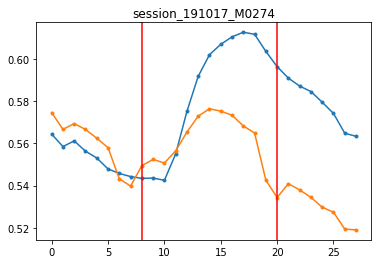

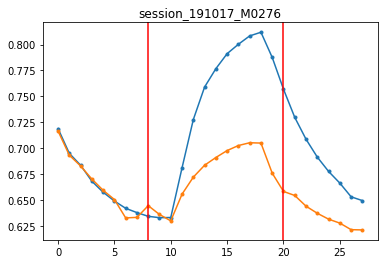

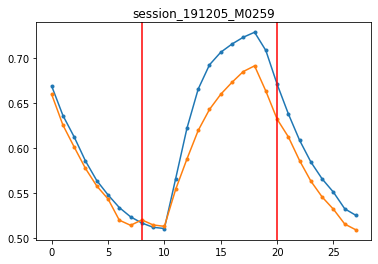

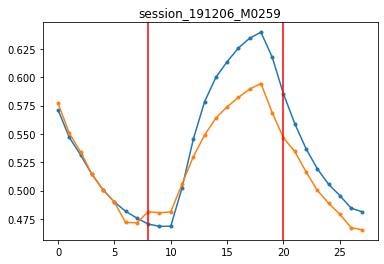

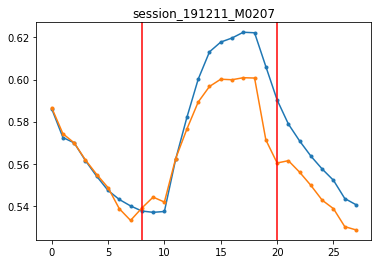

In [235]:
for r in range(2):
    for iexpt in range(len(tuning_ca[r])):
        if not tuning_ca[r][iexpt] is None:
            plt.figure()
            for ilight in range(2):
                plt.plot(np.nanmean(np.nanmean(np.nanmean(np.nanmean(tuning_ca[r][iexpt][:,:,:,:,ilight],0),0),0),0),'.-')
            plt.axvline(nbefore,c='r')
            plt.axvline(tuning_ca[r][iexpt].shape[-1]-nafter,c='r')
            plt.title(keylist[iexpt])

/home/mossing/anaconda3/envs/py3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: Mean of empty slice
  


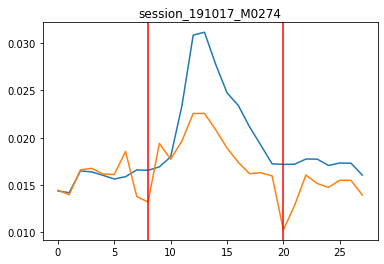

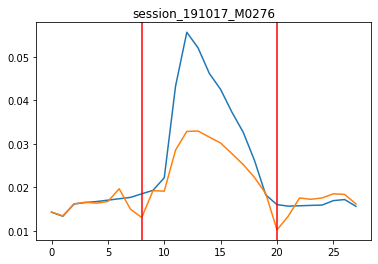

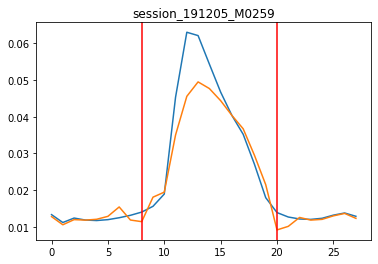

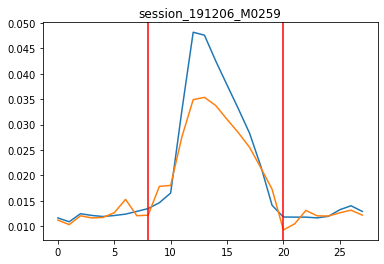

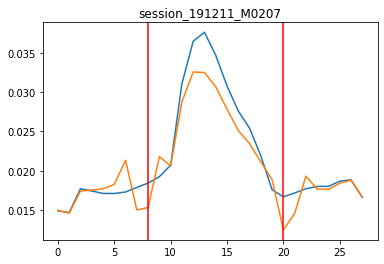

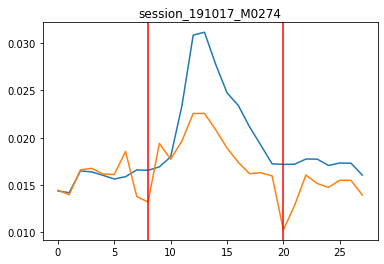

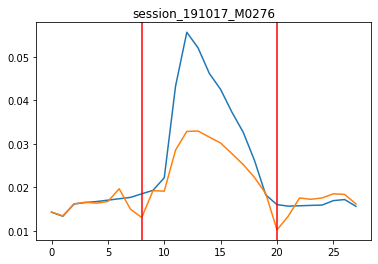

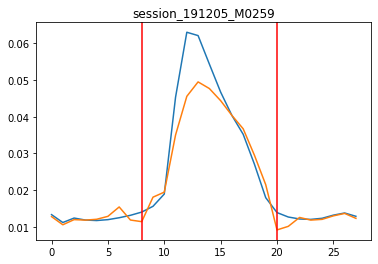

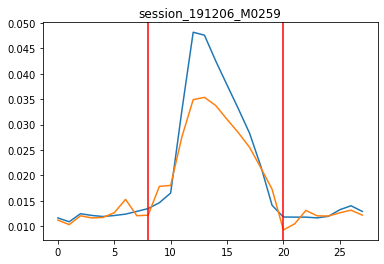

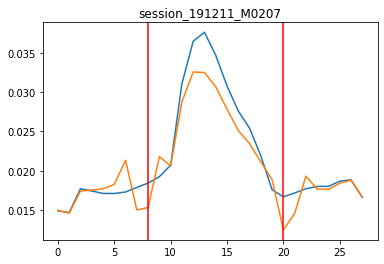

In [236]:
for r in range(2):
    for iexpt in range(len(tuning[r])):
        if not tuning[r][iexpt] is None:
            plt.figure()
            for ilight in range(2):
                plt.plot(np.nanmean(np.nanmean(np.nanmean(np.nanmean(tuning[r][iexpt][:,:,:,:,ilight],0),0),0),0))
            plt.axvline(nbefore,c='r')
            plt.axvline(tuning[r][iexpt].shape[-1]-nafter,c='r')
            plt.title(keylist[iexpt])

In [196]:
def show_all_rois(red_green,ctr,lbl): #msk,
    img = red_green
    c = ctr.astype('int')
    plt.imshow(img)#[c[0]-25:c[0]+25,c[1]-25:c[1]+25])
    for i in range(ctr.shape[0]):
        plt.text(ctr[i,1],ctr[i,0],lbl[i],c='w')
    plt.axis('off')

In [197]:
def show_all_rois_with_msk(red_green,ctr,lbl,msk): #msk,
    msk_all = msk.sum(0)>0
    img = sks.mark_boundaries(red_green,msk_all.astype('int'),color=(1,1,1)) #red_green
    c = ctr.astype('int')
    plt.imshow(img)#[c[0]-25:c[0]+25,c[1]-25:c[1]+25])
    for i in range(ctr.shape[0]):
        plt.text(ctr[i,1],ctr[i,0],lbl[i],c='w')
    plt.axis('off')

In [198]:
def process_mean_image(dsfile,ikey):
    with h5py.File(dsfile,mode='r') as f:
        keylist = list(f.keys())
        depth = f[keylist[ikey]]['cell_depth'][:].astype('int')
        msk = f[keylist[ikey]]['cell_mask'][:]
        ctr = f[keylist[ikey]]['cell_center'][:]
        cell_id = f[keylist[ikey]]['cell_id'][:]
        red_green = np.zeros(f[keylist[ikey]]['mean_red_channel'][:].shape + (3,),dtype=np.float64)
        nplanes = red_green.shape[0]
        for iplane in range(nplanes):
            red = f[keylist[ikey]]['mean_red_channel'][iplane]
            green = f[keylist[ikey]]['mean_green_channel'][iplane]
            red_green[iplane] = combine_rg(red,green)
    return red_green,msk,ctr,depth,cell_id

In [12]:
with h5py.File(dsfile,mode='r') as f:
    ucontrast = f[keylist[0]]['size_contrast_opto_0']['stimulus_contrast'][:]
    usize = f[keylist[0]]['size_contrast_opto_0']['stimulus_size_deg'][:]
ncontrast = len(ucontrast)
nsize = len(usize)

KeyError: "Unable to open object (object 'size_contrast_opto_0' doesn't exist)"

In [200]:
def show_outline(ind,norm_to_max=False):
    with h5py.File(dsfile,mode='r') as f:
        red = f[keylist[ikey]]['mean_red_channel'][depth[ind]]
        green = f[keylist[ikey]]['mean_green_channel'][depth[ind]]
        red_green = combine_rg(red,green,green_mult=0.1)
    #plt.figure()
    
#     toshow = red_green[mins[0]:maxs[0],mins[1]:maxs[1]]
    if norm_to_max:
        red_green = red_green/red_green[:,:,0][msk[ind]].max()
    
    img = sks.mark_boundaries(red_green,skm.binary_dilation(msk[ind]).astype('int'),color=(1,1,1))
    c = ctr[ind].astype('int')
    mins = [np.maximum(c[iaxis]-25,0) for iaxis in range(2)]
    maxs = [np.minimum(c[iaxis]+25,red_green.shape[iaxis]) for iaxis in range(2)]
    toshow = img[mins[0]:maxs[0],mins[1]:maxs[1]]
    plt.imshow(toshow)

In [201]:
ut.mkdir('figures/example_red_cells')

In [56]:
keylist[ikey]

'session_191017_M0274'

['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_red_channel', 'mouse_id', 'retinotopy_0', 'size_contrast_opto_0']


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


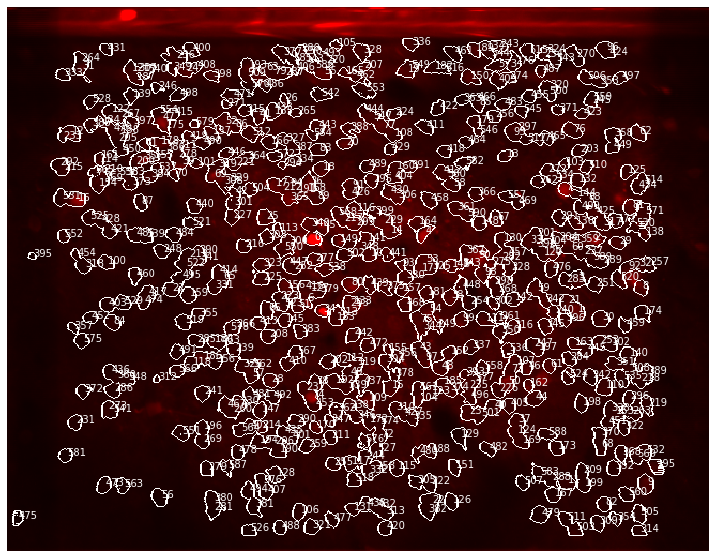

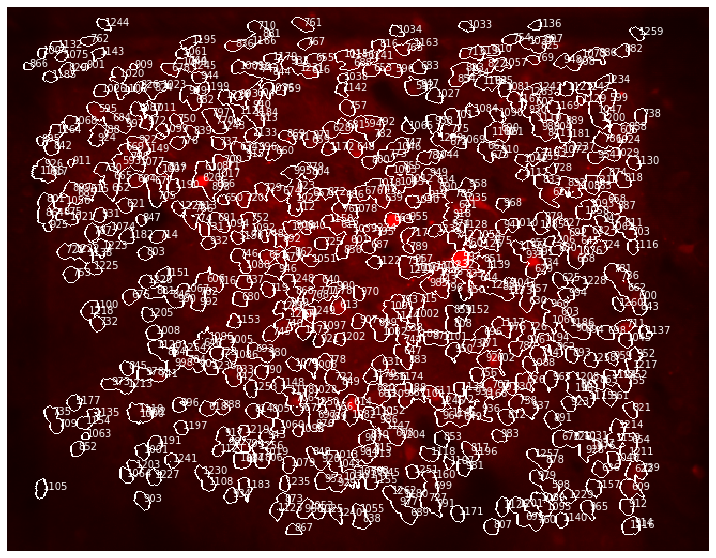

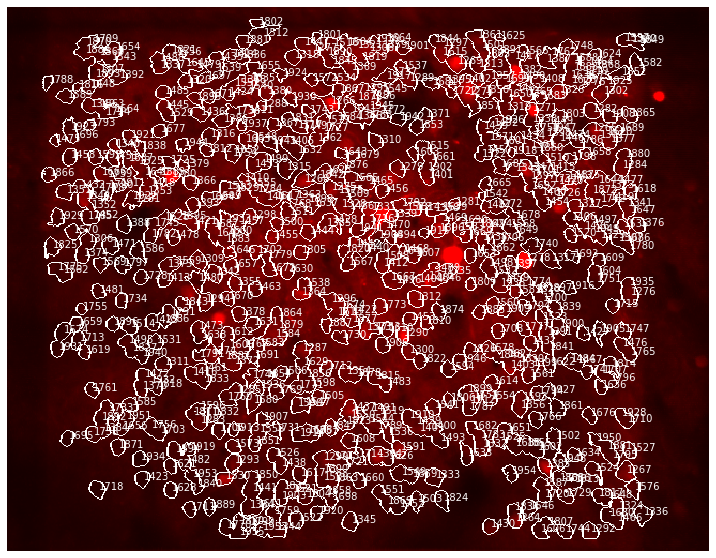

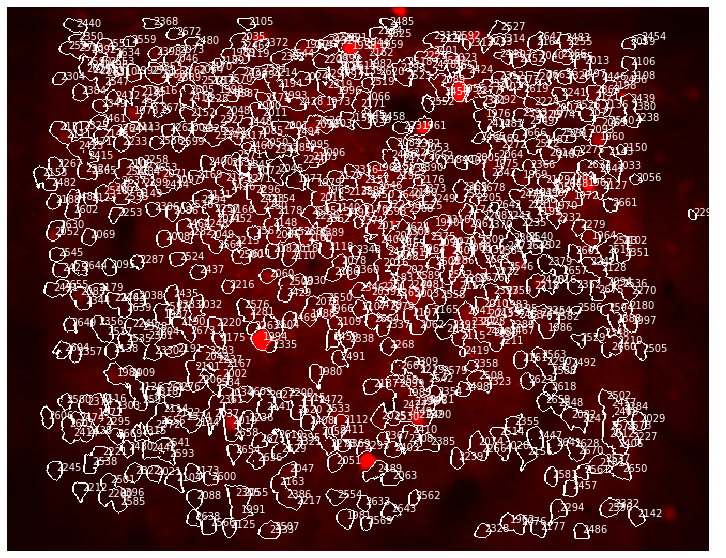

In [207]:
ikey = 1
roilist = [175,225]
with h5py.File(dsfile,mode='r') as f:
    keylist = [key for key in f.keys()]
    print([key for key in f[keylist[ikey]].keys()])
    depth = f[keylist[ikey]]['cell_depth'][:]
    msk = f[keylist[ikey]]['cell_mask'][:]
    ctr = f[keylist[ikey]]['cell_center'][:]
    cell_id = f[keylist[ikey]]['cell_id'][:]
    nbefore = 8#f[keylist[ikey]]['nbefore']
    nafter = 8#f[keylist[ikey]]['nafter']
#     plt.figure()
#     plt.imshow(red_green)
    for iplane in range(0,4):
        red = f[keylist[ikey]]['mean_red_channel'][iplane]
        green = f[keylist[ikey]]['mean_green_channel'][iplane]
        red_green = combine_rg(red,green,green_mult=0,red_mult=2.5)
#         plt.figure(figsize=(15,10))
#         plt.imshow(red_green)
        plt.figure(figsize=(15,10))
        show_all_rois_with_msk(red_green,ctr[depth==iplane],cell_id[depth==iplane],msk[depth==iplane]) # [roilist]


# # for ind in [6,11,665,980]:
# # for ind in [636,639,626,798,886,705,625,656,655,387,359,391,430,375,376,280,224,150,175,148,8,70,50,99,25,13,143,144,225,147,266]:
# # for ind in [175,225]:
# for iind,ind in enumerate([13,15,636,639,359,391,430,224,150,280,626,886,655,175,50,225]):
#     with h5py.File(dsfile,mode='r') as f:
#         red = f[keylist[ikey]]['mean_red_channel'][depth[ind]]
#         green = f[keylist[ikey]]['mean_green_channel'][depth[ind]]*0
#         red_green = combine_rg(red,green) #*np.array((1/red.max(),0,0))[np.newaxis,np.newaxis]
#     plt.figure()
#     c = ctr[ind].astype('int')    
#     im_to_show = red_green[c[0]-25:c[0]+25,c[1]-25:c[1]+25]
#     im_to_show = im_to_show*np.array((1/np.nanmax(im_to_show),0,0))[np.newaxis,np.newaxis] #/im_to_show.max()
#     img = sks.mark_boundaries(im_to_show,skm.binary_dilation(msk[ind][c[0]-25:c[0]+25,c[1]-25:c[1]+25]).astype('int'),color=(1,1,1))
#     plt.subplot(1,3,1)
#     plt.title(ind)
#     plt.imshow(img)
#     plt.subplot(1,3,2)
#     plt.imshow(sc[ind,:,:,0],vmin=sc[ind].min(),vmax=sc[ind].max())
#     plt.subplot(1,3,3)
#     plt.imshow(sc[ind,:,:,1],vmin=sc[ind].min(),vmax=sc[ind].max())
# #     plt.savefig('figures/example_red_cells/example_roi_light_on_off_%02d.jpg' %iind,dpi=300)
# #     plt.axis('off')

In [20]:
def compute_mi(m1,m2):
    return (m2-m1)/(m1+m2)

In [21]:
keylist[ikey]

'session_191211_M0207'

/home/mossing/anaconda3/envs/py3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: Mean of empty slice
  This is separate from the ipykernel package so we can avoid doing imports until


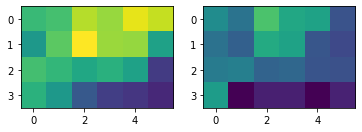

In [203]:
for ikey in (1,): #range(4):
    for c in (0,): #range(2):
        sc = np.nanmean(np.nanmean(tuning[c][ikey][:,:,:,:,:,nbefore:-nafter],-1),-2)
        omi = compute_mi(sc[:,:,:,0].mean(1).mean(1),sc[:,:,:,1].mean(1).mean(1))
        goes_up = omi>0

        scm = sc[~goes_up].mean(0)

        plt.figure()
        for ilight in range(2):
            plt.subplot(1,2,ilight+1)
            plt.imshow(scm[:,:,ilight],vmin=scm.min(),vmax=scm.max())

<Figure size 432x288 with 0 Axes>

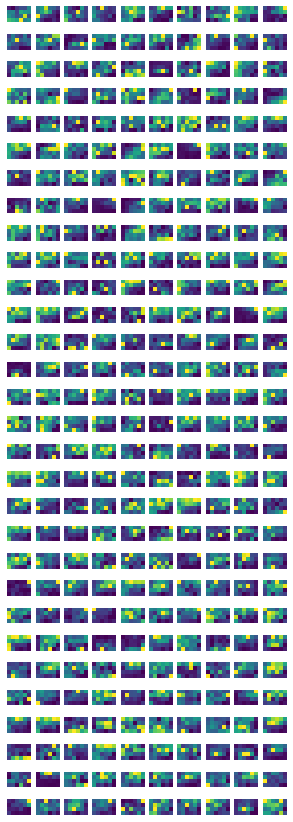

In [204]:
plt.figure()
ut.imshow_in_rows(sc[:300,:,:,0])

In [206]:
plt.figure()
roilist = [13,70,57,86,89,60,78,144,134,290]
ut.imshow_in_pairs(sc[roilist,:,:,0],sc[roilist,:,:,1])

<Figure size 432x288 with 0 Axes>

<IPython.core.display.Javascript object>


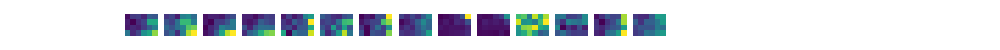

<IPython.core.display.Javascript object>


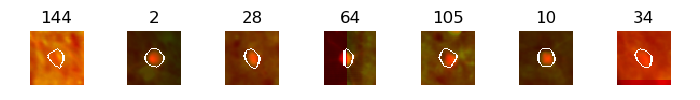

<IPython.core.display.Javascript object>


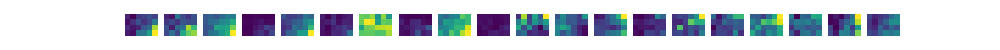

<IPython.core.display.Javascript object>


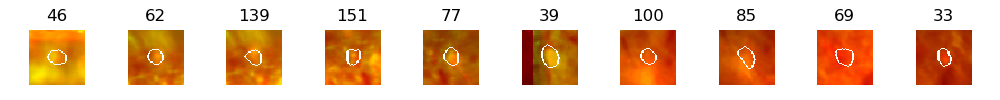

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<IPython.core.display.Javascript object>


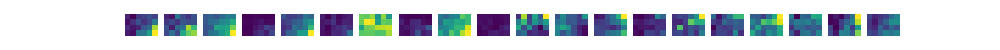

<IPython.core.display.Javascript object>


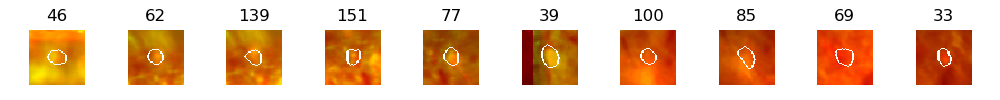

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


In [273]:
# roilist = [70,25,34,13,50,16,99]
# ut.imshow_in_pairs(sc[roilist,:,:,0],sc[roilist,:,:,1])
# # M0276 red ROIs >>
# # roilist = [9,11,351,373,380,378,388,348,403,385,670,372,368,410,514,400,556,520,355,585,57,201,167,182]
# # <<
# M0274 red ROIs >>
# roilist_sst = [144,2,28,64,105,10,34]
# roilist_vip = [46,62,139,151,77,39,100,85,69,33]
# roilist_neither = [45,169,56,104,122,132,72,101,111,160,133,43,161,110,78,52,128,172,66,123,184,82,22,116,121,47,16,170,145]
# <<

roilist = roilist_sst.copy()
ut.imshow_in_pairs(sc[roilist,:,:,0],sc[roilist,:,:,1])
nroi = len(roilist)
sz = 1
plt.figure(figsize=(sz*nroi,sz))
for iroi in range(nroi):
    plt.subplot(1,nroi,iroi+1)
    show_outline(roilist[iroi],norm_to_max=True)
    plt.axis('off')
    plt.title(roilist[iroi])
plt.tight_layout()

roilist = roilist_vip.copy()
ut.imshow_in_pairs(sc[roilist,:,:,0],sc[roilist,:,:,1])
nroi = len(roilist)
sz = 1
plt.figure(figsize=(sz*nroi,sz))
for iroi in range(nroi):
    plt.subplot(1,nroi,iroi+1)
    show_outline(roilist[iroi],norm_to_max=True)
    plt.axis('off')
    plt.title(roilist[iroi])
plt.tight_layout()

roilist = roilist_vip.copy()
ut.imshow_in_pairs(sc[roilist,:,:,0],sc[roilist,:,:,1])
nroi = len(roilist)
sz = 1
plt.figure(figsize=(sz*nroi,sz))
for iroi in range(nroi):
    plt.subplot(1,nroi,iroi+1)
    show_outline(roilist[iroi],norm_to_max=True)
    plt.axis('off')
    plt.title(roilist[iroi])
plt.tight_layout()

In [38]:
def scatter_opto_effect(sc):
    sca.scatter_size_contrast(sc[:,:,:,0].mean(0),sc[:,:,:,1].mean(0))
    plt.xlabel('event rate/max event rate, light off')
    plt.ylabel('event rate/max event rate, light on')
    
def show_opto_effect(sc):
    ut.imshow_in_pairs(np.flip(sc[:,:,:,0],1),np.flip(sc[:,:,:,1],1))

<IPython.core.display.Javascript object>


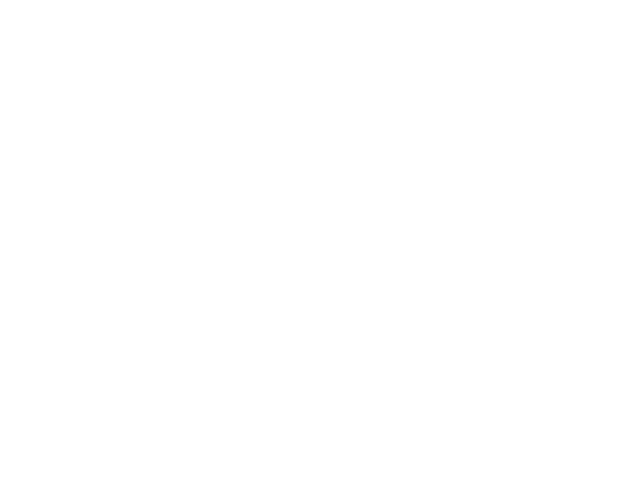

In [272]:
plt.figure()
c = 0
ikey = 0
sc = np.nanmean(np.nanmean(tuning[c][ikey][:,:,:,:,:,nbefore:-nafter],-1),-2)
omi = compute_mi(sc[:,:,:,0].mean(1).mean(1),sc[:,:,:,1].mean(1).mean(1))
goes_up = omi>0
sca.scatter_size_contrast(sc[roilist_sst].mean(0)[:,:,0].T,sc[roilist_sst].mean(0)[:,:,1].T,nsize=4,ncontrast=6)
plt.plot((0,0.07),(0,0.07))

IndexError: index 375 is out of bounds for axis 0 with size 162

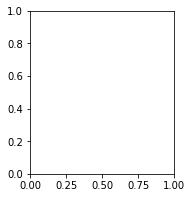

In [38]:
plt.figure(figsize=(15,3))
roilist = [375,391,430,359,636]
for iiroi,iroi in enumerate(roilist):
    plt.subplot(1,len(roilist),iiroi+1)
    sca.scatter_size_contrast(sc[iroi][:,:,0],sc[iroi][:,:,1],nsize=4,ncontrast=6)
    plt.plot((0,sc[iroi].max()),(0,sc[iroi].max()))
    
plt.figure(figsize=(3,3))
roilist = [375,391,430,359,636]
scm = sc[roilist].mean(0)
# for iiroi,iroi in enumerate(roilist):
#     plt.subplot(1,len(roilist),iiroi+1)
sca.scatter_size_contrast(scm[:,:,0],scm[:,:,1],nsize=4,ncontrast=6)
plt.plot((0,scm.max()),(0,scm.max()))

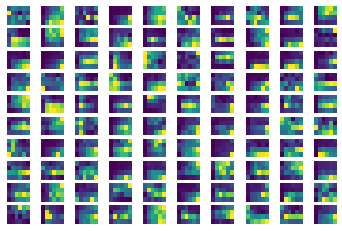

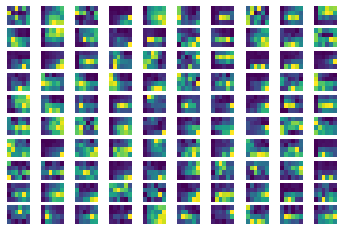

In [67]:
plt.figure()
for iroi in range(100):
    plt.subplot(10,10,iroi+1)
    sca.show_size_contrast(sc[iroi,:,:,0],flipud=True)
    plt.axis('off')
plt.figure()
for iroi in range(100):
    plt.subplot(10,10,iroi+1)
    sca.show_size_contrast(sc[iroi,:,:,1],flipud=True)
    plt.axis('off')

<Figure size 432x288 with 0 Axes>

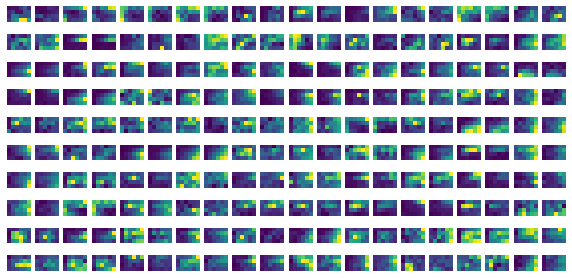

In [72]:
plt.figure()
ut.imshow_in_pairs(sc[:100,:,:,0],sc[:100,:,:,1])

In [70]:
np.logspace(np.log10(5),np.log10(60),4)

array([ 5.        , 11.44714243, 26.20741394, 60.        ])

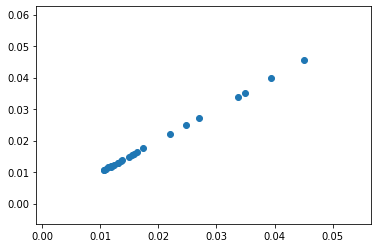

In [250]:
plt.figure()
plt.scatter(sc[is_vip].mean(0).mean(-1),sc[is_sst].mean(0).mean(-1))

In [253]:
matfile = sio.loadmat(matname)

In [259]:
tuning[0][0].max()

4.756694042682648

In [19]:
def show_opto_effect(sc):
    ut.imshow_in_pairs(np.flip(sc[:,:,:,0],1),np.flip(sc[:,:,:,1],1))

In [24]:
reload(sca)

<module 'size_contrast_analysis' from '/Users/dan/Documents/code/adesnal/size_contrast_analysis.py'>

<IPython.core.display.Javascript object>


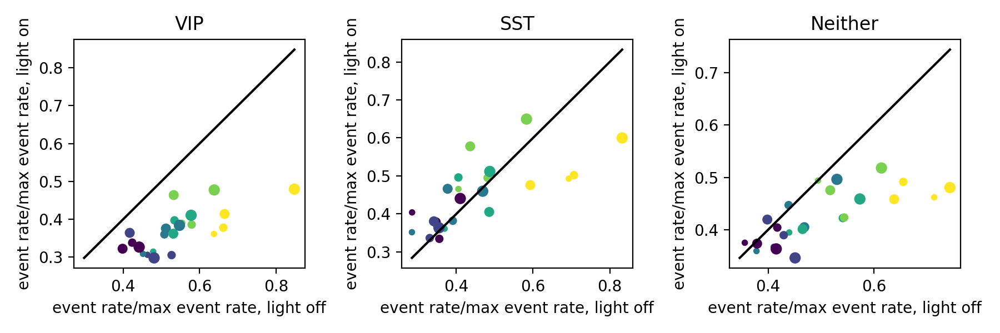

<IPython.core.display.Javascript object>


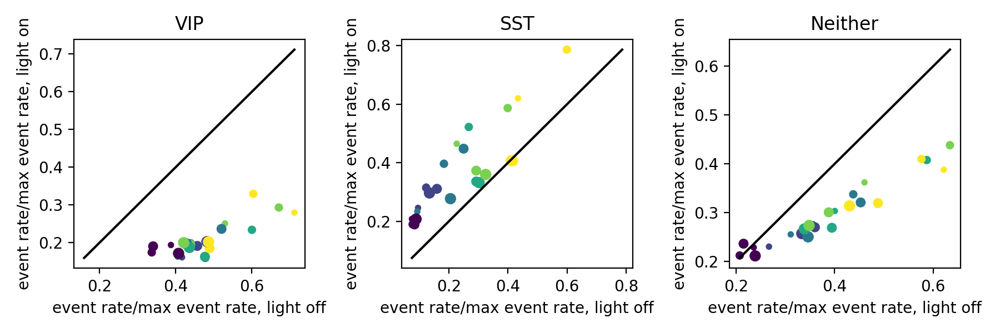

<IPython.core.display.Javascript object>


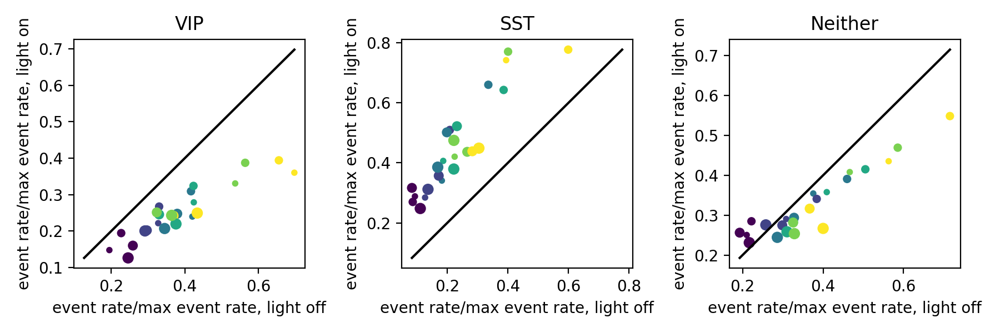

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice
  import sys


<IPython.core.display.Javascript object>


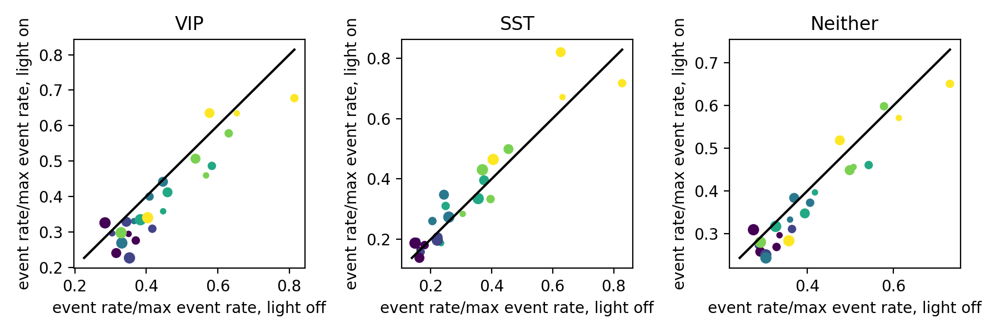

In [25]:
zstack_base = '/Users/dan/Documents/notebooks/mossing-PC/shared_data/zstacks'
c = 1
for iexpt,session_id in enumerate(keylist):
    _,dstr,animalid = session_id.split('_')
    matname = '/'.join([zstack_base,animalid,dstr,'manual_2d_labels.mat'])
    if os.path.exists(matname):
        sc = np.nanmean(np.nanmean(tuning[c][iexpt][:,:,:,:,:,nbefore:-nafter],-1),-2)
        sc = sc/sc.max(1).max(1).max(1)[:,np.newaxis,np.newaxis,np.newaxis]
        is_sst,is_vip = ut.loadmat(matname,['is_sst','is_vip'])
        is_sst = is_sst>0
        is_vip = is_vip>0
        plt.figure(figsize=(9,3))
        plt.subplot(1,3,1)
        plt.title('VIP')
        scatter_opto_effect(sc[is_vip])
        plt.subplot(1,3,2)
        plt.title('SST')
        scatter_opto_effect(sc[is_sst])
        plt.subplot(1,3,3)
        plt.title('Neither')
        scatter_opto_effect(sc[~is_vip & ~is_sst])
        plt.tight_layout()
        plt.savefig(zstack_base+'/'+session_id+'_scatter.jpg',dpi=300)

<IPython.core.display.Javascript object>


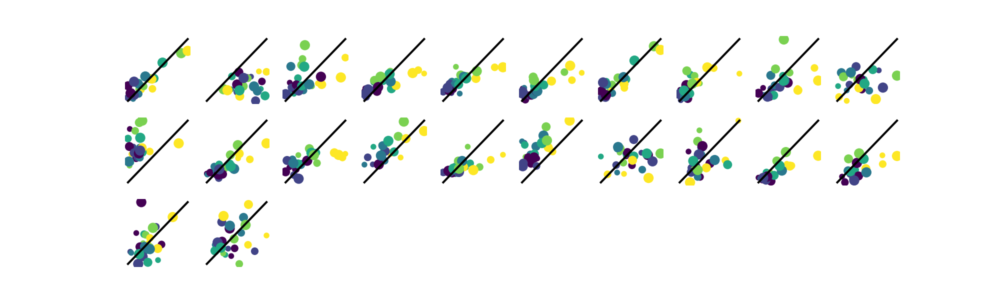

<IPython.core.display.Javascript object>


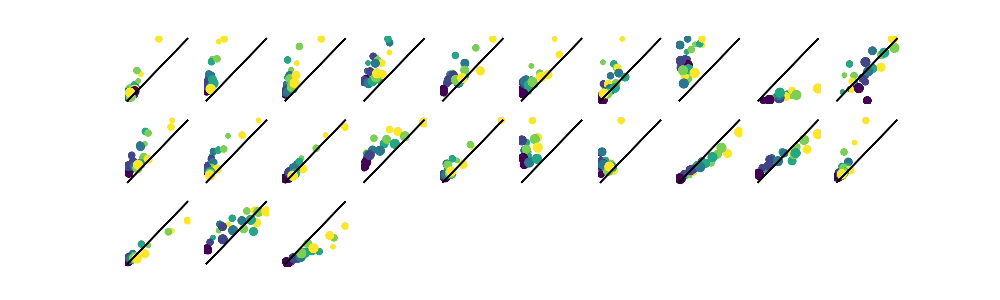

<IPython.core.display.Javascript object>


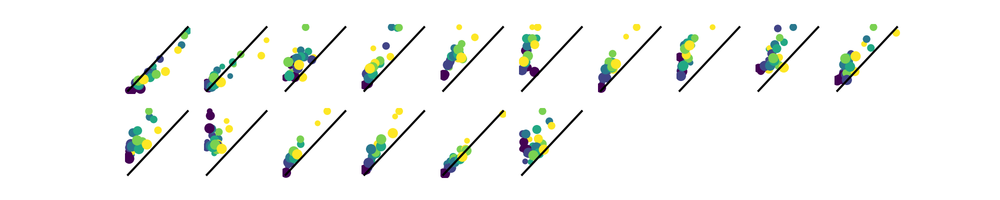

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice
  import sys


<IPython.core.display.Javascript object>


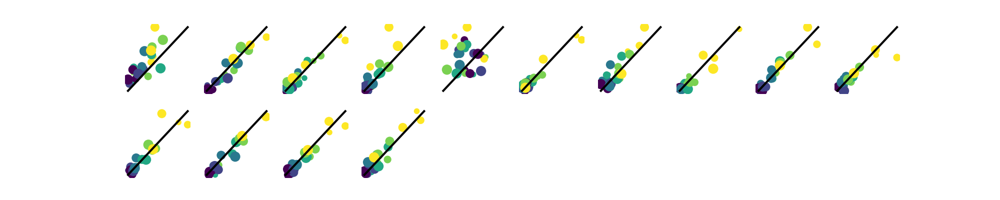

In [35]:
zstack_base = '/Users/dan/Documents/notebooks/mossing-PC/shared_data/zstacks'
c = 1
for iexpt,session_id in enumerate(keylist):
    _,dstr,animalid = session_id.split('_')
    matname = '/'.join([zstack_base,animalid,dstr,'manual_2d_labels.mat'])
    if os.path.exists(matname):
        sc = np.nanmean(np.nanmean(tuning[c][iexpt][:,:,:,:,:,nbefore:-nafter],-1),-2)
        sc = sc/sc.max(1).max(1).max(1)[:,np.newaxis,np.newaxis,np.newaxis]
        is_sst,is_vip = ut.loadmat(matname,['is_sst','is_vip'])
        is_sst = is_sst>0
        is_vip = is_vip>0
        nroi = np.sum(is_sst)
        ncols = 10
        nrows = nroi//ncols + 1
        plt.figure(figsize=(ncols,nrows))
        for iiroi,iroi in enumerate(np.where(is_sst)[0]):
            plt.subplot(nrows,ncols,iiroi+1)
            scatter_opto_effect(sc[iroi:iroi+1])
            plt.axis("off")

<IPython.core.display.Javascript object>


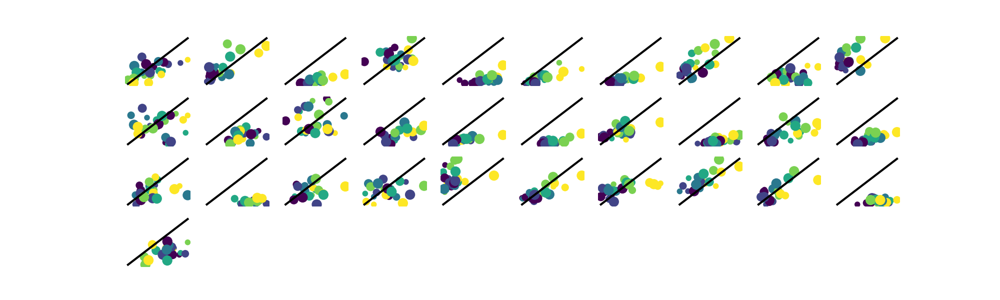

<IPython.core.display.Javascript object>


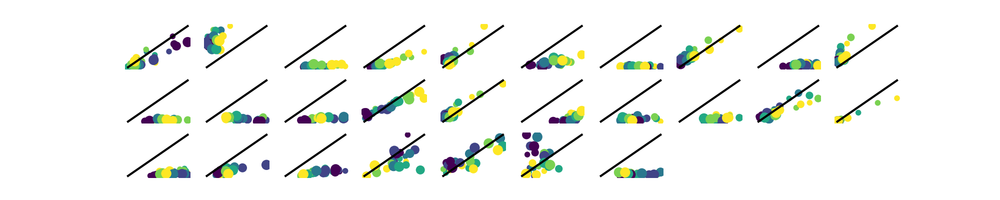

<IPython.core.display.Javascript object>


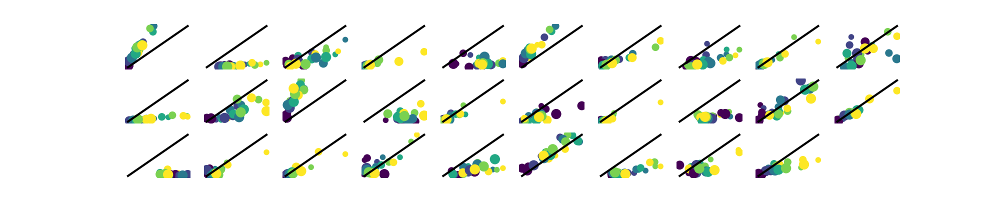

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice
  import sys


<IPython.core.display.Javascript object>


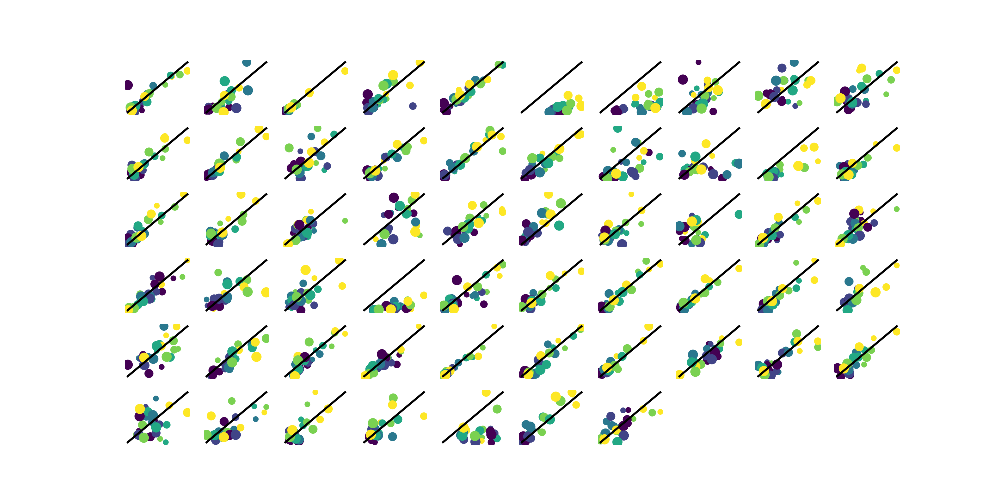

In [34]:
zstack_base = '/Users/dan/Documents/notebooks/mossing-PC/shared_data/zstacks'
c = 1
for iexpt,session_id in enumerate(keylist):
    _,dstr,animalid = session_id.split('_')
    matname = '/'.join([zstack_base,animalid,dstr,'manual_2d_labels.mat'])
    if os.path.exists(matname):
        sc = np.nanmean(np.nanmean(tuning[c][iexpt][:,:,:,:,:,nbefore:-nafter],-1),-2)
        sc = sc/sc.max(1).max(1).max(1)[:,np.newaxis,np.newaxis,np.newaxis]
        is_sst,is_vip = ut.loadmat(matname,['is_sst','is_vip'])
        is_sst = is_sst>0
        is_vip = is_vip>0
        nroi = np.sum(is_vip)
        ncols = 10
        nrows = nroi//ncols
        plt.figure(figsize=(ncols,nrows))
        for iiroi,iroi in enumerate(np.where(is_vip)[0]):
            plt.subplot(nrows+1,ncols,iiroi+1)
            scatter_opto_effect(sc[iroi:iroi+1])
            plt.axis("off")

<IPython.core.display.Javascript object>


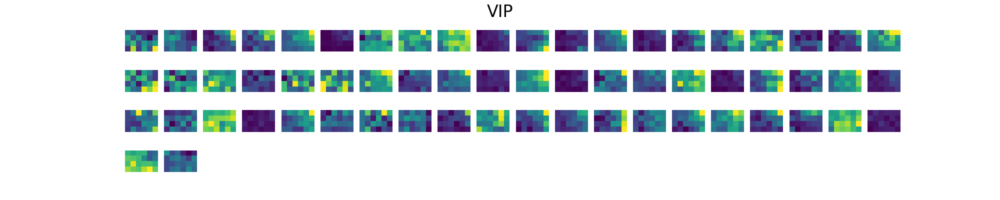

<IPython.core.display.Javascript object>


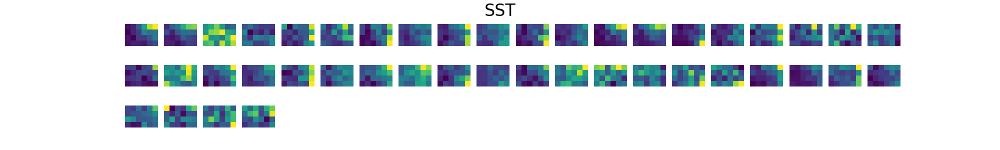

<IPython.core.display.Javascript object>


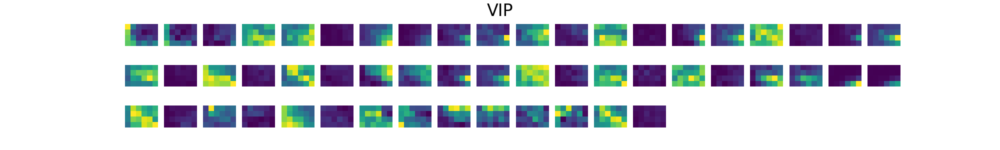

<IPython.core.display.Javascript object>


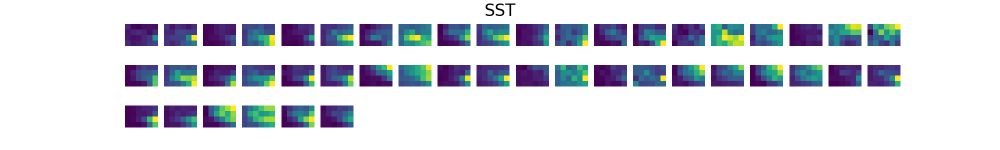

<IPython.core.display.Javascript object>


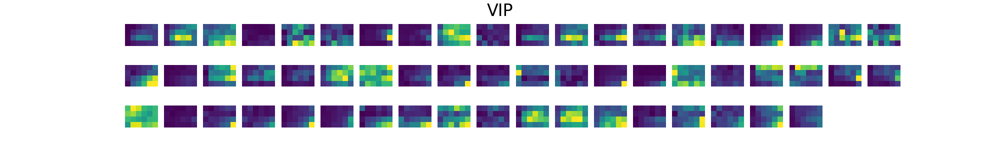

<IPython.core.display.Javascript object>


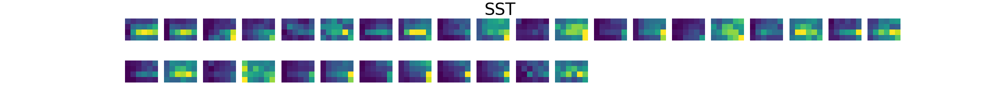

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice
  import sys


<IPython.core.display.Javascript object>


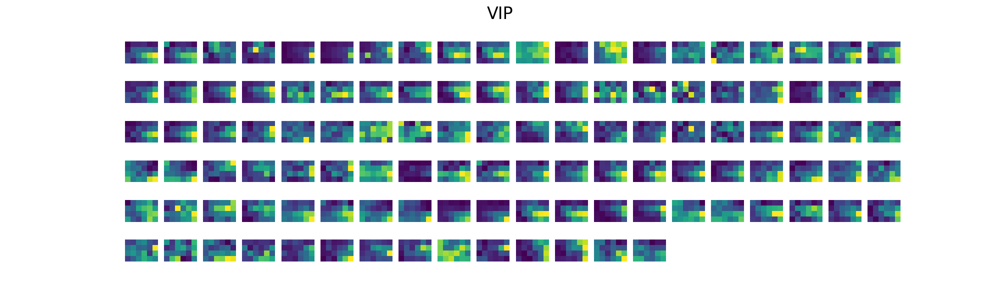

<IPython.core.display.Javascript object>


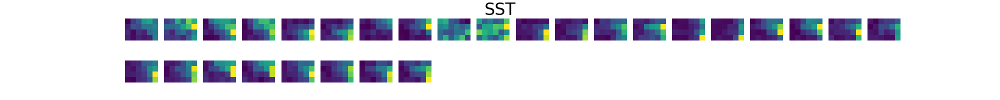

In [37]:
# zstack_base = '/Users/dan/Documents/notebooks/mossing-PC/shared_data/zstacks'
c = 1
for iexpt,session_id in enumerate(keylist):
    _,dstr,animalid = session_id.split('_')
    matname = '/'.join([zstack_base,animalid,dstr,'manual_2d_labels.mat'])
    if os.path.exists(matname):
        sc = np.nanmean(np.nanmean(tuning[c][iexpt][:,:,:,:,:,nbefore:-nafter],-1),-2)
        sc = sc/sc.max(1).max(1).max(1)[:,np.newaxis,np.newaxis,np.newaxis]
        is_sst,is_vip = ut.loadmat(matname,['is_sst','is_vip'])
        is_sst = is_sst>0
        is_vip = is_vip>0
        show_opto_effect(sc[is_vip])
        plt.suptitle('VIP')
        plt.savefig(zstack_base+'/'+session_id+'_vip.jpg',dpi=300)
        show_opto_effect(sc[is_sst])
        plt.suptitle('SST')
        plt.savefig(zstack_base+'/'+session_id+'_sst.jpg',dpi=300)

In [241]:
dstr

'191211'

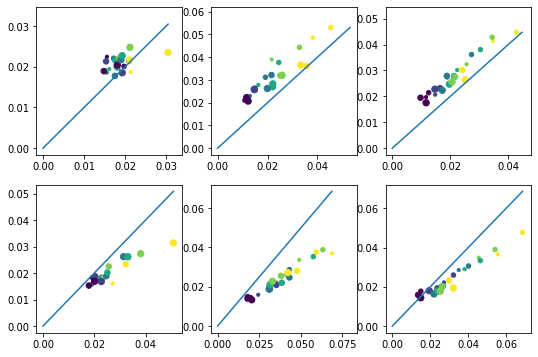

In [86]:
plt.figure(figsize=(12,6))

c = 0
nexpt = len(keylist)
for ikey in range(nexpt-1):
    sc = np.nanmean(np.nanmean(tuning[c][ikey][:,:,:,:,:,nbefore:-nafter],-1),-2)
    omi = compute_mi(sc[:,:,:,0].mean(1).mean(1),sc[:,:,:,1].mean(1).mean(1))
    goes_up = omi>0

    plt.subplot(2,nexpt,ikey+1)
    sca.scatter_size_contrast(sc[goes_up,:,:,0].mean(0),sc[goes_up,:,:,1].mean(0),nsize=4,ncontrast=6)
    mx = sc[goes_up,:,:,:].mean(0).max()
    plt.plot((0,mx),(0,mx))
    
    plt.subplot(2,nexpt,nexpt+ikey+1)
    sca.scatter_size_contrast(sc[~goes_up,:,:,0].mean(0),sc[~goes_up,:,:,1].mean(0),nsize=4,ncontrast=6)
    mx = sc[~goes_up,:,:,:].mean(0).max()
    plt.plot((0,mx),(0,mx))

In [35]:
def regression_slope(x,y):
    linreg = sklm.LinearRegression(fit_intercept=False).fit(x[:,np.newaxis],y[:,np.newaxis])
    return linreg.coef_[0,0],linreg.score(x[:,np.newaxis],y[:,np.newaxis])

In [36]:
def roiwise_regression_slope(sc):
    nroi = sc.shape[0]
    slope = np.zeros((nroi,))
    score = np.zeros((nroi,))
    for iroi in range(nroi):
        slope[iroi],score[iroi] = regression_slope(sc[iroi][:,:,0].flatten(),sc[iroi][:,:,1].flatten())
    return slope,score

In [37]:
slope,score = regression_slope(sc[iroi][:,:,0].flatten(),sc[iroi][:,:,1].flatten())

In [38]:
nroi = sc.shape[0]
slope = np.zeros((nroi,))
score = np.zeros((nroi,))
for iroi in range(nroi):
    slope[iroi],score[iroi] = regression_slope(sc[iroi][:,:,0].flatten(),sc[iroi][:,:,1].flatten())

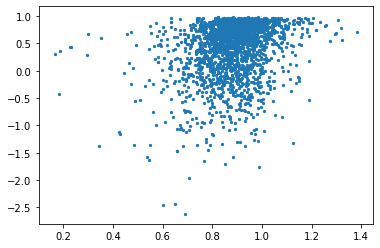

In [39]:
plt.figure()
plt.scatter(slope,score,s=5)

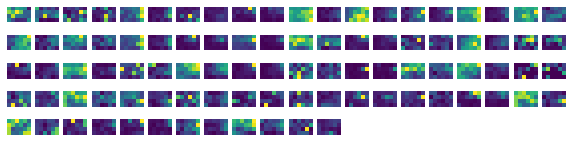

In [44]:
ut.imshow_in_pairs(sc[slope<0.6,:,:,0],sc[slope<0.6,:,:,1])

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


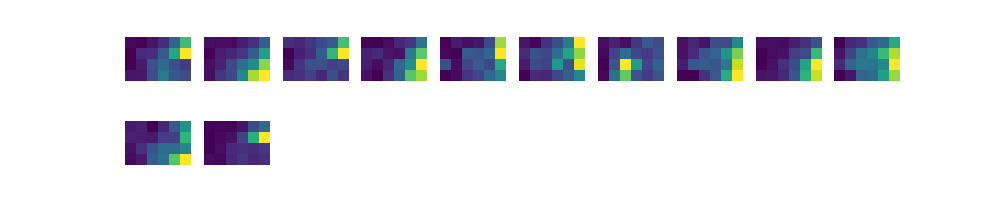

<IPython.core.display.Javascript object>


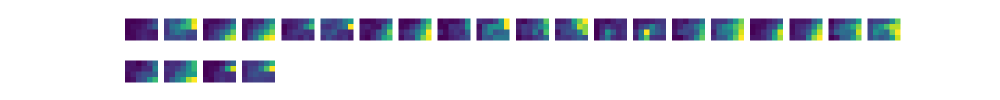

<IPython.core.display.Javascript object>


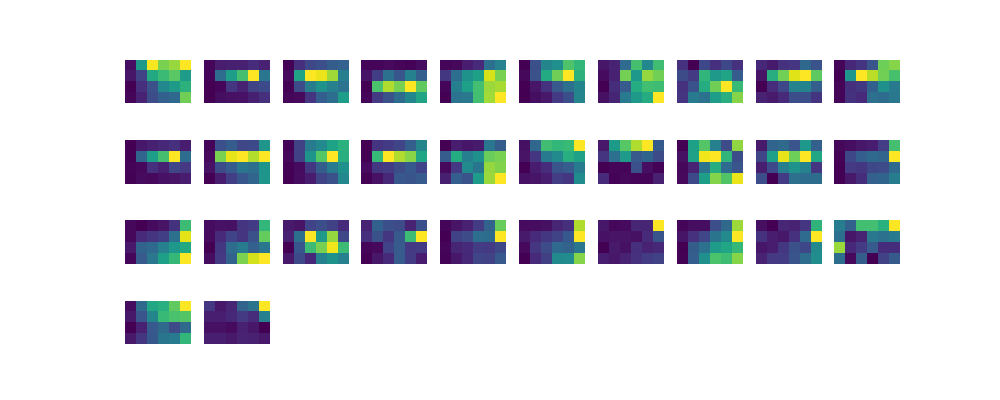

<IPython.core.display.Javascript object>


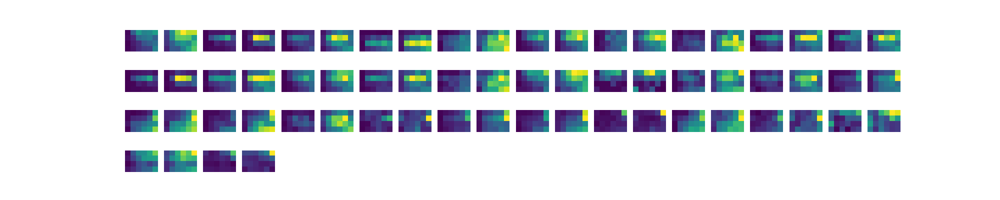

In [133]:
c = 0
for ikey in range(nexpt-1):
    sc = np.nanmean(np.nanmean(tuning[c][ikey][:,:,:,:,:,nbefore:-nafter],-1),-2)
    slope,score = roiwise_regression_slope(sc)
    linearly_up = np.logical_and(score>0.5,slope>1.2)
    ut.imshow_in_rows(sc[linearly_up,:,:,0])
    ut.imshow_in_pairs(sc[linearly_up,:,:,0],sc[linearly_up,:,:,1])

<IPython.core.display.Javascript object>


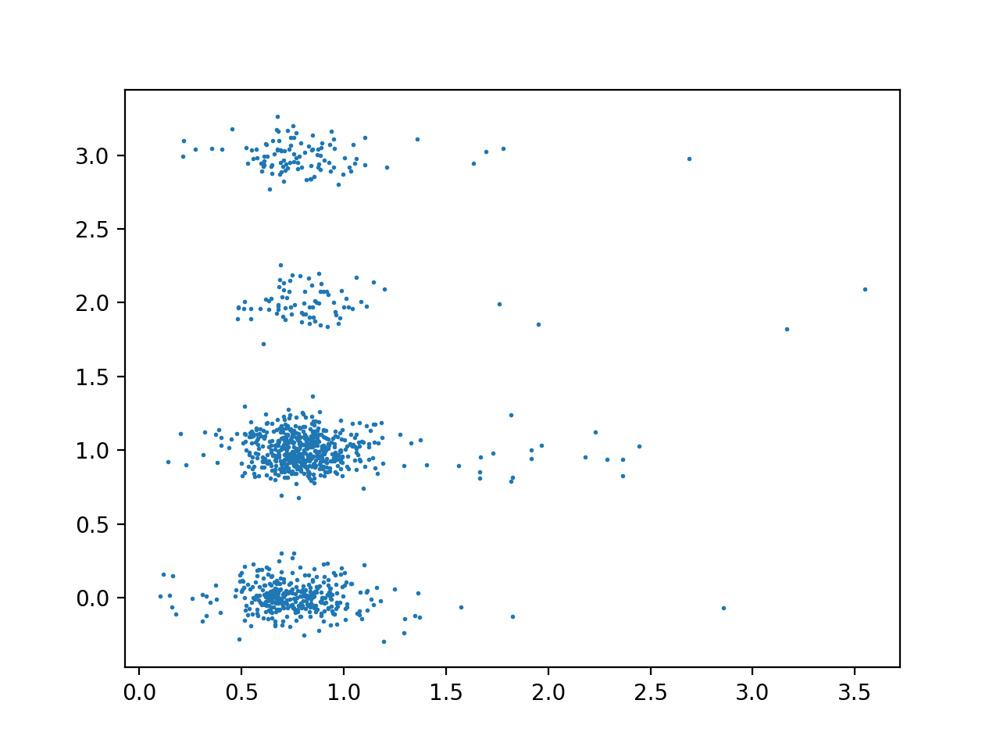

<IPython.core.display.Javascript object>


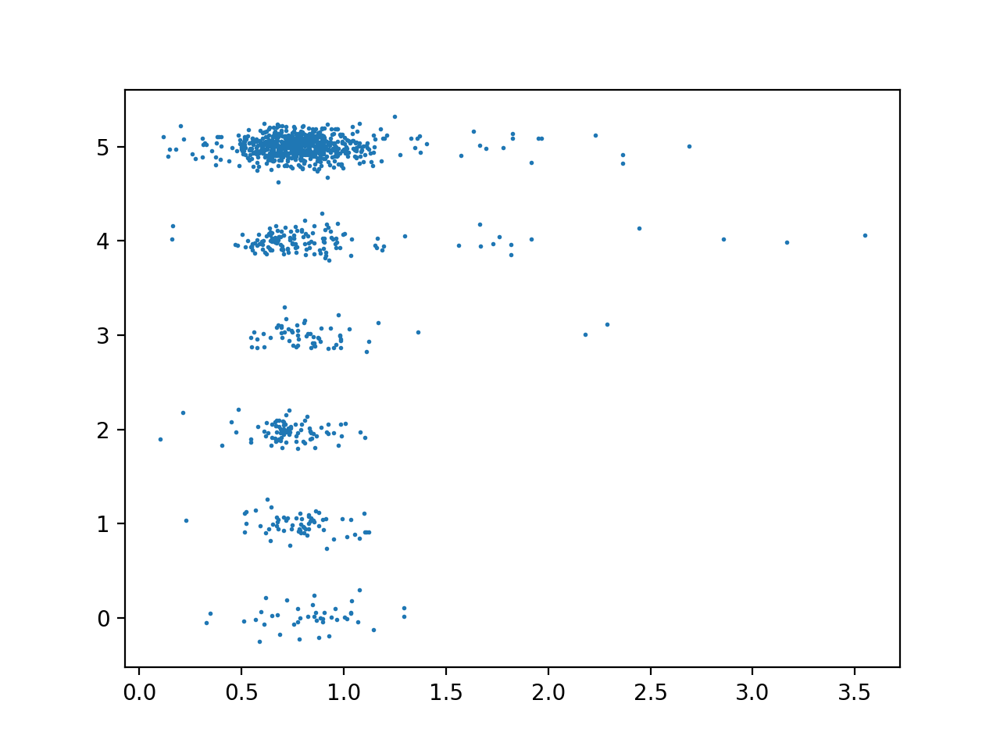

<IPython.core.display.Javascript object>


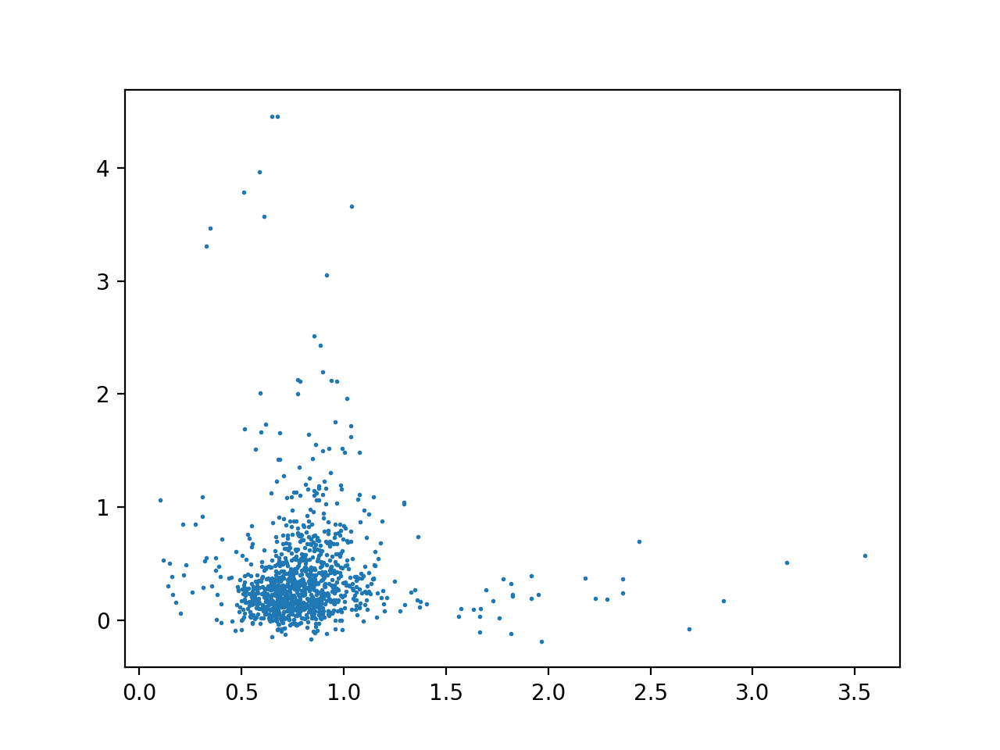

In [118]:
plt.figure()
plt.scatter(slope[score>0],0.1*np.random.randn((score>0).sum())+np.argmax(sc[score>0,:,:,0].mean(-1),axis=1),s=1)
plt.figure()
plt.scatter(slope[score>0],0.1*np.random.randn((score>0).sum())+np.argmax(sc[score>0,:,:,0].mean(1),axis=1),s=1)
plt.figure()
for icontrast in range(0,1):
    plt.scatter(slope[score>0],0.1*np.random.randn((score>0).sum())+(sc[score>0,:,icontrast,0].mean(1))/(sc[score>0,:,-1,0].mean(1)),s=1)


<IPython.core.display.Javascript object>


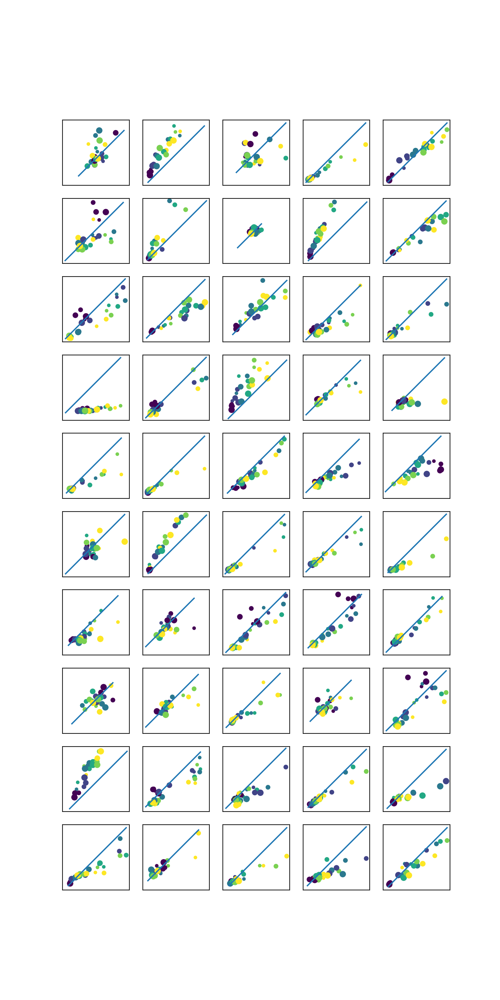

In [120]:
plt.figure(figsize=(8,16))
roilist = np.arange(50)
for iiroi,iroi in enumerate(roilist):
    plt.subplot(10,5,iiroi+1)
    sca.scatter_size_contrast(sc[iroi][:,:,0],sc[iroi][:,:,1],nsize=4,ncontrast=6)
    plt.plot((0,sc[iroi].max()),(0,sc[iroi].max()))
    plt.axis('equal')
    plt.xticks([])
    plt.yticks([])
    

<IPython.core.display.Javascript object>


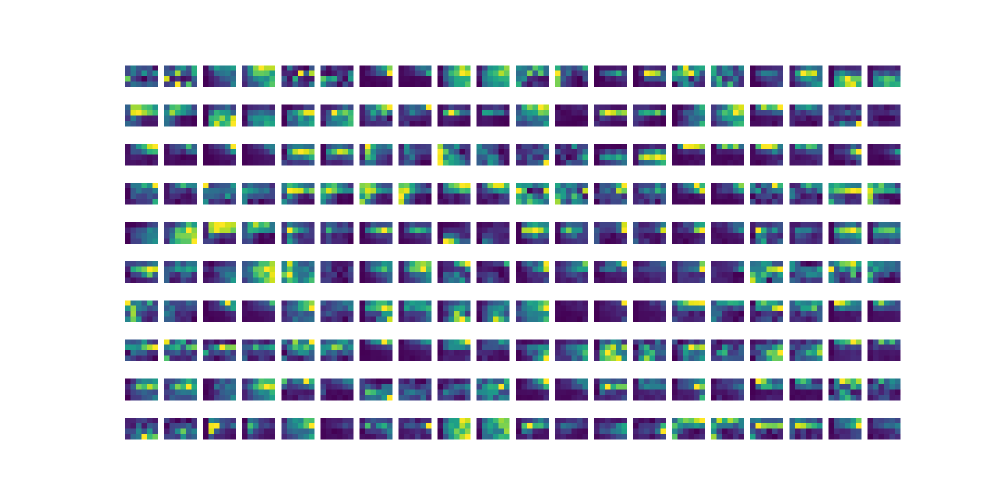

In [121]:
ut.imshow_in_pairs(sc[:100,:,:,0],sc[:100,:,:,1])


<IPython.core.display.Javascript object>


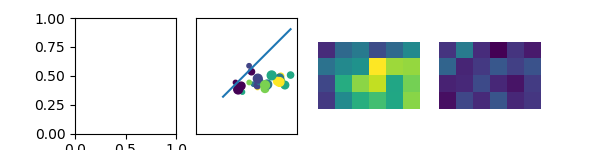

In [167]:
plt.figure(figsize=(6,1.5))
ut.mkdir('figures/vip_halo_M0274_191017/')
nroi = sc.shape[0]
for iroi in range(nroi):
    plt.clf()
    plt.subplot(1,4,1)
#     show_outline(iroi)
    plt.subplot(1,4,2)
    sca.scatter_size_contrast(sc[iroi,:,:,0],sc[iroi,:,:,1],nsize=4,ncontrast=6)
    plt.plot((0,sc[iroi].max()),(0,sc[iroi].max()))
    plt.xticks([])
    plt.yticks([])
    plt.axis('equal')
    for ilight in range(2):
        plt.subplot(1,4,ilight+3)
        plt.imshow(sc[iroi,:,:,ilight],vmin=sc[iroi].min(),vmax=sc[iroi].max())
        plt.axis('off')
    plt.savefig('figures/vip_halo_M0274_191017/%03d.jpg'%iroi,dpi=300)

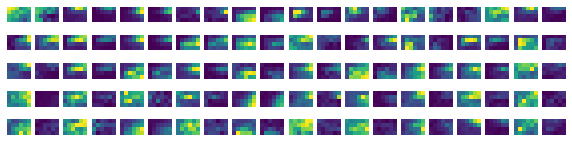

In [87]:
ut.imshow_in_pairs(sc[:50,:,:,0],sc[:50,:,:,1])

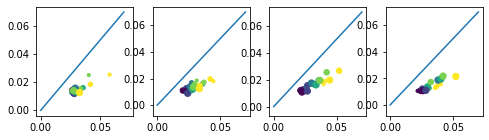

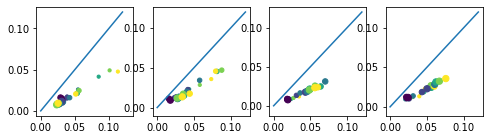

In [83]:
bd = [0.07,0.12]
for ikey in range(len(keylist)):
    sc = np.nanmean(np.nanmean(tuning[ikey][:,:,:,:,:,nbefore:-nafter],-1),-2)
    pref_size = np.argmax(sc.mean(-1).mean(-1),axis=1)
    plt.figure(figsize=(8,2))
    for s in range(nsize):
        plt.subplot(1,nsize,s+1)
        x,y = [sc[pref_size==s,:,:,ilight].mean(0) for ilight in range(2)]
        sca.scatter_size_contrast(x,y,nsize=nsize,ncontrast=ncontrast)
        plt.plot((0,bd[ikey]),(0,bd[ikey]))

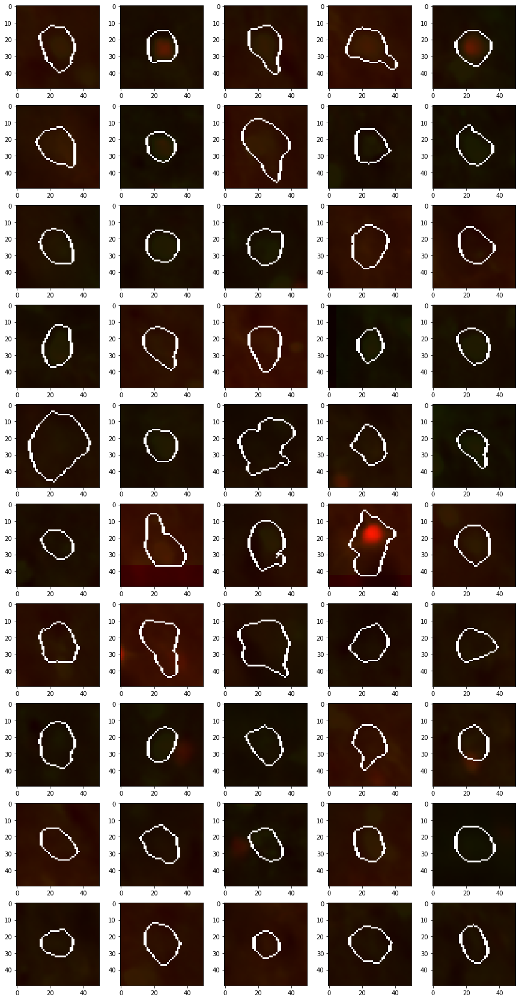

In [24]:
plt.figure(figsize=(15,30))
roilist = np.arange(50)
for iiroi,iroi in enumerate(roilist):
    plt.subplot(10,5,iiroi+1)
    show_outline(iroi)

In [89]:
pdb.pm()

> /home/mossing/anaconda3/envs/py3/lib/python3.7/site-packages/numpy/core/_methods.py(34)_amin()
-> return umr_minimum(a, axis, None, out, keepdims, initial, where)
(Pdb) u
> /home/mossing/anaconda3/envs/py3/lib/python3.7/site-packages/numpy/ma/core.py(5641)min()
-> axis=axis, out=out, **kwargs).view(type(self))
(Pdb) u
> /home/mossing/anaconda3/envs/py3/lib/python3.7/site-packages/matplotlib/image.py(698)set_data()
-> if self._A.min() < 0 or high < self._A.max():
(Pdb) u
> /home/mossing/anaconda3/envs/py3/lib/python3.7/site-packages/matplotlib/axes/_axes.py(5671)imshow()
-> im.set_data(X)
(Pdb) u
> /home/mossing/anaconda3/envs/py3/lib/python3.7/site-packages/matplotlib/cbook/deprecation.py(369)wrapper()
-> return func(*args, **kwargs)
(Pdb) u
> /home/mossing/anaconda3/envs/py3/lib/python3.7/site-packages/matplotlib/cbook/deprecation.py(369)wrapper()
-> return func(*args, **kwargs)
(Pdb) u
> /home/mossing/anaconda3/envs/py3/lib/python3.7/site-packages/matplotlib/__init__.py(1601)inner(

In [15]:
plt.figure()
foldname = 'figures/red_green_images/'
ut.mkdir(foldname)
# with h5py.File(dsfile,mode='r') as f:
#     keylist = [key for key in f.keys()]
#     for ikey in range(1,len(keylist)):
#         this_foldname = foldname+keylist[ikey]
#         ut.mkdir(this_foldname)
#         print([key for key in f[keylist[ikey]].keys()])
#         depth = f[keylist[ikey]]['cell_depth'][:]
#         msk = f[keylist[ikey]]['cell_mask'][:]
#         ctr = f[keylist[ikey]]['cell_center'][:]
#         cell_id = f[keylist[ikey]]['cell_id'][:]
#         nbefore = 8#f[keylist[ikey]]['nbefore']
#         nafter = 8#f[keylist[ikey]]['nafter']
#         iplane = 0
#         red = f[keylist[ikey]]['mean_red_channel'][iplane]
#         green = f[keylist[ikey]]['mean_green_channel'][iplane]
#         red_green = combine_rg(red,green)
for ikey in range(len(keylist)):
    this_foldname = foldname+keylist[ikey]
    ut.mkdir(this_foldname)
    red_green,msk,ctr,depth,cell_id = process_mean_image(dsfile,ikey)
    for ind in range(ctr.shape[0]):
        plt.clf()
#         img = sks.mark_boundaries(red_green[depth[ind]],skm.binary_dilation(msk[ind]).astype('int'),color=(1,1,1))
#         c = ctr[ind].astype('int')
#         bds = np.array([c[0]-25,c[0]+25,c[1]-25,c[1]+25])
#         bds = np.maximum(bds,0)
#         plt.imshow(img[bds[0]:bds[1],bds[2]:bds[3]])
#         plt.axis('off')
        show_roi_msk(red_green,msk,depth,ctr,ind)
        plt.savefig(this_foldname+'/%04d.pdf' % ind)


NameError: name 'show_roi_msk' is not defined

<Figure size 432x288 with 0 Axes>

In [ ]:
# def show_roi_msk(red_green,msk,depth,ctr,ind,norm=False):
#     img = sks.mark_boundaries(red_green[depth[ind]],skm.binary_dilation(msk[ind]).astype('int'),color=(1,1,1))
#     c = ctr[ind].astype('int')
#     bds = np.array([c[0]-25,c[0]+25,c[1]-25,c[1]+25])
#     bds = np.maximum(bds,0)
#     imsmall = img[bds[0]:bds[1],bds[2]:bds[3]]
#     if norm:
#         plt.imshow((imsmall-imsmall.min())/(imsmall.max()-imsmall.min()))
#     else:
#         plt.imshow(imsmall)
#     plt.axis('off')
    
def show_roi_msk(red_green,msk,depth,ctr,ind,norm=False):
    c = ctr[ind].astype('int')
    bds = np.array([c[0]-25,c[0]+25,c[1]-25,c[1]+25])
    bds = np.maximum(bds,0)
    imsmall = red_green[depth[ind]][bds[0]:bds[1],bds[2]:bds[3]].copy()
    msksmall = msk[ind][bds[0]:bds[1],bds[2]:bds[3]].copy()
    if norm:
        imsmall = (imsmall-imsmall.min())/(imsmall.max()-imsmall.min())
    img = sks.mark_boundaries(imsmall,skm.binary_dilation(msksmall).astype('int'),color=(1,1,1))
    plt.imshow(img)
    plt.axis('off')

In [ ]:
def redilate(im,iterations=1):
    to_return = im.copy()
    for ii in range(iterations):
        to_return = skm.binary_dilation(to_return)
    return to_return

In [ ]:
def show_light_on_light_off(tuning,ikey,ind,rows_before=0):
    sc = np.nanmean(np.nanmean(tuning[ikey][ind,:,:,:,:,nbefore+2:-nafter-2],-1),-2)
    show_light_on_light_off_sc(sc,rows_before=rows_before)

In [ ]:
def show_light_on_light_off_sc(sc,rows_before=0):
    mn = sc.min()
    mx = sc.max()
    plt.subplot(rows_before+1,2,2*rows_before+1)
    sca.show_size_contrast(sc[:,:,0],vmin=mn,vmax=mx,usize=(8,13,22,36))
    plt.subplot(rows_before+1,2,2*rows_before+2)
    sca.show_size_contrast(sc[:,:,1],vmin=mn,vmax=mx,usize=(8,13,22,36))
    try:
        plt.tight_layout()
    except:
        pass

In [ ]:
def evaluate_redness(mean_red_image,msk,depth,annulus_width=3):
    dilated = np.zeros_like(msk)
    for iroi in range(msk.shape[0]):
        dilated[iroi] = redilate(msk[iroi],iterations=annulus_width)
    dilated = dilated & ~msk
    red_in = np.zeros((msk.shape[0],))
    red_out = np.zeros((msk.shape[0],))
    for iroi in range(msk.shape[0]):
        red_in[iroi] = mean_red_image[depth[iroi]][msk[iroi]].mean()
        red_out[iroi] = mean_red_image[depth[iroi]][dilated[iroi]].mean()
    return red_in,red_out

In [ ]:
reds_in = [None for ikey in range(len(keylist))]
reds_out = [None for ikey in range(len(keylist))]
figfold = 'figures/red_size_contrast_data/'
ut.mkdir(figfold)
plt.figure(figsize=(9,6))
for ikey in range(len(keylist)):
    red_green,msk,ctr,depth,cell_id = process_mean_image(dsfile,ikey)
    red_in,red_out = evaluate_redness(red_green[:,:,:,0],msk,depth,annulus_width=5)
    rmi = (red_in-red_out)/(red_in+red_out)
    candidates = np.where((red_in>1e-1) & (rmi > 0))[0]
    for iwhich in range(len(candidates)):
#         plt.figure()
        plt.clf()
        which = candidates[iwhich]
        plt.subplot(2,3,1)
        plt.scatter(red_in,rmi,s=10)
        plt.scatter(red_in[which],rmi[which],c='m',marker='+')
        plt.xlabel('red intensity (a.u.)')
        plt.ylabel('red prominence \n (in - out)/(in + out)')
        plt.plot((0,0.5),(0,0),c='k')
        plt.subplot(2,3,2)
        show_roi_msk(red_green,msk,depth,ctr,which)
        plt.subplot(2,3,3)
        show_roi_msk(red_green[:,:,:,0],msk,depth,ctr,which,norm=True)
        show_light_on_light_off(tuning,ikey,which,rows_before=1)
        plt.suptitle('%s: ROI %d. RF dist. %.1f$^o$, p=%.3f' % (keylist[ikey],which,rf_dist[ikey][which],rf_pval[ikey][which]))
        plt.savefig('%s%s_roi_%d.pdf' %(figfold,keylist[ikey],which))
    reds_in[ikey],reds_out[ikey] = red_in,red_out

In [ ]:
sc = np.nanmean(np.nanmean(np.nanmean(tuning[ikey][candidates,:,:,:,:,nbefore+2:-nafter-2],-1),-2),0)
plt.figure()
show_light_on_light_off_sc(sc)

In [ ]:
ts = np.concatenate([t for t in tuning if not t is None],axis=0)
#size_contrast = [np.nanmean(np.nanmean(t[:,:,:,:,:,nbefore:-nafter],-1),-2)[:] for t in tuning if not t is None]
sc_all = np.nanmean(np.nanmean(np.nanmean(ts[:,:,:,:,:,nbefore+2:-nafter-2],-1),-2),0)
sc_all_sem = np.nanstd(np.nanmean(np.nanmean(ts[:,:,:,:,:,nbefore+2:-nafter-2],-1),-2),0)/np.sqrt(ts.shape[0])

In [203]:
# ikey = 0
# for ind in (84,229,276,447):
#     sc = np.nanmean(np.nanmean(tuning[ikey][ind,:,:,:,:,nbefore:-nafter],-1),-2)
#     mn = sc.min()
#     mx = sc.max()
#     plt.figure()
#     plt.subplot(1,2,1)
#     sca.show_size_contrast(sc[:,:,0],vmin=mn,vmax=mx,usize=(8,13,22,36))
#     plt.subplot(1,2,2)
#     sca.show_size_contrast(sc[:,:,1],vmin=mn,vmax=mx,usize=(8,13,22,36))
#     plt.tight_layout()

In [210]:
manually_scored = [[27,84,276,480],[137,590],[341],[51,126,131,217,354,376,537,671,789,891,1033,1046,1052,1132],[28,229,271,291,345],[]]

In [279]:
ts = np.zeros((0,)+tuning[0].shape[1:])
for ikey in range(len(keylist)):
    if len(manually_scored[ikey]):
        ts = np.concatenate((ts,tuning[ikey][manually_scored[ikey]]),axis=0)
sc = np.nanmean(np.nanmean(np.nanmean(ts[:,:,:,:,:,nbefore+2:-nafter-2],-1),-2),0)
scsem = np.nanstd(np.nanmean(np.nanmean(ts[:,:,:,:,:,nbefore+2:-nafter-2],-1),-2),0)/np.sqrt(ts.shape[0])

/home/mossing/anaconda3/envs/py3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: Mean of empty slice
  """
/home/mossing/anaconda3/envs/py3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: Mean of empty slice
  


In [280]:
def plot_light_on_light_off_sc(usize,sc,scsem,rows_before=0,colors=None):
#     mn = sc.min()
#     mx = sc.max()
    ybd = (sc.min()*0.8,sc.max()*1.2)
    plt.subplot(rows_before+1,2,2*rows_before+1)
    for i in range(sc.shape[1]):
        plt.errorbar(usize,sc[:,i,0],yerr=scsem[:,i,0],c=colors[i]) #,vmin=mn,vmax=mx,usize=(8,13,22,36))
    plt.ylim(ybd)
    plt.subplot(rows_before+1,2,2*rows_before+2)
    for i in range(sc.shape[1]):
        plt.errorbar(usize,sc[:,i,1],yerr=scsem[:,i,1],c=colors[i]) #,vmin=mn,vmax=mx,usize=(8,13,22,36))
    plt.ylim(ybd)
    try:
        plt.tight_layout()
    except:
        pass
    plt.legend([str(x)+'%' for x in [0,6,12,25,50,100]])

In [281]:
colors = plt.cm.viridis(np.linspace(0,1,6))

<IPython.core.display.Javascript object>


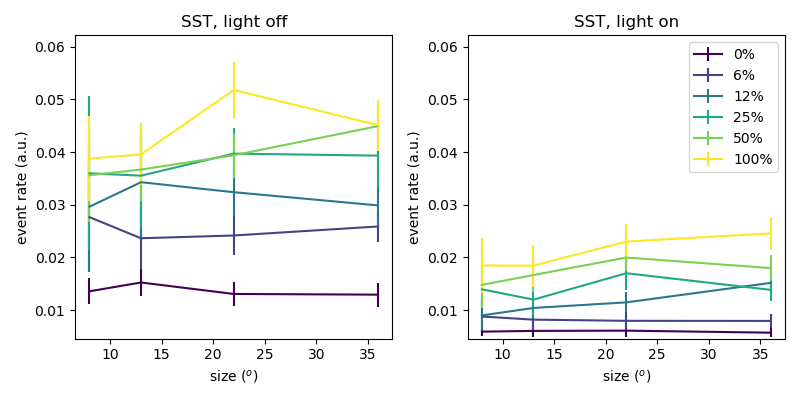

/home/mossing/anaconda3/envs/py3/lib/python3.7/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  


In [282]:
plt.figure(figsize=(8,4))
usize=(8,13,22,36)
plot_light_on_light_off_sc(usize,sc,scsem,colors=colors)
lbls = ['SST, light off','SST, light on']
for ip in range(2):
    plt.subplot(1,2,ip+1)
    plt.title(lbls[ip])
    plt.xlabel('size ($^o$)')
    plt.ylabel('event rate (a.u.)')
    plt.tight_layout()
plt.savefig('figures/sst_light_on_light_off.pdf')
# plt.ylim((0,0.06))

<IPython.core.display.Javascript object>


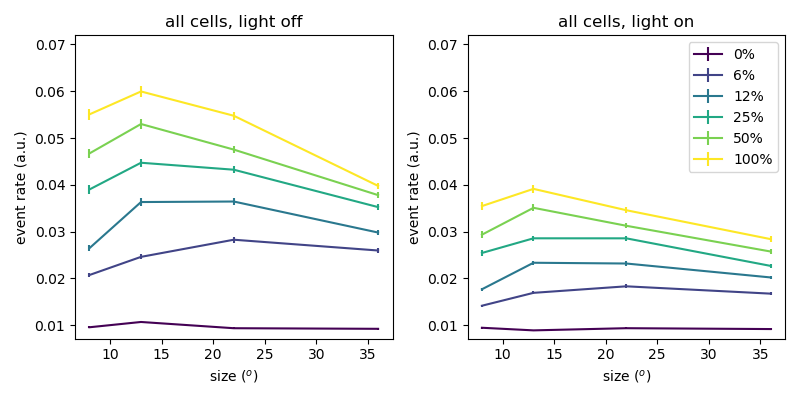

/home/mossing/anaconda3/envs/py3/lib/python3.7/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  


In [283]:
plt.figure(figsize=(8,4))
usize=(8,13,22,36)
plot_light_on_light_off_sc(usize,sc_all,sc_all_sem,colors=colors)
lbls = ['all cells, light off','all cells, light on']
for ip in range(2):
    plt.subplot(1,2,ip+1)
    plt.title(lbls[ip])
    plt.xlabel('size ($^o$)')
    plt.ylabel('event rate (a.u.)')
plt.tight_layout()
plt.savefig('figures/syn_light_on_light_off.pdf')
# plt.ylim((0,0.06))

In [204]:
plt.close('all')

<IPython.core.display.Javascript object>


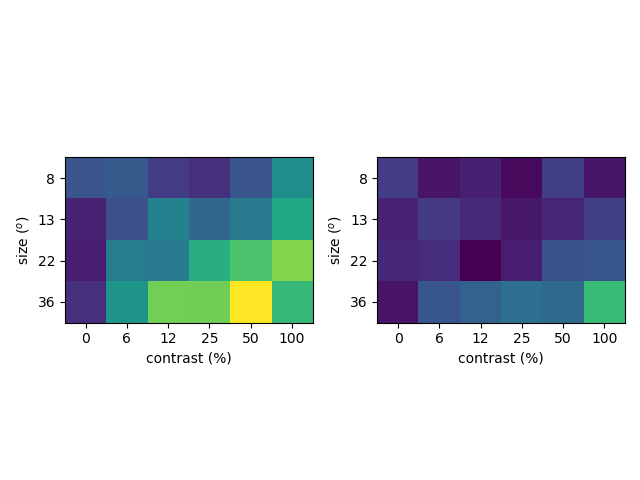

<IPython.core.display.Javascript object>


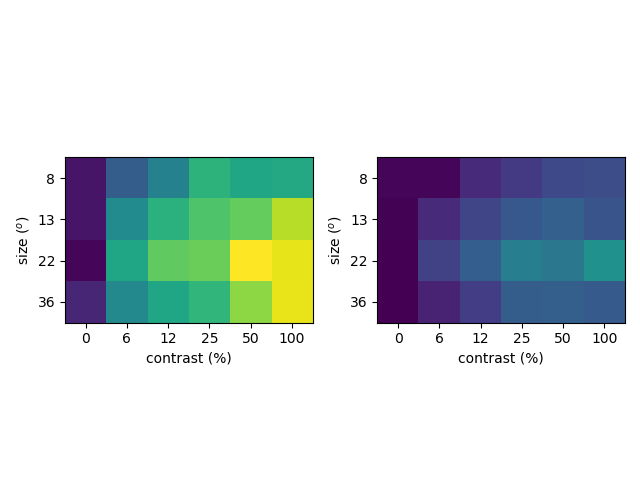

<IPython.core.display.Javascript object>


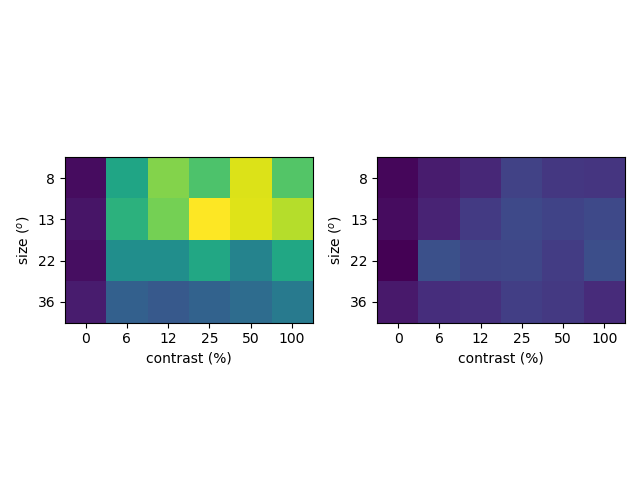

<IPython.core.display.Javascript object>


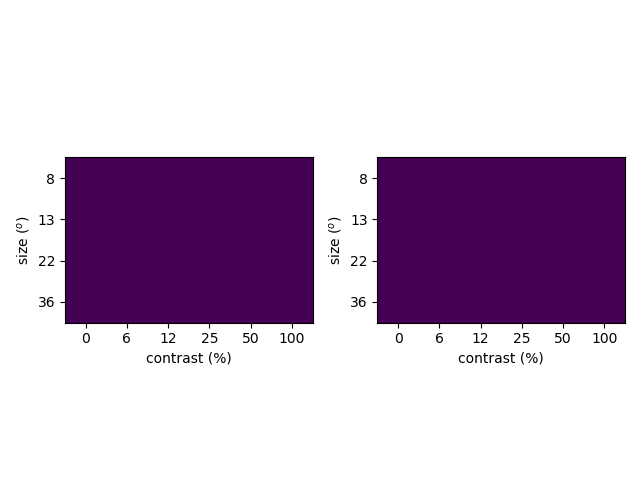

<IPython.core.display.Javascript object>


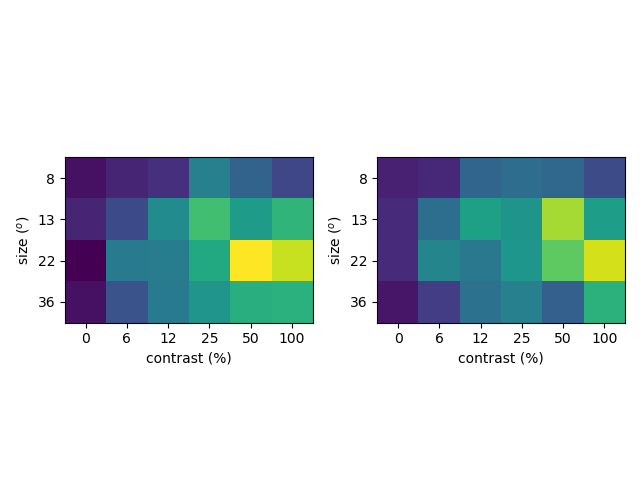

In [103]:
ikey = 1
for ind in (137,143,212,327,476):
    sc = np.nanmean(np.nanmean(tuning[ikey][ind,:,:,:,:,nbefore:-nafter],-1),-2)
    mn = sc.min()
    mx = sc.max()
    plt.figure()
    plt.subplot(1,2,1)
    sca.show_size_contrast(sc[:,:,0],vmin=mn,vmax=mx,usize=(8,13,22,36))
    plt.subplot(1,2,2)
    sca.show_size_contrast(sc[:,:,1],vmin=mn,vmax=mx,usize=(8,13,22,36))
    plt.tight_layout()

/home/mossing/anaconda3/envs/py3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: Mean of empty slice
  This is separate from the ipykernel package so we can avoid doing imports until
/home/mossing/anaconda3/envs/py3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


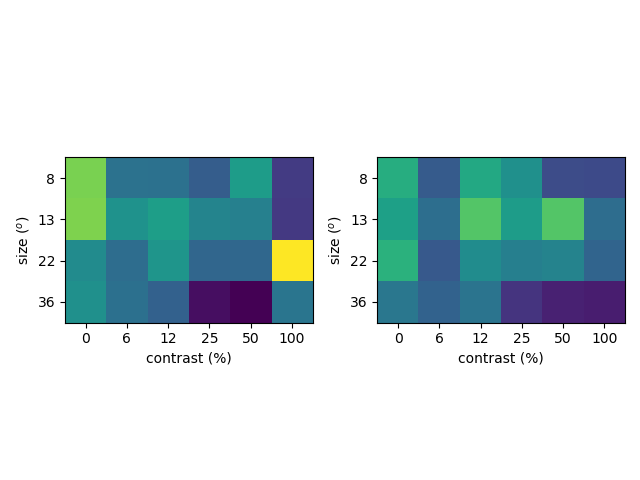

<IPython.core.display.Javascript object>


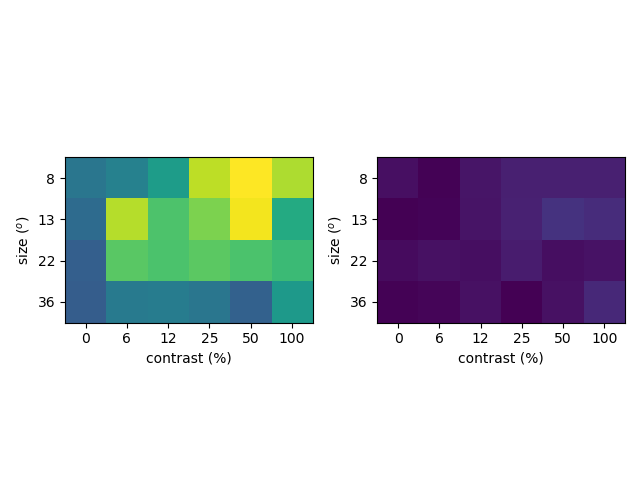

<IPython.core.display.Javascript object>


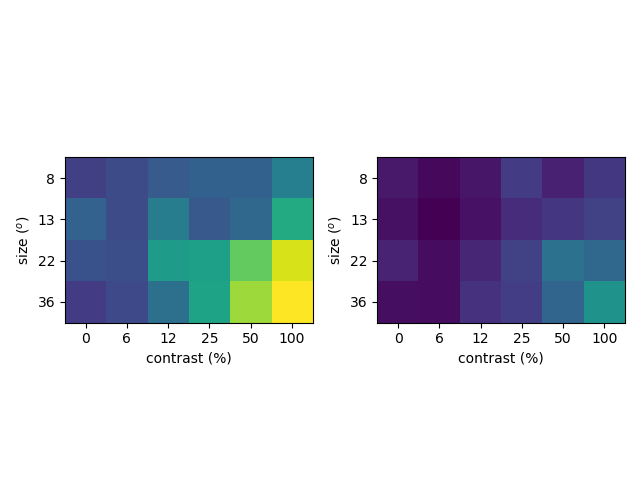

<IPython.core.display.Javascript object>


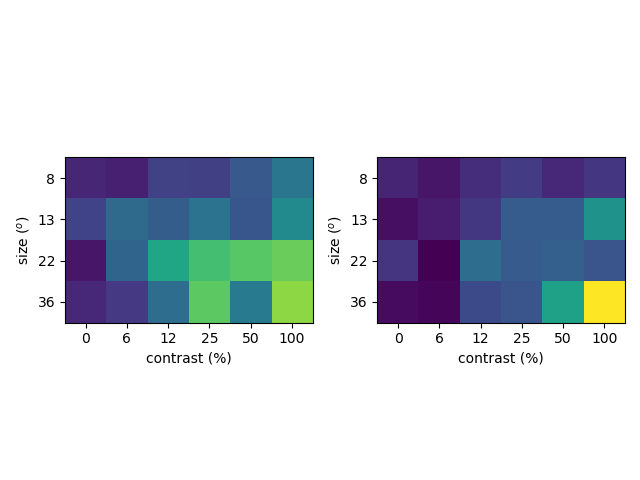

<IPython.core.display.Javascript object>


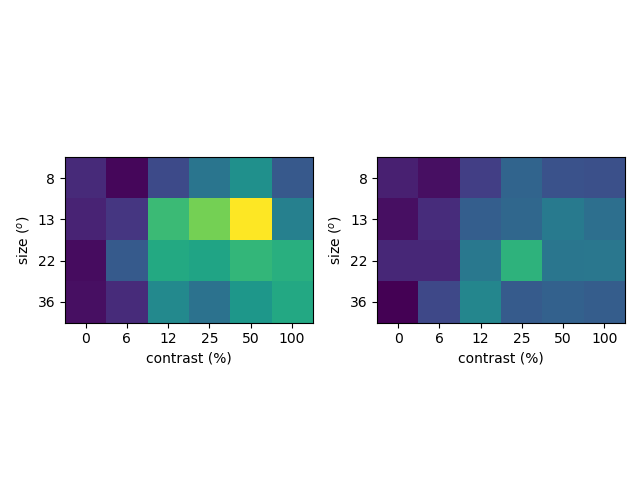

<IPython.core.display.Javascript object>


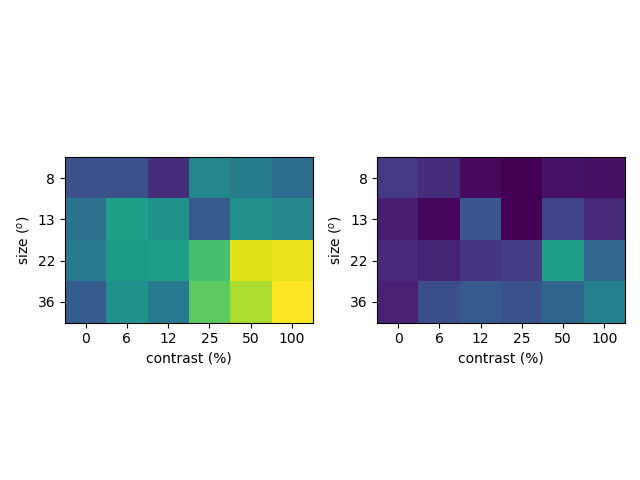

<IPython.core.display.Javascript object>


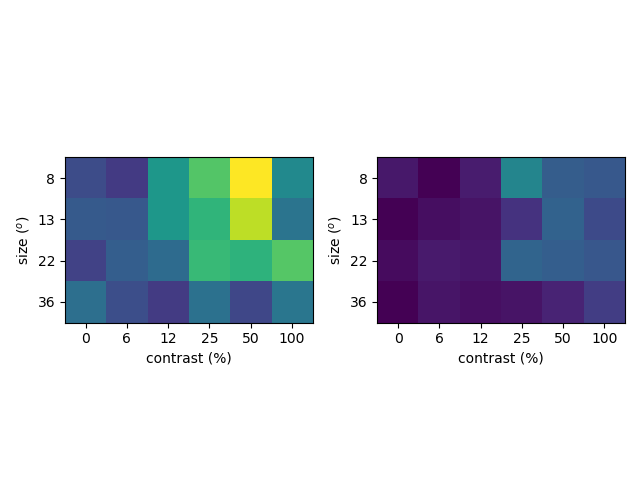

<IPython.core.display.Javascript object>


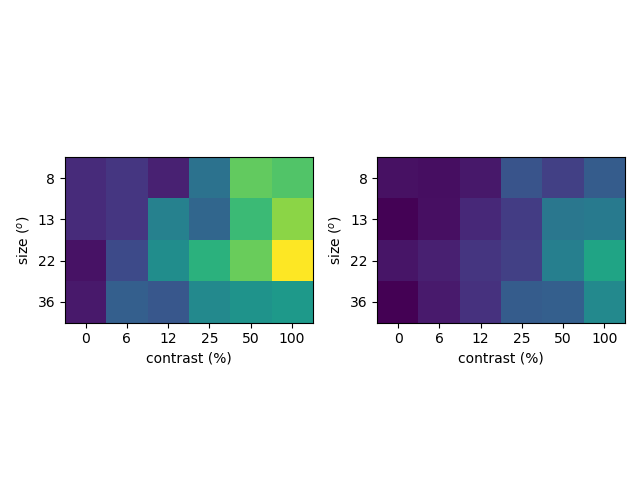

<IPython.core.display.Javascript object>


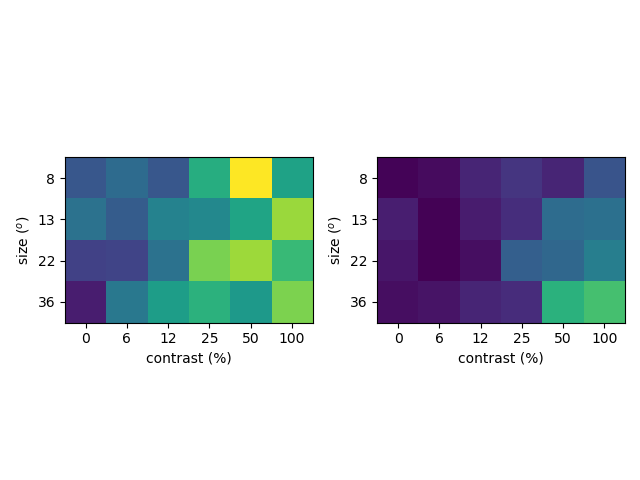

<IPython.core.display.Javascript object>


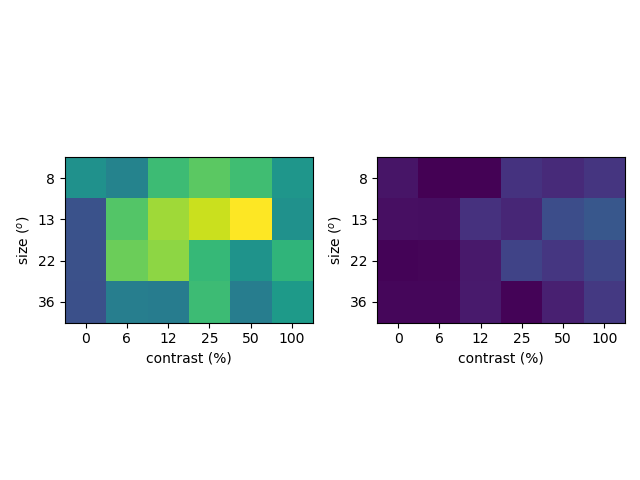

<IPython.core.display.Javascript object>


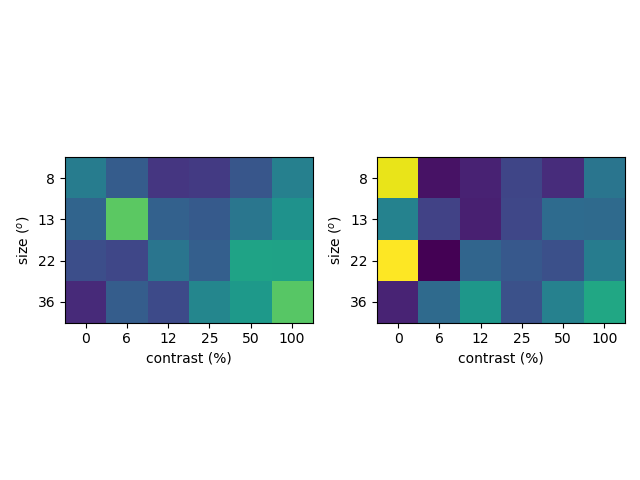

<IPython.core.display.Javascript object>


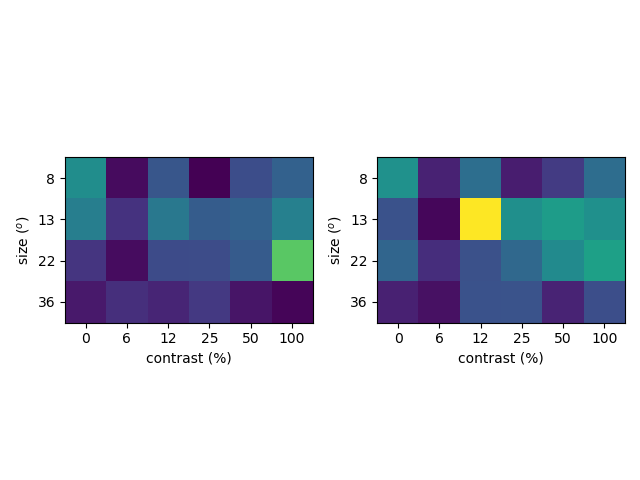

<IPython.core.display.Javascript object>


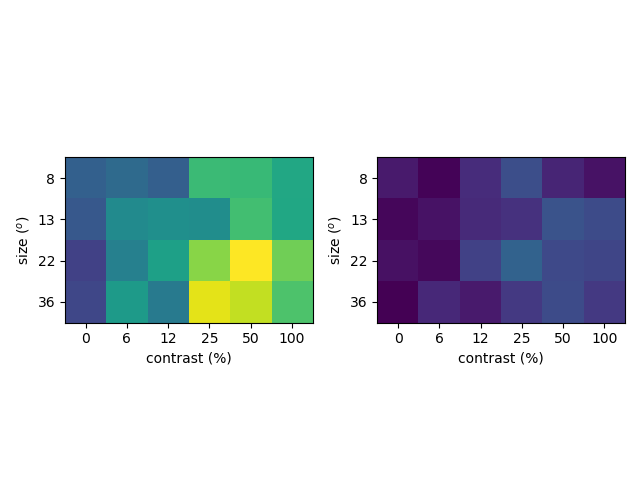

<IPython.core.display.Javascript object>


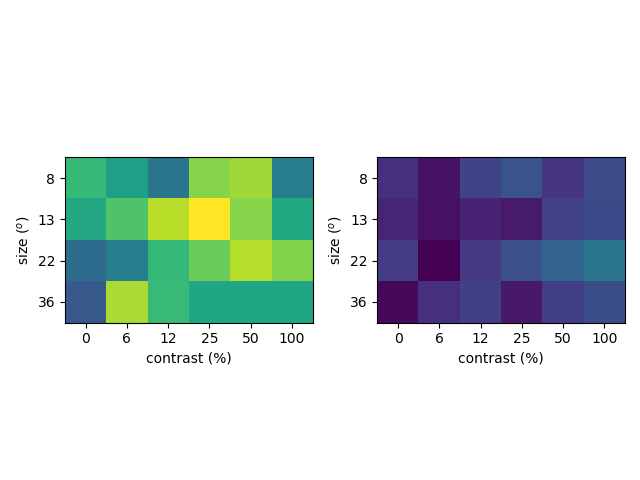

<IPython.core.display.Javascript object>


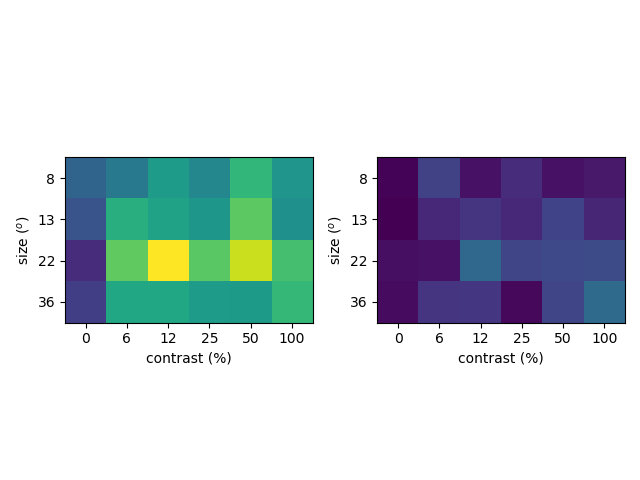

<IPython.core.display.Javascript object>


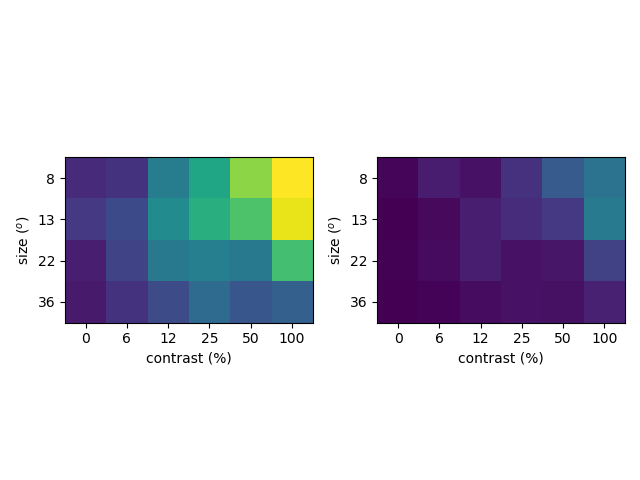

<IPython.core.display.Javascript object>


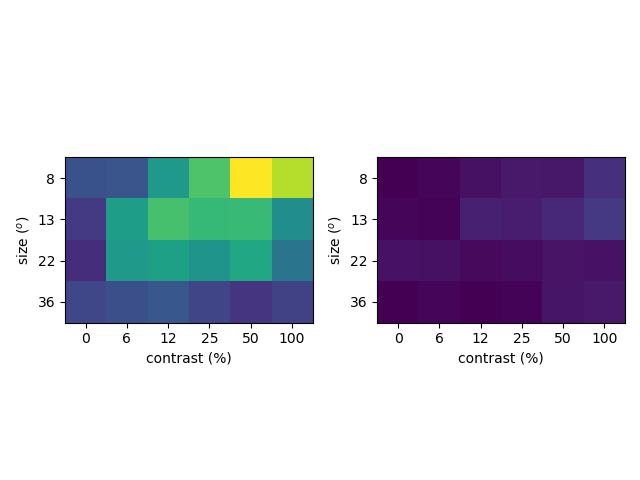

<IPython.core.display.Javascript object>


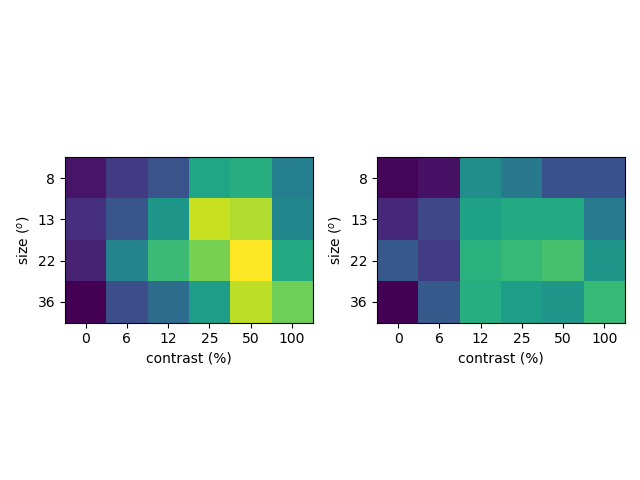

<IPython.core.display.Javascript object>


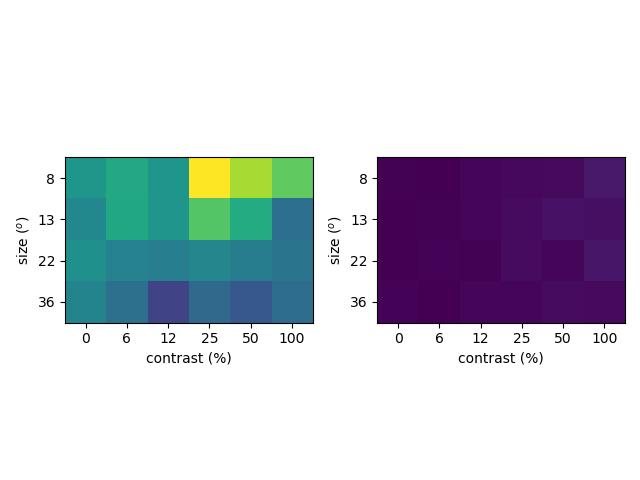

<IPython.core.display.Javascript object>


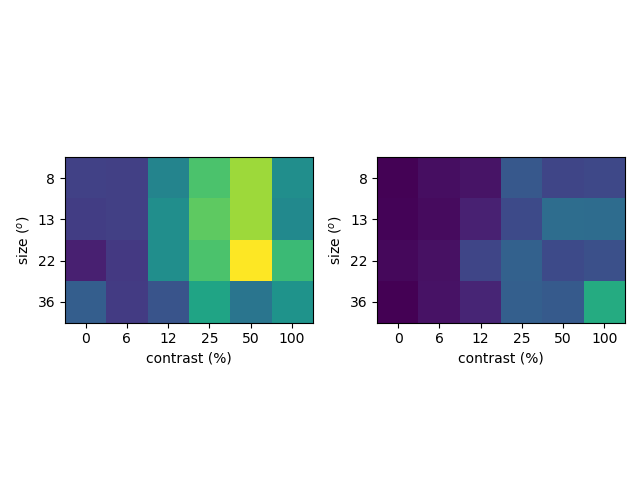

<IPython.core.display.Javascript object>


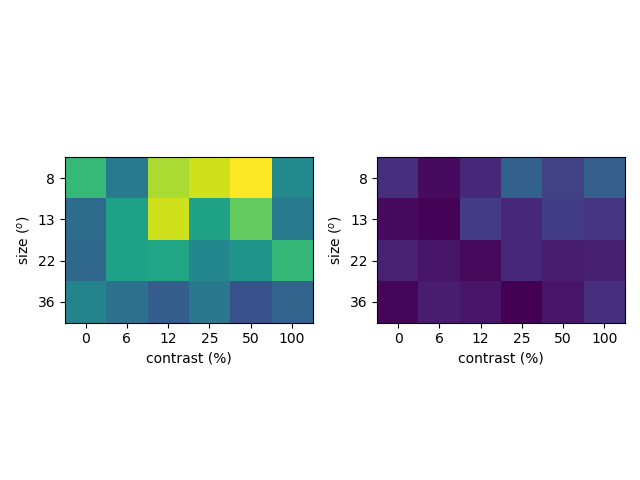

<IPython.core.display.Javascript object>


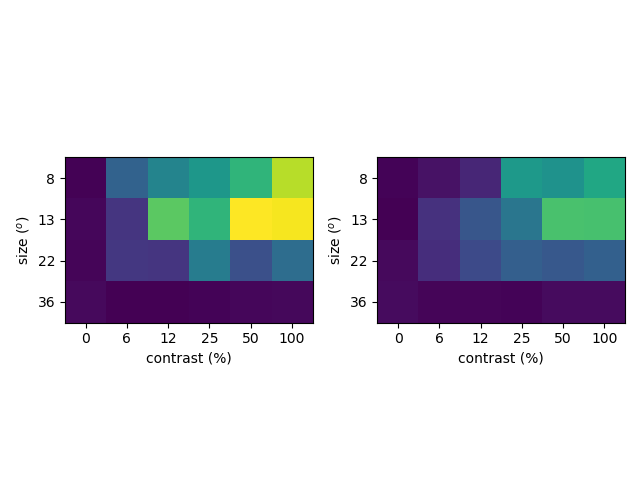

In [109]:
ikey = 3
for ind in (46, 112, 126, 131, 185, 217, 259, 260, 281, 284, 321, 335, 352, 366, 409, 427, 428, 450, 484, 495, 574, 901): # ...
    sc = np.nanmean(np.nanmean(tuning[ikey][ind,:,:,:,:,nbefore:-nafter],-1),-2)
    mn = sc.min()
    mx = sc.max()
    plt.figure()
    plt.subplot(1,2,1)
    sca.show_size_contrast(sc[:,:,0],vmin=mn,vmax=mx,usize=(8,13,22,36))
    plt.subplot(1,2,2)
    sca.show_size_contrast(sc[:,:,0],vmin=mn,vmax=mx,usize=(8,13,22,36))
    plt.tight_layout()

In [108]:
keylist[ikey]

'session_190730_M0140'

<IPython.core.display.Javascript object>


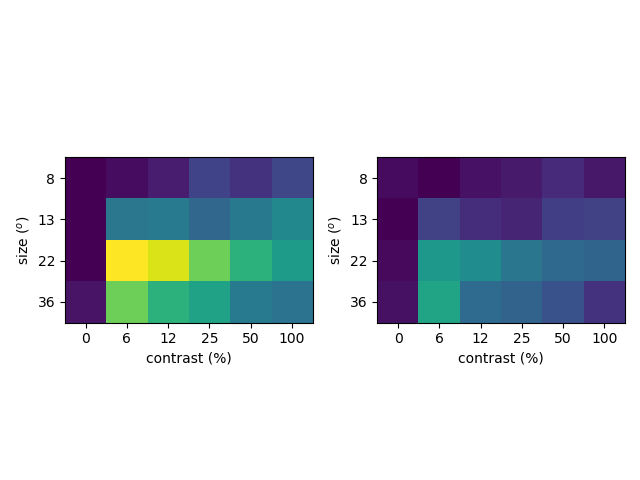

<IPython.core.display.Javascript object>


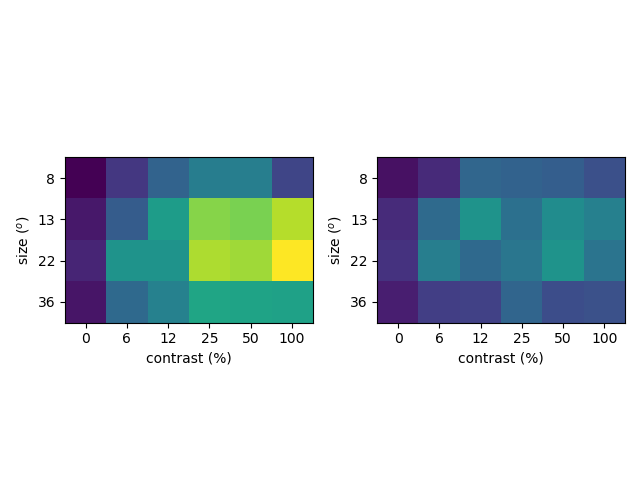

<IPython.core.display.Javascript object>


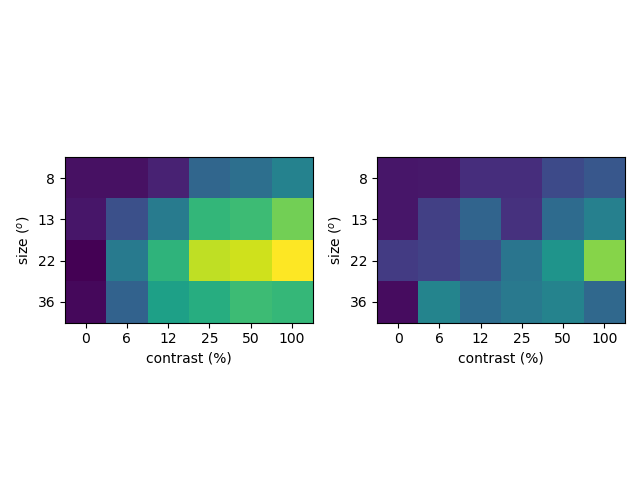

<IPython.core.display.Javascript object>


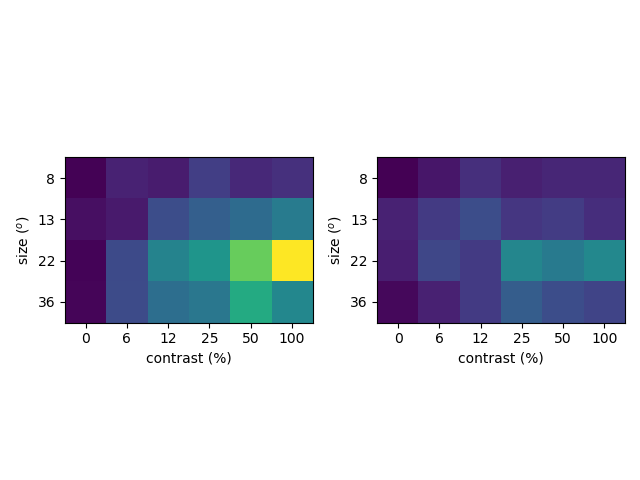

<IPython.core.display.Javascript object>


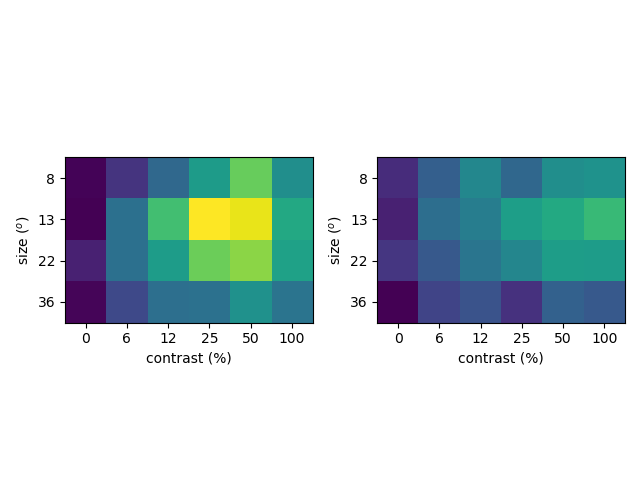

<IPython.core.display.Javascript object>


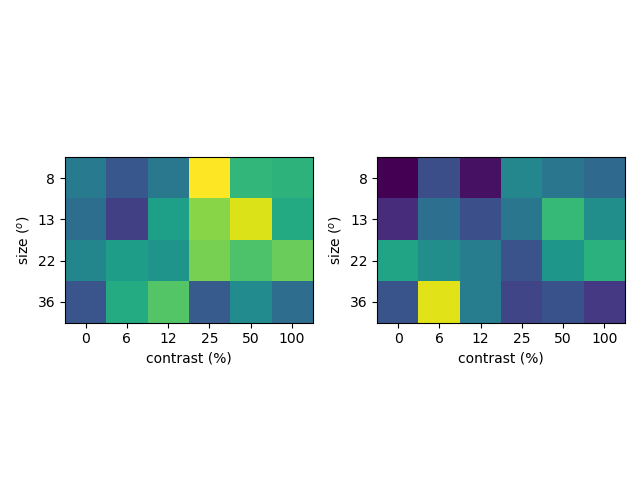

<IPython.core.display.Javascript object>


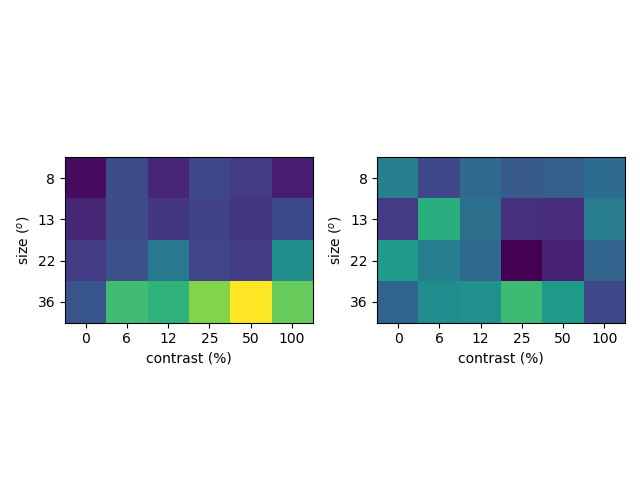

<IPython.core.display.Javascript object>


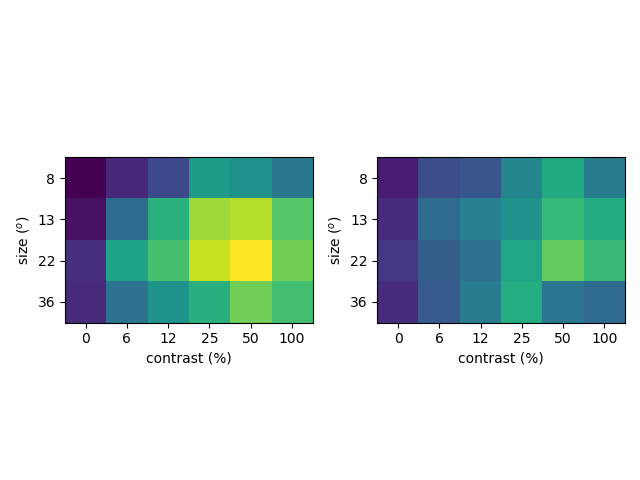

<IPython.core.display.Javascript object>


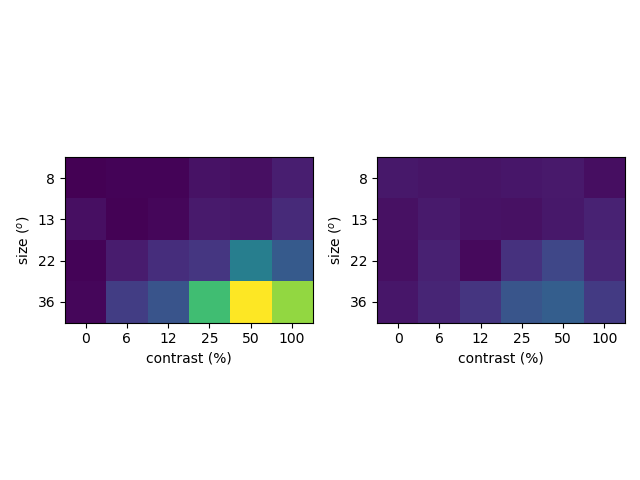

<IPython.core.display.Javascript object>


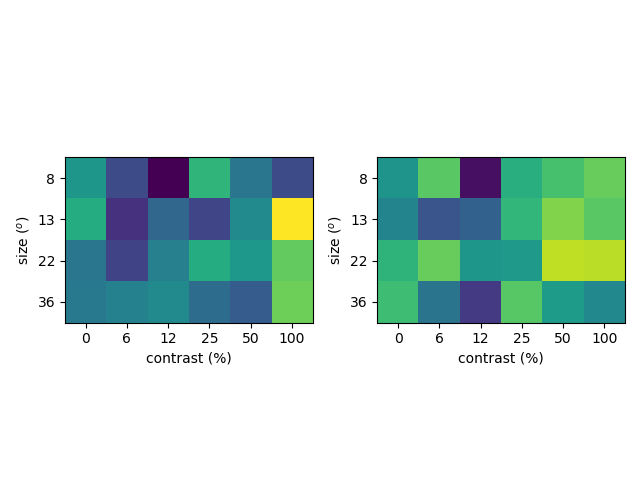

In [104]:
ikey = 1
for ind in (81,82,87,125,233,280,281,412,443,518):
    sc = np.nanmean(np.nanmean(tuning[ikey][ind,:,:,:,:,nbefore:-nafter],-1),-2)
    mn = sc.min()
    mx = sc.max()
    plt.figure()
    plt.subplot(1,2,1)
    sca.show_size_contrast(sc[:,:,0],vmin=mn,vmax=mx,usize=(8,13,22,36))
    plt.subplot(1,2,2)
    sca.show_size_contrast(sc[:,:,1],vmin=mn,vmax=mx,usize=(8,13,22,36))
    plt.tight_layout()

/home/mossing/anaconda3/envs/py3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


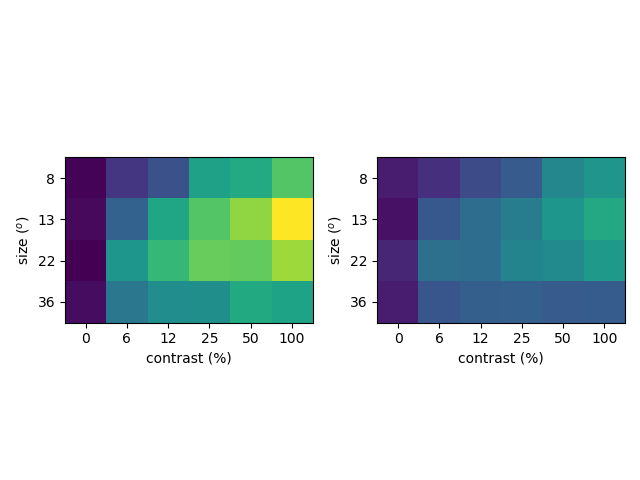

In [107]:
mn = size_contrast.mean(0).min()
mx = size_contrast.mean(0).max()
plt.figure()
plt.subplot(1,2,1)
sca.show_size_contrast(size_contrast[:,:,:,0].mean(0),vmin=mn,vmax=mx,usize=(8,13,22,36))
plt.subplot(1,2,2)
sca.show_size_contrast(size_contrast[:,:,:,1].mean(0),vmin=mn,vmax=mx,usize=(8,13,22,36))
plt.tight_layout()
#plt.savefig('figures/opto_comparison_all_animal_average.pdf')

<IPython.core.display.Javascript object>


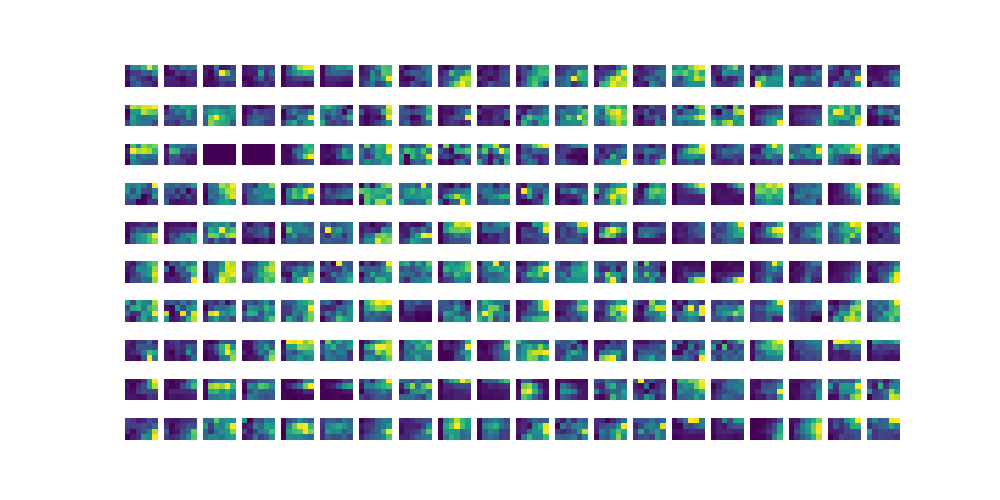

In [86]:
N = 100
selection = np.random.permutation(size_contrast.shape[0])[:N]
ut.imshow_in_pairs(size_contrast[selection,:,:,0],size_contrast[selection,:,:,1])

In [43]:
r = size_contrast[:,:,:,0].reshape((size_contrast.shape[0],-1))
rl = size_contrast[:,:,:,1].reshape((size_contrast.shape[0],-1))

In [46]:
u,s,v = np.linalg.svd(r)
ul = rl @ v.T @ np.diag(1/s)

<IPython.core.display.Javascript object>


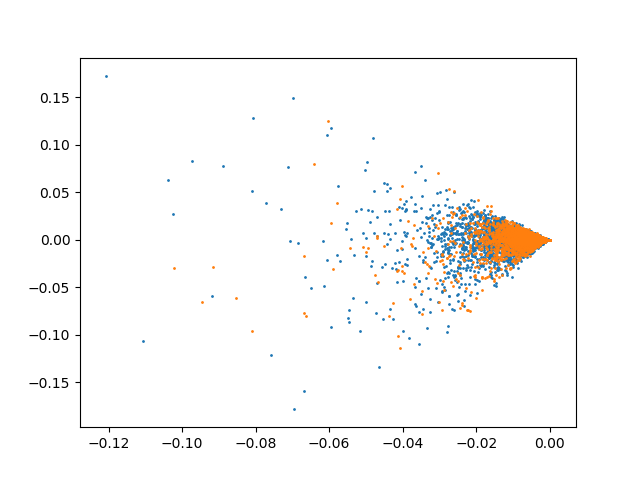

In [47]:
plt.figure()
plt.scatter(u[:,0],u[:,1],s=1)
plt.scatter(ul[:,0],ul[:,1],s=1)

<IPython.core.display.Javascript object>


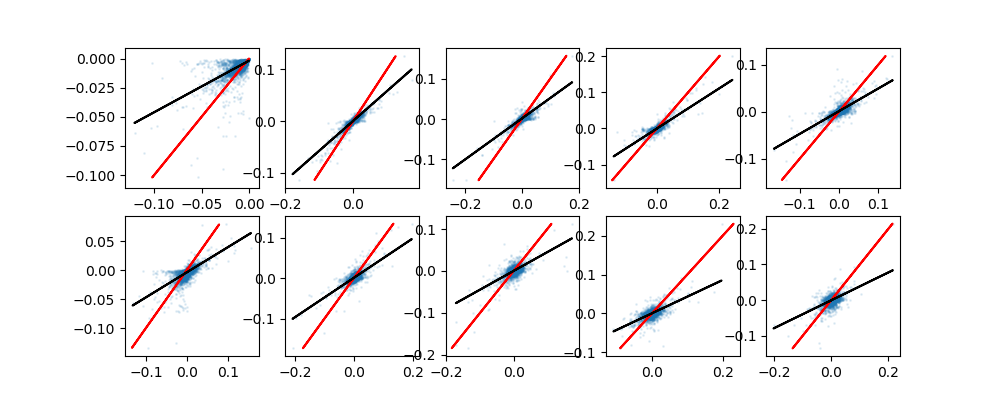

In [64]:
plt.figure(figsize=(10,4))
for k in range(10):
    linreg = sklearn.linear_model.LinearRegression().fit(u[:,k:k+1],ul[:,k])
    plt.subplot(2,5,k+1)
    plt.scatter(u[:,k],ul[:,k],s=1,alpha=0.1)
    plt.plot(ul[:,k],ul[:,k],c='r')
    plt.plot(u[:,k],linreg.predict(u[:,k:k+1]),c='k')

In [28]:
i = 100
effect = np.nanmean(np.nanmean(size_contrast[:,:,:,0]-size_contrast[:,:,:,1],axis=1),axis=1)

(array([  1.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   1.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   1.,   0.,   0.,   0.,   0.,   1.,
          1.,   1.,   1.,   1.,   0.,   0.,   0.,   1.,   0.,   2.,   1.,
          4.,   2.,   2.,   4.,   6.,  20.,  39., 143., 138.,  84.,  62.,
         39.,  22.,  20.,  17.,  16.,  13.,   9.,   7.,  10.,   5.,  10.,
          5.,   3.,   1.,   2.,   0.,   2.,   3.,   2.,   2.,   2.,   1.,
          0.,   2.,   1.,   2.,   0.,   2.,   0.,   1.,   1.,   0.,   0.,
          1.]),
 array([-0.18970671, -0.18667648, -0.18364626, -0.18061604, -0.17758581,
        -0.17455559, -0.17152536, -0.16849514, -0.16546492, -0.16243469,
        -0.15940447, -0.15637425, -0.15334402, -0.1503138 , -0.14728357,
        -0.14425335, -0.14122313, -0.1381929 , -0.13516268, -0.13213245,
        -0.12910223, -0.12

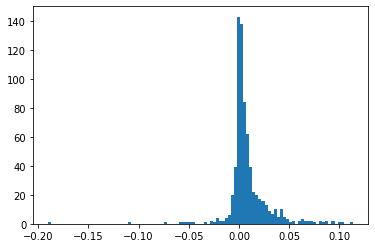

In [30]:
plt.figure()
plt.hist(effect,bins=100)

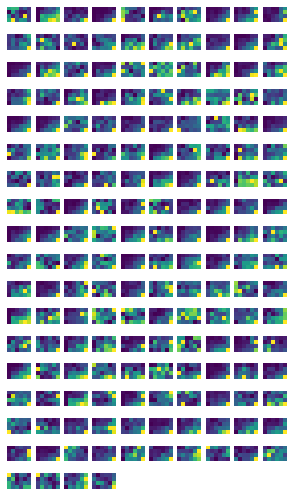

In [42]:
ut.imshow_in_rows(size_contrast[effect<0,:,:,0])
plt.savefig('figures/what_goes_down.pdf')

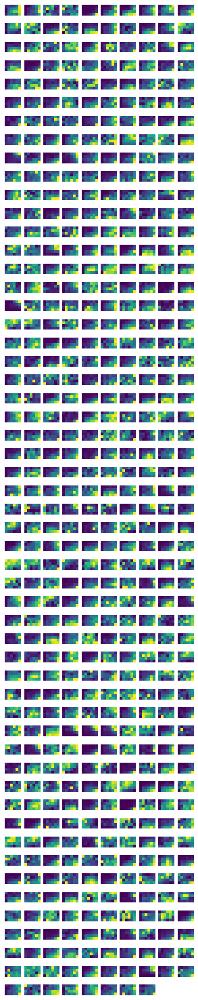

In [43]:
ut.imshow_in_rows(size_contrast[effect>0,:,:,0])
plt.savefig('figures/what_goes_up.pdf')

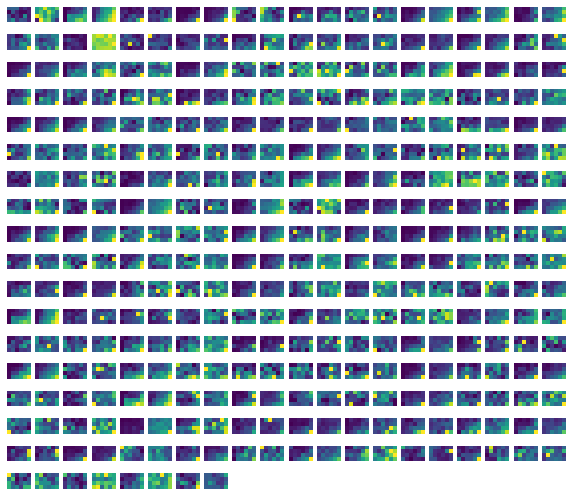

In [44]:
ut.imshow_in_pairs(size_contrast[effect<0,:,:,0],size_contrast[effect<0,:,:,1])
plt.savefig('figures/what_goes_down_and_how.pdf')

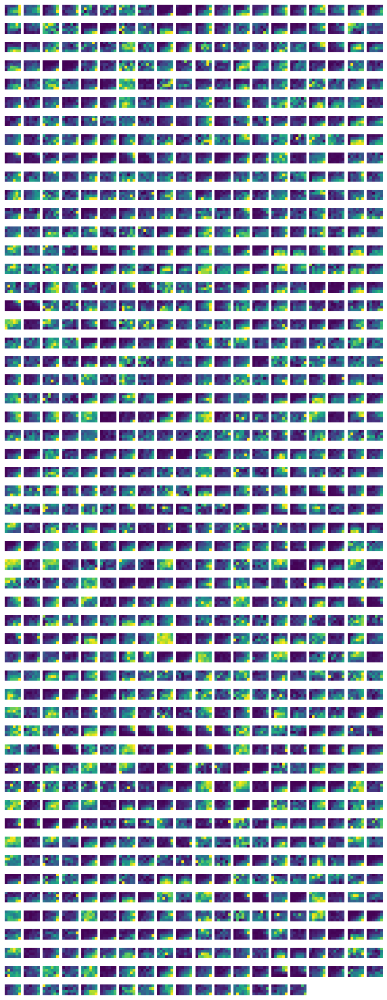

In [45]:
ut.imshow_in_pairs(size_contrast[effect>0,:,:,0],size_contrast[effect>0,:,:,1])
plt.savefig('figures/what_goes_up_and_how.pdf')

In [47]:
R = size_contrast.reshape((size_contrast.shape[0],-1))

In [48]:
u,s,v = np.linalg.svd(R)

In [57]:
msc = np.nanmean(size_contrast,0)

In [58]:
def show_light_on_off(arr):
    for ll in range(2):
        plt.subplot(1,2,ll+1)
        plt.imshow(arr[:,:,ll],vmin=arr.min(),vmax=arr.max())

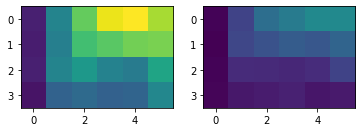

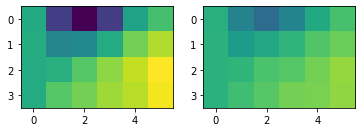

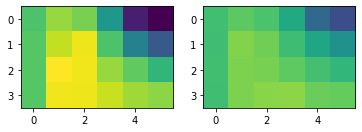

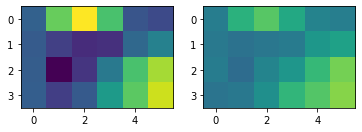

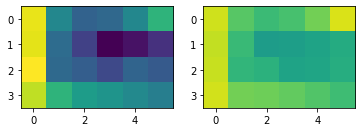

...

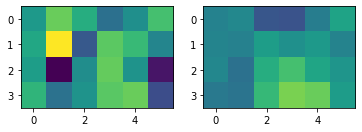

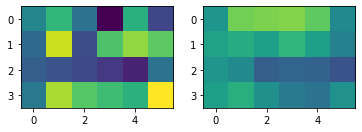

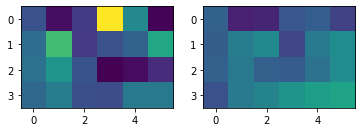

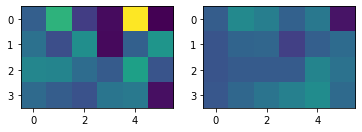

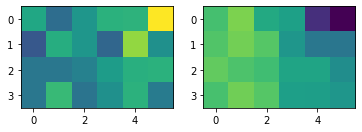

In [63]:
Vr = v.reshape((-1,4,6,2))
for i in range(15):
    plt.figure()
    show_light_on_off(Vr[i]*np.sign(Vr[i].mean()))

 ...]

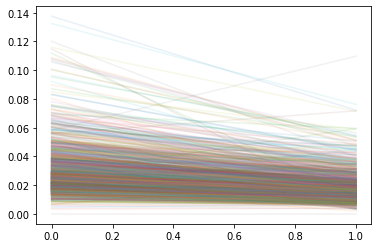

In [46]:
sc = size_contrast.mean(1).mean(1)
plt.figure()
plt.plot(sc.T,alpha=0.1)

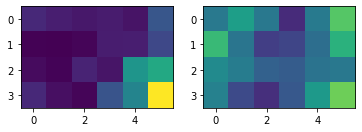

In [41]:
# ikey = 2
# plt.figure()
# for ll in range(2):
#     plt.subplot(1,2,ll+1)
#     plt.imshow(size_contrast[180,:,:,ll],vmin=size_contrast[180].min(),vmax=size_contrast[180].max())

In [17]:
print(tuning[2].shape)

(610, 4, 6, 8, 20)


In [15]:
dsfile

'/home/mossing/Documents/notebooks/opto1p/data/vip_halo_data_struct.hdf5'